# Models

In [ ]:
import numpy as np
from scipy.stats import gamma, norm
# get truncated gamma and normal distributions
from scipy.stats import truncnorm
# from truncnorm get gamma and normal distributions


class SlopeMAPPerceptual:
    def __init__(self, *args, **kwargs):
        # print('hey')
        # Leak parameter
        self.leak = kwargs.get('leak', 0)
        # x values = forcefield values
        self.x = kwargs.get('x', np.linspace(-1, 1, 9).round(2))
        if not isinstance(self.x, np.ndarray):
            self.x = np.array(list(self.x))
        
        # Initialize outcome-based prior
        # Slope prior mean and standard deviation
        self.slope_prior_mean = kwargs.get('slope_prior_mean', 0.0)  # Default mean to 0
        self.slope_prior_std = kwargs.get('slope_prior_std', 1.0)    # Default std to 1.0
        
        # Ensure the prior standard deviation is positive
        self.slope_prior_std = max(0.001, self.slope_prior_std)  # Set a minimum value
        
        # Possible values for the slope
        self.slope_range = kwargs.get('slope_range', np.arange(-10, 10, 0.1))
        
        # Initialize log-posterior for the slope with prior
        self.lp_slope = np.log(norm.pdf(self.slope_range, self.slope_prior_mean, self.slope_prior_std))
        
        # Define logit function
        self.logit = lambda x: 1 / (1 + np.exp(x))
        
    def perceptual_update(self, choice, outcome):
        """Update the log-posterior of the slope based on observed data."""
        v = self.slope_range * choice
        v = v - v * 2 * outcome  # Switch to negative if forcefield destroyed
   
        # Binary outcome likelihood
        ll = np.log(self.logit(v))
        # Update log posterior
        self.lp_slope += ll
           
    def predict_shield_p(self, shields):
        """Predict outcomes (linear or logit) for given forcefields."""
        # Predict for 2 displayed forcefields
        x = np.arange(len(self.x))
        to_select = x[np.isin(self.x, shields)]
        return self.logit(-self.get_slope() * self.x[to_select])
    
    def get_slope(self):
        """Compute the current slope as the weighted mean of the slope range."""
        w = np.exp(self.lp_slope - np.max(self.lp_slope))
        slope = np.sum(w * self.slope_range) / np.sum(w)
        return slope

class NormativePerceptual:
    def __init__(self, prior_mean=[0, 0], prior_cov=[[1, 0], [0, 1]], burn_in=500, samples=1000):
        """
        Bayesian Probit Model using Gibbs sampling.
        
        Parameters:
            prior_mean : list of prior means [β, α]
            prior_cov : prior covariance matrix (2x2)
            burn_in : number of burn-in samples
            samples : number of posterior samples after burn-in
        """
        self.m0 = np.array(prior_mean)
        self.S0 = np.array(prior_cov)
        self.burn_in = burn_in
        self.samples = samples
        self.theta_samples = []  # to store (β, α) samples
        
    def perceptual_update(self, z, b):
        """
        Perform Gibbs sampling given data.

        Parameters:
            z : 1D numpy array of shield strengths
            b : 1D numpy array of binary outcomes (0 or 1)
        """
        n = len(z)
        Z = np.column_stack((np.ones(n), z))  # Design matrix
        theta = np.random.multivariate_normal(self.m0, self.S0)  # Initial guess for (β, α)

        all_samples = []

        for t in range(self.burn_in + self.samples):
            # Step 1: sample latent u
            eta = Z @ theta
            u = np.zeros(n)

            for i in range(n):
                if b[i] == 1:
                    a, b_ = (0 - eta[i]), np.inf
                else:
                    a, b_ = -np.inf, (0 - eta[i])
                u[i] = truncnorm.rvs(a, b_, loc=eta[i], scale=1)

            # Step 2: sample (β, α)
            S_post_inv = np.linalg.inv(self.S0) + Z.T @ Z
            S_post = np.linalg.inv(S_post_inv)
            m_post = S_post @ (np.linalg.inv(self.S0) @ self.m0 + Z.T @ u)
            theta = np.random.multivariate_normal(m_post, S_post)

            if t >= self.burn_in:
                all_samples.append(theta)

        self.theta_samples = np.array(all_samples)
        
    def perceptual_update2(self, z, b):
        """
        Perform Gibbs sampling given data.

        Parameters:
            z : 1D numpy array of shield strengths
            b : 1D numpy array of binary outcomes (0 or 1)
        """
        n = len(z)
        Z = np.column_stack((np.ones(n), z))  # Design matrix
        theta = np.random.multivariate_normal(self.m0, self.S0)  # Initial guess for (β, α)

        all_samples = []
                # Pre-calculate constant terms
        S0_inv = np.linalg.inv(self.S0)
        ZtZ = Z.T @ Z
        S0_inv_m0 = S0_inv @ self.m0

        for t in range(self.burn_in + self.samples):
            # Step 1: sample latent u
            eta = Z @ theta
            # Vectorized sampling of u
            idx_b1 = (b == 1)
            idx_b0 = (b == 0)

            a_bounds = np.full(n, -np.inf)
            b_bounds = np.full(n, np.inf)

            a_bounds[idx_b1] = -eta[idx_b1]
            b_bounds[idx_b0] = -eta[idx_b0]

            u = truncnorm.rvs(a_bounds, b_bounds, loc=eta, scale=1)

            # Step 2: sample (β, α)
            # Step 2: sample (β, α)
            S_post_inv = S0_inv + ZtZ  # Use pre-calculated terms            
            S_post = np.linalg.inv(S_post_inv)
          
            m_post = S_post @ (S0_inv_m0 + Z.T @ u) # Use pre-calculated S0_inv @ m0
            theta = np.random.multivariate_normal(m_post, S_post)


            if t >= self.burn_in:
                all_samples.append(theta)

        self.theta_samples = np.array(all_samples)

    def perceptual_update3(self, z, b):
        """
        Perform Gibbs sampling given data with a fallback for small sample sizes
        or invalid truncation bounds.

        Parameters:
            z : 1D numpy array of shield strengths
            b : 1D numpy array of binary outcomes (0 or 1)
        """
        if self.model == 'value':
            return 
        
        n = len(z)
        Z = np.column_stack((np.ones(n), z))  # Design matrix
        theta = np.random.multivariate_normal(self.m0.ravel(), self.S0)  # Initial guess for (β, α)

        all_samples = []

        # Pre-calculate constant terms
        S0_inv = np.linalg.inv(self.S0)
        ZtZ = Z.T @ Z
        S0_inv_m0 = S0_inv @ self.m0

        for t in range(self.burn_in + self.samples):
            # Step 1: sample latent u
            eta = Z @ theta
            a_bounds = np.full(n, -np.inf)
            b_bounds = np.full(n, np.inf)

            # Adjust bounds based on b
            a_bounds[b == 1] = -eta[b == 1]
            b_bounds[b == 0] = -eta[b == 0]

            # Safe sampling with fallback for small n or invalid bounds
            fallback = n < 10 or np.any(a_bounds > b_bounds)
            if fallback:
                u = np.zeros(n)
                for i in range(n):
                    a, b_ = a_bounds[i], b_bounds[i]
                    if a > b_:
                        raise ValueError(f"Invalid truncation bounds at index {i}: a > b")
                    u[i] = truncnorm.rvs(a, b_, loc=eta[i], scale=1)
            else:
                u = truncnorm.rvs(a_bounds, b_bounds, loc=eta, scale=1)

            # Step 2: sample (β, α)
            S_post_inv = S0_inv + ZtZ
            S_post = np.linalg.inv(S_post_inv)
            m_post = S_post @ (S0_inv_m0 + Z.T @ u)
            theta = np.random.multivariate_normal(m_post, S_post)

            if t >= self.burn_in:
                all_samples.append(theta)

        self.theta_samples = np.array(all_samples)


    def predict_shield_p(self, shield):
        """
        Compute predictive probability p(b=1 | z) using posterior samples.

        Parameters:
            shield : scalar value (z*)

        Returns:
            Posterior predictive probability for that shield strength.
        """
        if self.model == 'value':
            return 1.0
        if len(self.theta_samples) == 0:
            raise ValueError("You must run perceptual_update() first.")
        

        β = self.theta_samples[:, 0]
        α = self.theta_samples[:, 1]
        preds = norm.cdf(β + α * shield)
        return preds.mean()

class NormativeValue:
    def __init__(self, spaceship_ids, mu0=.5, kappa0=1, alpha0=2, beta0=0.1):
        """
        Bayesian reward model using Normal-Gamma conjugate prior for multiple spaceships.

        Parameters:
            spaceship_ids : list of spaceship identifiers (ints or strings)
            mu0, kappa0, alpha0, beta0 : prior hyperparameters for all spaceships
        """
        self.mu0 = mu0
        self.kappa0 = kappa0
        self.alpha0 = alpha0
        self.beta0 = beta0

        self.data = {sid: [] for sid in spaceship_ids}

    def value_update(self, spaceship_id, reward):
        """
        Add an observed reward for a specific spaceship.

        Parameters:
            spaceship_id : ID of the spaceship
            reward : observed scalar reward
        """
        if spaceship_id not in self.data:
            raise ValueError(f"Unknown spaceship ID: {spaceship_id}")
        self.data[spaceship_id].append(reward)

    def compute_posterior(self, spaceship_id):
        """
        Compute the posterior parameters for a given spaceship.
        """
        if self.model == 'perceptual':
            return 
            
        xi = np.array(self.data[spaceship_id])
        n = len(xi)

        if n == 0:
            return self.mu0, self.kappa0, self.alpha0, self.beta0

        x_bar = xi.mean()
        S = np.sum((xi - x_bar) ** 2)

        kappa_n = self.kappa0 + n
        mu_n = (self.kappa0 * self.mu0 + n * x_bar) / kappa_n
        alpha_n = self.alpha0 + n / 2
        beta_n = self.beta0 + 0.5 * S + (self.kappa0 * n * (x_bar - self.mu0) ** 2) / (2 * kappa_n)

        return mu_n, kappa_n, alpha_n, beta_n

    def posterior_predictive_mean(self, spaceship_id):
        """
        Return the expected value (mean) of the predictive distribution for a spaceship.
        """
        if self.model == 'perceptual':
            return 1.0
        mu_n, _, _, _ = self.compute_posterior(spaceship_id)
        return mu_n

    def sample_posterior(self, spaceship_id, n_samples=1000):
        """
        Sample possible mean rewards for a spaceship from the posterior predictive distribution.
        """
        mu_n, kappa_n, alpha_n, beta_n = self.compute_posterior(spaceship_id)

        tau_samples = gamma.rvs(a=alpha_n, scale=1 / beta_n, size=n_samples)
        mu_samples = norm.rvs(loc=mu_n, scale=1 / np.sqrt(kappa_n * tau_samples))
        #truncated normal distribution
        mu_samples = truncnorm.rvs(a=0, b=1, loc=mu_samples, scale=1 / np.sqrt(kappa_n * tau_samples))

        return mu_samples

    def reset(self, spaceship_id=None):
        """
        Reset observations for one or all spaceships.
        """
        if spaceship_id is None:
            for sid in self.data:
                self.data[sid] = []
        else:
            self.data[spaceship_id] = []

class NormativePolicy(NormativeValue):
    def __init__(self, spaceship_ids, mu0=.5, kappa0=1, alpha0=2, beta0=0.1,
                 burn_in=500, samples=1000, model=False, omega=0, beta=1):
        NormativeValue.__init__(self, spaceship_ids, mu0, kappa0, alpha0, beta0)
        if model == 'gibbs':
            print('model is gibbs')
            self.perceptual = NormativePerceptual(burn_in=burn_in, samples=samples)
            self.perceptual.model = 'gibbs'
        else:
            print('model is map')
            self.perceptual = SlopeMAPPerceptual()
            self.perceptual.model = 'map'
        self.perceptual_update = self.perceptual.perceptual_update
        self.predict_shield_p = self.perceptual.predict_shield_p
        
        self.omega = omega
        self.beta = beta
        self.model = model
        self.v_log_ratio_list = []
        self.p_log_ratio_list = []
        self.v_log_ratio = 0
        self.p_log_ratio = 0

    def expected_reward(self, spaceship_id, shield_strength):
        """
        Compute the expected reward for a spaceship given a shield strength z

        Parameters:
            spaceship_id : spaceship ID
            shield_strength : scalar z*

        Returns:
            Expected reward E[Y | z*, Z, B, X]
        """
        # Step 1: compute P(b=1 | z*) from probit model
        p_success = 1.0  # Default if no shield strength is provided
        if ~np.isnan(shield_strength) and self.model != 'value':
            p_success = self.perceptual.predict_shield_p(shield_strength)

        # Step 2: compute E[μ | X] from reward model
        E_mu = 1.0 
        if self.model != 'perceptual':
            mu_n, kappa_n, _, _ = self.compute_posterior(spaceship_id)
            E_mu = mu_n

        # Step 3: combine both
        return p_success, E_mu

    def get_spaceship_mean(self, spaceship_id):
        E_mu = 1.0
        if self.model != 'perceptual':
            mu_n, kappa_n, _, _ = self.compute_posterior(spaceship_id)
            E_mu = mu_n
        return E_mu
    
    def get_shield_probability(self, shield_strength):
        p_success = 1.0
        if ~np.isnan(shield_strength) and self.model != 'value':
            p_success = self.perceptual.predict_shield_p(shield_strength)
        return p_success

    def choose(self, spaceships, shields):
        """
        compute the expected reward for a spaceship given a shield strength z
        and select the one that tends to maximize it.
        """

        p1, p2 = [self.get_shield_probability(x) for x in shields]
        v1, v2 = [self.get_spaceship_mean(x) for x in spaceships]
    
        v_lr = np.log(v1) - np.log(v2)
        p_lr = np.log(p1) - np.log(p2)

        self.v_log_ratio_list.append(v_lr)  
        self.p_log_ratio_list.append(p_lr)

        v_lr = v_lr / 0.59
        p_lr = p_lr / 0.74        
        
        dv = (1-self.omega) * v_lr + self.omega * p_lr

        return int(np.random.random() > (1/(1 + np.exp(self.beta*-dv))))
    
    def get_likelihood(self, spaceships, shields):
        """
        computes the likelihood of both options
        given the shield strengths and  spaceships
        """

        p1, p2 = [self.get_shield_probability(x) for x in shields]
        v1, v2 = [self.get_spaceship_mean(x) for x in spaceships]
    
        v_lr = np.log(v1) - np.log(v2)
        p_lr = np.log(p1) - np.log(p2)

        v_lr = v_lr / 0.59
        p_lr = p_lr / 0.74        
        
        dv = (1-self.omega) * v_lr + self.omega * p_lr

        # estimated p of choosing option 1
        ep1 = 1/(1 + np.exp(self.beta*-dv))

        return [ep1, 1-ep1]
        
        
    def choose2(self, spaceships, shields):
        """
        compute the expected reward for a spaceship given a shield strength z
        and select the one that tends to maximize it.
        """

        p1, p2 = [self.get_shield_probability(x) for x in shields]
        v1, v2 = [self.get_spaceship_mean(x) for x in spaceships]
    
        self.v_log_ratio = np.log(v1) - np.log(v2)
        self.p_log_ratio = np.log(p1) - np.log(p2)

        # # v_lr = v_lr / np.std(self.v_log_ratio_list)
        # # p_lr = p_lr / np.std(self.p_log_ratio_list)

        # dv = (1-self.omega) * v_lr + self.omega * p_lr

        # return int(np.random.random() > (1/(1 + np.exp(self.beta*-dv))))
        
        # # not a dic now but two arrays
        expected_rewards = [
            sid*shield
            for sid, shield in zip([v1, v2], [p1, p2])
        ]
        return np.argmax(expected_rewards)

        #best_id = max(expected_rewards, key=expected_rewards.get)
        


In [ ]:
import itertools
from scipy.special import logsumexp
from scipy.stats import norm

def fit(x0, *args):
    # print('Running fit...')
    exp, model, session, ntrials, s, a, r, destroy, ff1, ff2, ff_values = args
    try:
        _ = len(x0)
    except:
        x0 = [x0]

    if model == 'map':
        omega = x0[0]
        beta = x0[1]
        m = NormativePolicy(
            spaceship_ids=[280, 380, 500, 620, 720],
            omega=omega,
            beta=beta,
        )
    
    if model != 'random':
        ll = 0

        for t in range(ntrials):
                
            if session[t] in (1, 3) and ('value' not in model):
                ff_chosen = [ff1[t], ff2[t]][a[t]]
                if exp == 'FullPilot14':
                    m.perceptual_update(ff_chosen, r[t])
                else:
                    m.perceptual_update(ff_chosen, destroy[t])

            if session[t] in (0, 2, 3) and ('perceptual' not in model):
                if destroy[t] or exp == 'FullPilot14':
                    m.value_update(s[t][a[t]], r[t])

            if session[t] == 3:    
                p_of_choices = m.get_likelihood(s[t], [ff1[t], ff2[t]])
                ll += np.log(p_of_choices[a[t]] + 1e-10)
    else:
        ll = 0
        for t in range(ntrials):
            ll += np.log(np.exp([.5, .5] - logsumexp([.5, .5])))[0]

    beta_prior_logpdf = norm.logpdf(beta, loc=1e5/2, scale=5)
    # check that beta prior is a valid number
    if np.isnan(beta_prior_logpdf):
        beta_prior_logpdf = 0
    elif np.isinf(beta_prior_logpdf):
        beta_prior_logpdf = 0
    # ll += beta_prior_logpdf
    return -ll



In [32]:
norm.logpdf(5, loc=5, scale=1)

-0.9189385332046727

In [42]:

import seaborn as sns
# import sys
# sys.path.append('..')

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


df = pd.read_csv('../data/raw/fullpilot13_2.csv')
df2 = pd.read_csv('../data/raw/fullpilot1466.csv')


df2 = df2[df2.expName.isin(['FullPilot14'])]
df = df[df.expName.isin(['FullPilot13', 'FullPilot12'])]

df = df.groupby('prolificID').filter(lambda x: len(x) >= 483)
df2 = df2.groupby('prolificID').filter(lambda x: len(x) >= 483)
# df = df.groupby('prolificID').filter(lambda x: len(x) <= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]
df2 = df2[df2.prolificID.str.len() > 10]
# show prolificIDs 

df = pd.concat([df, df2])
df = df[df.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14'])]

df = df[df.session.isin([0, 1, 2, 3])]

# Adjust `t` to be cumulative across sessions
# Compute the number of trials in each session
session_counts = df.groupby('session')['t'].max() + 1

# Compute the cumulative starting points for each session
cumulative_starts = session_counts.cumsum().shift(fill_value=0)

# Map each session to its starting point and adjust `t`
df['t'] = df['t'] + df['session'].map(cumulative_starts)

df = df[df.choice.isin([1, 2])]
# df = df[df.pair.isin([0,1])]
df.loc[df.expName=='FullPilot14', 'destroyed'] = 1

df['ev1'] = df.p1 * df.m1
df['ev2'] = df.p2 * df.m2
df['delta_ff'] = (df.p1 - df.p2).abs().round(2)
df['delta_ss'] = (df.m1 - df.m2).abs().round(2)
df['delta_ev'] = (df.ev1 - df.ev2).abs().round(2)
df['opti_ev'] = (df.ev1 >= df.ev2) & (df.choice == 1) | (df.ev2 >= df.ev1) & (df.choice == 2)
df['opti_ff'] = (df.p1 > df.p2) & (df.choice == 1) | (df.p2 > df.p1) & (df.choice == 2)
df['opti_ss'] = (df.m1 > df.m2) & (df.choice == 1) | (df.m2 > df.m1) & (df.choice == 2)

df['outcome'] = (df.outcome1 * (df.choice == 1) * df.destroyed) + (df.outcome2 * (df.choice == 2) * df.destroyed)
df['outcome'] /= 1000
# fireTime is in ms, convert to seconds
df['fireTime'] = df.fireTime / 1000
# df['trial'] = ((df.t.max()+1) * (df.session-2)) + df.t
df['trial'] = df.t
df['s'] = list(zip(df.m1, df.m2))

print('Number of participants:', df.prolificID.nunique())
map_prolificID = {pid: i for i, pid in enumerate(df.prolificID.unique())}
df['id'] = df.prolificID.map(map_prolificID)

# df['pair'] = df.pair.apply(lambda x: 0 if x < 0 else x)

# define probabilities
x = np.linspace(-1, 1, 9)
pp = (1/(1+np.exp(-2*x))).round(2)


slope = 2
logistic = lambda x: 1/(1+np.exp(-slope*x))
map_ff_values = {logistic(i).round(2):i for i in np.linspace(-1, 1, 9)}
map_ff_values[1] = 1
df['agent'] = df.prolificID

df['s'] = list(zip(df.m1, df.m2))
df['a'] = df.choice - 1
df['r'] = df.outcome
df['ff1'] = df.p1.map(map_ff_values)
df['ff2'] = df.p2.map(map_ff_values)
# if (df.p1.unique()[0]==1):
    # df['ff1'] = .25
    # df['ff2'] = .25
df['destroy'] = df.destroyed





Number of participants: 190


In [43]:
session = 3
df_ = df[(df.session==session)].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats

df_['delta'] = df_.opti_ff - df_.opti_ss

df_['opti_ff'] = df_.opti_ff.astype(float)
df_['opti_ss'] = df_.opti_ss.astype(float)
df_['delta'] = df_.delta.astype(float)
df['opti_ff'] = df['opti_ff'].astype(float)
df['opti_ss'] = df['opti_ss'].astype(float)
         
df2 = df[(df.session==session)]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        

    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')

df_['group'] = df_.apply(get_group, axis=1)

df['group'] = df['prolificID'].map(df_.set_index('prolificID')['group'])

# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

190


In [75]:
from joblib import Parallel, delayed
import itertools
from pybads import BADS
import pandas as pd
from tqdm.notebook import tqdm
import numpy as np

# Assuming df is predefined
exp = ['FullPilot12']#, 'FullPilot13', 'FullPilot14']
agents = df[(df.expName.isin(exp))].agent.unique()
models = ['map']
parallel = True 

# Function to optimize for one agent and model
def optimize_agent_model(agent, model, agent_data):
    # print('Running optimization for', agent, model)
    df2 = agent_data
    # drop rows where session==3 and pair is not in [0,1]
    
    # Condition to drop rows
    condition = (df2['session'] == 3) & (~df2['pair'].isin([0, 1]))

    # Drop rows meeting the condition, keeping other rows intact
    df2 = df2.loc[~condition]
    df2 = df2[df2.session==3]

    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    session = df2.session.values
    destroy = df2.destroy.values
    ntrials = df2.shape[0]
    exp = df2.expName.values[0]

    def target(x):
        return fit(x, *(exp, model, session, ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()))[0]

    if any(s in model for s in ['single', 'value', 'perceptual', 'arbitration']):
        lower_bounds = np.array([-1e3])
        upper_bounds = np.array([1e3])
        x0 = np.array([1])

    if  any(s in model for s in ['absolute', 'log-ratio', 'absolute-var', 'map']):
        lower_bounds = np.array([0, 0])
        upper_bounds = np.array([1, 1e4])
        x0 = np.array([0.5, 5])
   
    # To prevent triggering the "bads:StrictBoundsTooClose" or similar errors:
    # Ensure plausible bounds are within the lower and upper bounds.

    plausible_lower_bounds = np.array([0.05, 1])  # Should be slightly above lower_bounds but still below upper_bounds
    plausible_upper_bounds = np.array([0.95, 50])  # Should be slightly below upper_bounds but still above plausible_lower_bounds

    bads = BADS(
        target,
        x0=x0,
        lower_bounds=lower_bounds,
        upper_bounds=upper_bounds,
        plausible_lower_bounds=plausible_lower_bounds,
        plausible_upper_bounds=plausible_upper_bounds,
        options={'display': 'off'}
    )

    optimize_result = bads.optimize()
    return {'agent': agent, 'model': model, 'x': optimize_result.x, 'll': optimize_result.fval, 'group': 
            df2.group.values[0], 'ntrials': ntrials, 'exp': exp, 'prolificID': df2.prolificID.values[0]}


from joblib import Parallel, delayed
from tqdm_joblib import tqdm_joblib
from tqdm_joblib import ParallelPbar
import itertools

# Prepare list of all agent-model pairs
tasks = itertools.product(agents, models)


results = []
parallel = True

if parallel:
    # Parallel execution with notebook-friendly progress bar
    results = []
    for result in ParallelPbar('N sub')(n_jobs=-2, # Use all available cores except 1 to keep the system responsive
                            backend='loky' 
    )(delayed(optimize_agent_model)(agent, model, df[df.agent == agent].sort_values('t')) for agent, model in tasks):
        results.append(result)

else:

    # non parallel version
    results = []
    for agent, model in tasks:
        results.append(optimize_agent_model(agent, model, df[df.agent == agent].sort_values('t')))
        pbar.update()

df_fit = pd.DataFrame(results)

N sub:   0%|          | 0/61 [00:00<?, ?it/s]

In [ ]:
from joblib import Parallel, delayed
import itertools
from pybads import BADS
import pandas as pd
from tqdm.notebook import tqdm
import numpy as np

# Assuming df is predefined
exp = ['FullPilot12']#, 'FullPilot13', 'FullPilot14']
agents = df[(df.expName.isin(exp))].agent.unique()
models = ['map']
parallel = True 

# Function to optimize for one agent and model
def optimize_agent_model(agent, model, agent_data):
    # print('Running optimization for', agent, model)
    df2 = agent_data
    # drop rows where session==3 and pair is not in [0,1]
    
    # Condition to drop rows
    condition = (df2['session'] == 3) & (~df2['pair'].isin([0, 1]))

    # Drop rows meeting the condition, keeping other rows intact
    df2 = df2.loc[~condition]
    df2 = df2[df2.session==3]

    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    session = df2.session.values
    destroy = df2.destroy.values
    ntrials = df2.shape[0]
    exp = df2.expName.values[0]

    def target(x):
        return fit(x, *(exp, model, session, ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()))[0]




    
    return {'agent': agent, 'model': model, 'x': optimize_result.x, 'll': optimize_result.fval, 'group': 
            df2.group.values[0], 'ntrials': ntrials, 'exp': exp, 'prolificID': df2.prolificID.values[0]}


from joblib import Parallel, delayed
from tqdm_joblib import tqdm_joblib
from tqdm_joblib import ParallelPbar
import itertools

# Prepare list of all agent-model pairs
tasks = itertools.product(agents, models)


results = []
parallel = True

if parallel:
    # Parallel execution with notebook-friendly progress bar
    results = []
    for result in ParallelPbar('N sub')(n_jobs=-2, # Use all available cores except 1 to keep the system responsive
                            backend='loky' 
    )(delayed(optimize_agent_model)(agent, model, df[df.agent == agent].sort_values('t')) for agent, model in tasks):
        results.append(result)

else:

    # non parallel version
    results = []
    for agent, model in tasks:
        results.append(optimize_agent_model(agent, model, df[df.agent == agent].sort_values('t')))
        pbar.update()

df_fit = pd.DataFrame(results)

N sub:   0%|          | 0/61 [00:00<?, ?it/s]

In [81]:
df_fit.to_csv('../data/processed/omega_model_FullPilot12_prior_beta_50_2.csv', index=False)

In [4]:
import pandas as pd
df_fit = pd.read_csv('../data/processed/omega_model_FullPilot12_prior_beta_50_2.csv')

In [5]:
df_fit.beta.mean()

2.3167058957247333

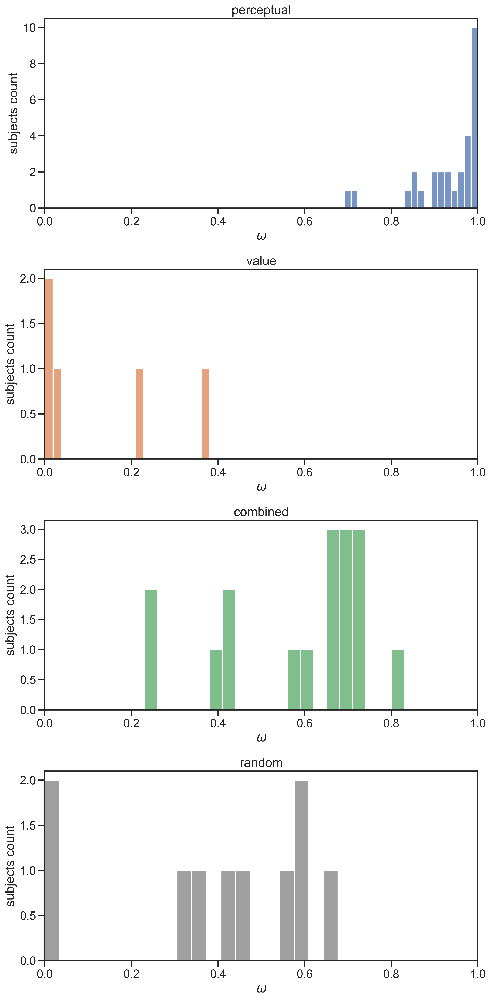

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_palette('Set2')
sns.set({'figure.figsize': (10, 20), 'figure.dpi': 300})
sns.set_style('ticks')
sns.set_context('talk')


palette = ['C0', 'C1', 'C2', 'gray']
for g, c in zip(['perceptual', 'value', 'combined', 'random'], palette):
    plt.subplot(4, 1, ['perceptual', 'value', 'combined', 'random'].index(g) + 1)
    plt.title(g)
    sns.histplot(df_fit[df_fit.group==g], x='omega', fill=True, color=c, bins=20)
    plt.xlabel('$\\omega$')
    plt.xlim(0, 1)
    plt.ylabel('subjects count')
    # plt.xlim(0, 1)

plt.tight_layout()

In [68]:
pids = df_fit.prolificID.unique()
for pid in pids:
    df_pid = df[(df.prolificID==pid) & (df.session==3)]
    df_fit.loc[df_fit.agent==pid, 'opti_ss'] = df_pid.opti_ss.mean()
    df_fit.loc[df_fit.agent==pid, 'opti_ff'] = df_pid.opti_ff.mean()

In [70]:
df_fit[(df_fit.group=='perceptual') & (df_fit.beta>100)].groupby('agent').mean(numeric_only=True)

,ll,ntrials,omega,beta,value,opti_ss,opti_ff
agent,,,,,,,
58c42d725866f200017c5deb,131.999859,287.0,0.972289,110.275270,0.972289,0.523256,0.848837
5a580fb6eedc320001426cd7,140.366884,287.0,0.999611,212.624669,0.999611,0.502924,0.900585
5a9416ba6475f900019fa690,116.846280,288.0,0.947259,308.452339,0.947259,0.482558,0.895349
5d44afdcad6d110019b0a960,134.676346,288.0,0.951167,167.859684,0.951167,0.494186,0.813953
60d7922fc3809c404939251c,147.148870,288.0,0.867373,249.289745,0.867373,0.523256,0.813953
6150fb8383f88eae3e5c795a,179.687319,287.0,0.721960,339.945393,0.721960,0.470930,0.598837
6167175ed1680ecefc063aed,123.613775,288.0,0.916947,306.826758,0.916947,0.546512,0.872093
657b6239aa8091bfa2b24ae0,148.364424,288.0,0.918294,408.859089,0.918294,0.529070,0.732558
66182d2b06cbee83d298b517,120.360258,288.0,0.962977,151.102266,0.962977,0.505814,0.936047


In [ ]:
#compute matching choices in session 3 and overall 
df_1 = df[df.expName=='FullPilot12']
df_1 = df_1.loc[~(df_1['session'] == 3) & (~df2['pair'].isin([0, 1]))]

pids = df_1.prolificID.unique()

matching = []
for pid in pids:
    df2 = df_1[df_1.prolificID==pid]
    

In [ ]:
import ptitprince as pt
import matplotlib.pyplot as plt
import seaborn as sns

def raincloud(x, y, markersize, df, order, width=1.1, bw=0.25, palette='Set2'):
    # f, ax = plt.subplots(figsize=(5*2.5, 5*2.5))

    means = df.groupby(x)[y].mean().reindex(order)
    sns.scatterplot(x=means.index, y=means, color='white', edgecolor='black', s=150/2, linewidth=1.5, zorder=4)


    ax = pt.half_violinplot(x=x, y=y, data=df, bw=bw, cut=0., linewidth=0, alpha=1, 
                            scale="area", width=width, inner=None, orient='v', zorder=1, palette=palette, order=order)

    ax = sns.stripplot(x=x, y=y, data=df,edgecolor="white",  linewidth=1, order=order,
                       size=markersize, orient='v', zorder=2, jitter=1, alpha=0.6, palette=palette)


    ax2 = sns.pointplot(x=x, y=y, data=df, color='black',  join=False, errorbar='se', linewidth=1, edgecolor='black', capsize=.1, zorder=3, bw=0, order=order)

def box_same_color(ax2):
    box_patches = [patch for patch in ax2.patches if type(
        patch) == matplotlib.patches.PathPatch]


    if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
        box_patches = ax2.artists
    num_patches = len(box_patches)
    lines_per_boxplot = len(ax2.lines) // num_patches
    for i, patch in enumerate(box_patches):
        # Set the linecolor on the patch to the facecolor, and set the facecolor to None
        col = patch.get_facecolor()
        patch.set_edgecolor(col)
        patch.set_facecolor('None')

        # Each box has associated Line2D objects (to make the whiskers, fliers, etc.)
        # Loop over them here, and use the same color as above
        for line in ax2.lines[i * lines_per_boxplot: (i + 1) * lines_per_boxplot]:
            line.set_color(col)
            line.set_mfc(col)  # facecolor of fliers
            line.set_mec(col)  # edgecolor of fliers


In [77]:
df_fit['omega'] = df_fit.x.apply(lambda x: x[0])
df_fit['beta'] = df_fit.x.apply(lambda x: x[1])

In [17]:
df_fit.beta.mean()

279060.17109567893

In [46]:
df_fit2 = df_fit.copy()

df_fit['param'] = 'omega'
df_fit['value'] = df_fit.omega

df_fit2['param'] = 'beta'
df_fit2['value'] = df_fit.beta
# minmax normalize the values
df_fit2['value'] = (df_fit2['value'] - df_fit2['value'].min()) / (df_fit2['value'].max() - df_fit2['value'].min())
df_fit3 = pd.concat([df_fit, df_fit2])
   

In [9]:
df_fit.to_csv('../data/processed/omega_model_FullPilot12_1e6.csv', index=False)

c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 6.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


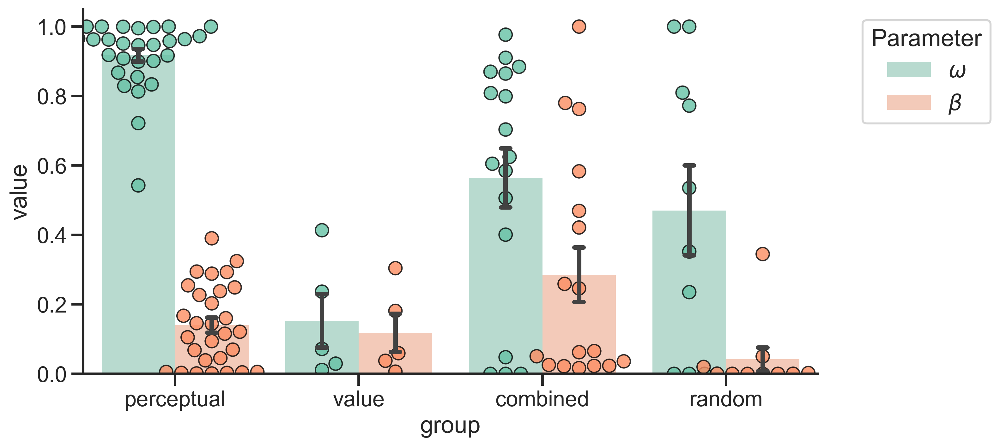

In [48]:

   
sns.set({'figure.figsize': (10, 5)})
sns.set_style('ticks')
sns.set_context('talk')

# sns.violinplot(data=df_fit3, x='group',  y='value', hue='param', order=['perceptual', 'value', 'combined', 'random'],
#                 split=True, gap=.1, inner_kws={'color': 'black', 'linewidth': 0.5, 'zorder': 10}, linecolor='white', palette='Set2', alpha=.5, bw=.5)
# sns.boxplot(data=df_fit3, x='group',  y='value', hue='param', order=['perceptual', 'value', 'combined', 'random'],
#                 dodge=True, palette='Set2', linewidth=3, width=.5, fliersize=0, zorder=0)
sns.barplot(data=df_fit3, x='group',  y='value', hue='param', order=['perceptual', 'value', 'combined', 'random'], alpha=0.5, linewidth=0,
                     palette='Set2',capsize=.1, zorder=-1, errorbar='se', edgecolor='black')

sns.swarmplot(data=df_fit3, x='group',  y='value', hue='param', order=['perceptual', 'value', 'combined', 'random'],
               alpha=0.8, palette='Set2', edgecolor='black', size=10, linewidth=1,zorder=1, dodge=1)

sns.despine()

handles, labels = plt.gca().get_legend_handles_labels()
labels = ['$\\omega$', '$\\beta$']
plt.legend(handles[0:2], labels[0:2], title='Parameter', loc='upper right', bbox_to_anchor=(1.25, 1))

Text(0.5, 0.2, 'r=0.03, p=0.86')

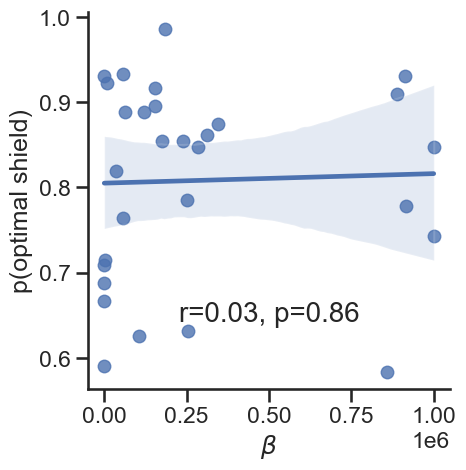

In [128]:
# plot correlation of opti_ff and beta

sns.lmplot(data=df_fit3[(df_fit3.group=='perceptual') & (df_fit3.param=='beta')], x='value', y='opti_ff',palette='Set2')
plt.xlabel('$\\beta$')
plt.ylabel('p(optimal shield)')

# text the correlation value
r, p = stats.pearsonr(df_fit3[(df_fit3.group=='perceptual') & (df_fit3.param=='beta')].value, df_fit3[(df_fit3.group=='perceptual') & (df_fit3.param=='beta')].opti_ff)
plt.text(0.5, 0.2, f'r={r:.2f}, p={p:.2f}', fontsize=20, ha='center', va='center', transform=plt.gca().transAxes)

In [130]:
from joblib import Parallel, delayed
from tqdm.notebook import tqdm


df[(df.session==2) | (df.session==0)].groupby('prolificID').opti_ss.mean().sort_values(ascending=False).head(100)
data = df[(df.expName=='FullPilot12') & (df.session.isin([0,1,2,3]))].copy().sort_values('t')
# print('Shape:', data.shape)
z = np.linspace(-1, 1, 9).round(2)
p = (1 / (1 + np.exp(-2 * z))).round(2)
shield_map = {p[i]: z[i] for i in range(len(z))}
shield_map.update({1: None})
data['ff1'] = data.p1.map(shield_map)
data['ff2'] = data.p2.map(shield_map)
#random seed
np.random.seed(np.random.randint(0, 10000))

def run_sim(sub_data, single):
    """Run the model for a given subject data history."""
    # Filter data for the subject
    s, a, r  = sub_data.s.values, sub_data.choice.values, sub_data.outcome.values
    ff1, ff2 = sub_data.ff1.values, sub_data.ff2.values
    d = sub_data.destroyed.values
    sess = sub_data.session.values
    p1, p2 = sub_data.p1.values, sub_data.p2.values
    o1,o2 = sub_data.outcome1.values, sub_data.outcome2.values
    trials = range(len(s))
    tt = sub_data.trial.values
    id = sub_data.prolificID.values[0]
    exp_name = sub_data.expName.values[0]
    op1IsLeft = sub_data.op1IsLeft.values
    m1, m2 = sub_data.m1.values, sub_data.m2.values

    # print('Number of trials:', len(trials))
    model = NormativePolicy(spaceship_ids=[280, 380, 500, 620, 720], model=single, omega=0.5, beta=100)
    choices = []
    ff = []
    destroyed = []
    new_data = []
    ess = None
    esh = None
    alpha = 0
    beta = 0
    
    for t in tqdm(trials):
        ss = s[t][0], s[t][1]
        sh = ff1[t], ff2[t]
        if (tt[t] == 0) & (sess[t] in (0, 1)):
            c = np.random.choice([0, 1])
        else:
            if (single=='value') and (sess[t] in (1,)):
                c = np.random.choice([0, 1])
            elif (single=='perceptual') and (sess[t] in (0,2)):
                c = np.random.choice([0, 1])
            else:
                c = model.choose(ss, sh)
            

        chosen_ff = ff1[t] if c == 0 else ff2[t]
        p = [p1[t], p2[t]][c]
    
        destroy = np.random.binomial(1, p)
        if ~np.isnan(chosen_ff):
            ff.append(chosen_ff)
            destroyed.append(destroy)
        # Update the model with the current trial data
        
        if sess[t] in (1, 3) and single != 'value':
            model.perceptual_update(np.array(ff), np.array(destroyed))
            esh = np.array([model.predict_shield_p(x) for x in z])
            if single == 'gibbs':
                alpha = model.perceptual.theta_samples[-1, 0]
                beta = model.perceptual.theta_samples[-1, 1]
            if single == 'map':
                beta = model.perceptual.get_slope()

        outcome = o1[t]/1000 if c == 0 else o2[t]/1000
        if sess[t] in (0, 2, 3) and single != 'perceptual':
            if destroy:
                model.value_update(s[t][c], outcome)
                ess = np.array([model.posterior_predictive_mean(x) for x in [280, 380, 500, 620, 720]])
                
        outcome = outcome * destroy
            # else:
            #     model.value_update(s[t][c], outcome/2)    
            #     ess = np.array([model.posterior_predictive_mean(x) for x in [280, 380, 500, 620, 720]])

        p1_, p2_ = p1[t], p2[t]
        m1_, m2_ = m1[t], m2[t]

        # if not op1IsLeft[t]:
        #     p1_, p2_ = p2_, p1_
        #     v1_, v2_ = v2_, v1_
        new_data.append({
            'prolificID': id,
            'expName': exp_name,
            't': tt[t],
            'trial': tt[t],
            'session': sess[t],
            's': s[t],
            'choice': c+1,
            'outcome': outcome,
            'destroyed': destroy,
            'ff1': ff1[t],
            'ff2': ff2[t],
            'p1': p1[t],
            'p2': p2[t],
            'm1': s[t][0],
            'm2': s[t][1],
            'chosen_ff': chosen_ff,
            'chosen_s': ss[c],
            'ess': ess,
            'esh': esh,
            'beta': beta,
            'alpha': alpha,
            'model': single,
            'v_log_ratio': model.v_log_ratio,
            'p_log_ratio': model.p_log_ratio,
            'true_p_log_ratio': p1_- p2_,
            # 'true_v_log_ratio': v1_ - v2_,
            'opti_ev': (p1_*m1_ >= p2_*m2_) & (c == 0) | (p2_*m2_ >= p1_*m1_) & (c == 1),
            'opti_ff': (p1_ > p2_) & (c == 0) | (p2_ > p1_) & (c == 1),
            'opti_ss': (m1_ > m2_) & (c == 0) | (m2_ > m1_) & (c == 1),
        })
        
    return new_data

from joblib import Parallel, delayed
from tqdm_joblib import tqdm_joblib
from tqdm_joblib import ParallelPbar
import itertools

subs = data.prolificID.unique()
models = ['map']
tasks = itertools.product(subs, models)
# subs = ['66c7f746e43985cfcb2c99e6', ]
results = []
parallel = True
if parallel:
    for result in ParallelPbar('N sub')(n_jobs=-2, backend='loky')(
        delayed(run_sim)(
            (data[data.prolificID == sub].sort_values(['session','t'])), model)
            for sub, model in tasks
        ):
        results.append(result)
else:
    for sub, model in tasks:
        print('Running for subject:', sub)
        results.append(run_sim(data[(data.prolificID == sub)].sort_values(['session', 't']), model))

df_sim = pd.DataFrame([item for sublist in results for item in sublist])

N sub:   0%|          | 0/61 [00:00<?, ?it/s]

ValueError: operands could not be broadcast together with shapes (200,) (2,) 

In [151]:
print(df_sim[df_sim.session==3].opti_ev.mean())
print(df_sim[df_sim.session==3].opti_ff.mean())
print(df_sim[df_sim.session==3].opti_ss.mean())

0.9491589491589492
0.7242487242487242
0.7288792288792288


In [138]:
# melt to get a log-ratio column and  value column 
# eg. log-ratio is named either perceptual or value
#when value is v_log_ratio and perceptual is p_log_ratio
df_ = df_sim[df_sim.session==3].melt(id_vars=['prolificID', 't', 'session', 'model'], value_vars=['v_log_ratio', 'p_log_ratio'],)
df_['value'] = df_.value.apply(lambda x: abs(x[0]) if isinstance(x, np.ndarray) else abs(x))
# # Standardize 'value' by group (e.g., 'variable')
# df_['value'] = df_.groupby('variable')['value'].transform(
#     lambda x: x.abs()/x.abs().mean()
# )
df_.groupby('variable')['value'].std()


# df_['value'] = df_.groupby('variable')['value'].transform(
#     lambda x: x.abs()/x.abs().mean()
# )





# df_.groupby('variable')['value'].std()
# sns.lineplot(data=df_sim[df_sim.session==3], x='t', y='log_ratio', hue='model')

variable
p_log_ratio    0.513393
v_log_ratio    0.251727
Name: value, dtype: float64

In [139]:
df_.groupby('variable')['value'].mean()

variable
p_log_ratio    0.747338
v_log_ratio    0.598352
Name: value, dtype: float64

<Axes: xlabel='variable', ylabel='value'>

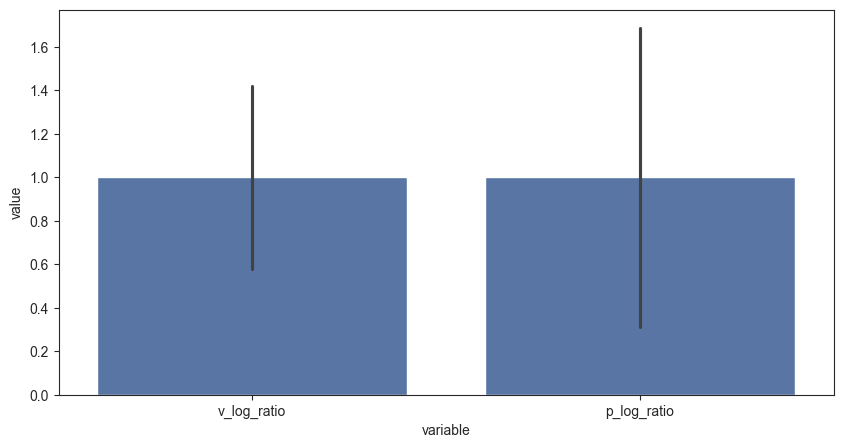

In [126]:
sns.barplot(data=df_, x='variable', y='value', errorbar='sd')

In [ ]:
sns.kdeplot(data=df_, x='variable', y='value', hue='variable', col='model', col_wrap=2, palette='Set1', lw=2, alpha=0.5)

In [67]:
np.log(.1/.7)

-1.9459101490553132

C:\Users\basil\AppData\Local\Temp\ipykernel_51328\3488001338.py:7: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_2, x='variable', y='value', order=['v_log_ratio', 'p_log_ratio'], color='black', zorder=10, join=False, errorbar='sd')


<Axes: xlabel='variable', ylabel='value'>

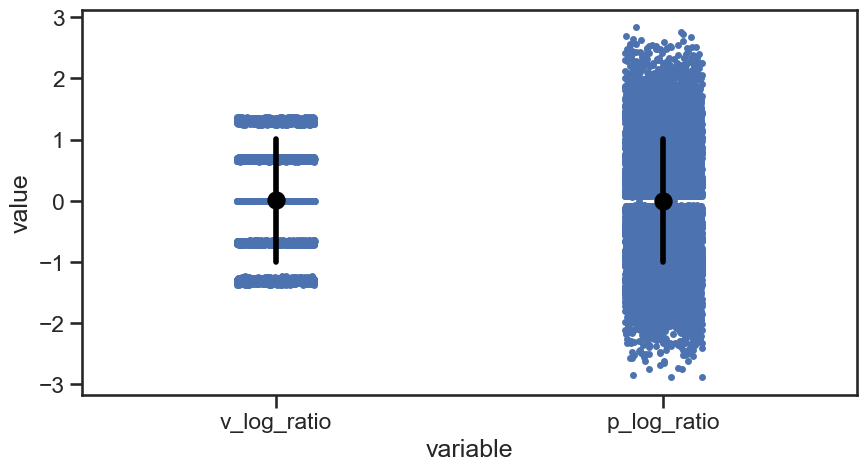

In [60]:
sns.set_context('talk')
df_2 = df_.copy()
df_2['value'] = df_2.groupby('variable')['value'].transform(
    lambda x: x/x.std()
)
sns.stripplot(data=df_2, x='variable', y='value', order=['v_log_ratio', 'p_log_ratio'])
sns.pointplot(data=df_2, x='variable', y='value', order=['v_log_ratio', 'p_log_ratio'], color='black', zorder=10, join=False, errorbar='sd')

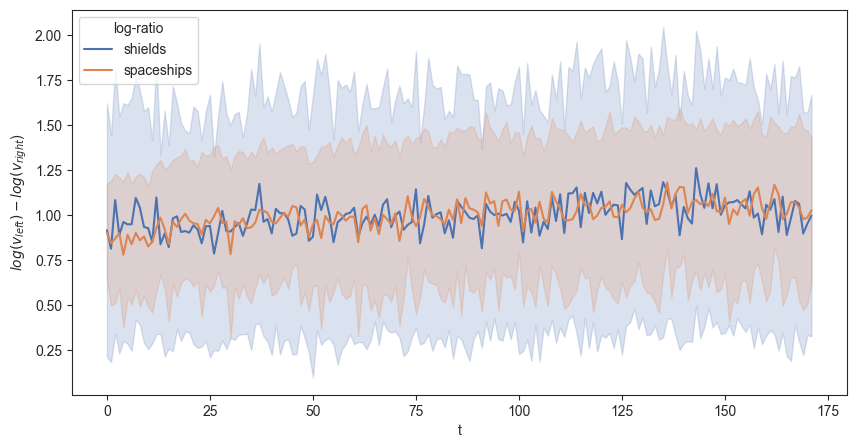

In [123]:
sns.set({'figure.figsize': (10, 5)})
sns.set_style('ticks')
sns.lineplot(data=df_, x='t', y='value', hue='variable', errorbar='sd', hue_order=['p_log_ratio', 'v_log_ratio'])#palette=['C1', 'C0'])
plt.ylabel('$log(v_{left}) - log(v_{right}$)')

handles, labels = plt.gca().get_legend_handles_labels()

plt.legend(handles=handles, labels=['shields', 'spaceships'], title='log-ratio', loc='upper left')

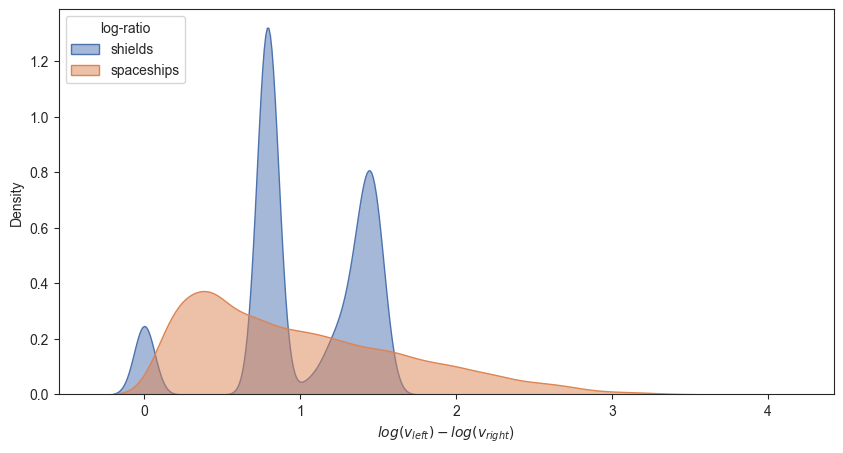

In [124]:
#now plot this as kde
ax = sns.kdeplot(data=df_, x='value', hue='variable', fill=True,
                alpha=0.5, palette=['C1', 'C0'], hue_order=['p_log_ratio', 'v_log_ratio'])

plt.xlabel('$log(v_{left}) - log(v_{right}$)')

plt.legend(labels=['shields', 'spaceships'], title='log-ratio', loc='upper left')

In [ ]:
import numpy as np




In [ ]:
from joblib import Parallel, delayed
from tqdm.notebook import tqdm


df[(df.session==2) | (df.session==0)].groupby('prolificID').opti_ss.mean().sort_values(ascending=False).head(100)
data = df[(df.expName=='FullPilot14') & (df.session.isin([0,1,2,3]))].copy().sort_values('t')
# print('Shape:', data.shape)
z = np.linspace(-1, 1, 9).round(2)
p = (1 / (1 + np.exp(-2 * z))).round(2)
shield_map = {p[i]: z[i] for i in range(len(z))}
shield_map.update({1: None})
data['ff1'] = data.p1.map(shield_map)
data['ff2'] = data.p2.map(shield_map)


def run_sim(sub_data, single):
    """Run the model for a given subject data history."""
    
    # Filter data for the subject
    s, a, r  = sub_data.s.values, sub_data.choice.values, sub_data.outcome.values
    ff1, ff2 = sub_data.ff1.values, sub_data.ff2.values
    d = sub_data.destroyed.values
    sess = sub_data.session.values
    p1, p2 = sub_data.p1.values, sub_data.p2.values
    o1,o2 = sub_data.outcome1.values, sub_data.outcome2.values
    trials = range(len(s))
    tt = sub_data.trial.values
    id = sub_data.prolificID.values[0]
    exp_name = sub_data.expName.values[0]

    # print('Number of trials:', len(trials))
    choices = []
    ff = []
    destroyed = []
    new_data = []
    ess = None
    esh = None
    alpha = 0
    beta = 0
    
    for t in tqdm(trials):
        ss = s[t][0], s[t][1]
        sh = ff1[t], ff2[t]
        if (tt[t] == 0) & (sess[t] in (0, 1)):
            c = np.random.choice([0, 1])
        else:
            if (single=='value') and (sess[t] in (1,)):
                c = np.random.choice([0, 1])
            elif (single=='perceptual') and (sess[t] in (0,2)):
                c = np.random.choice([0, 1])
            else:
                if single == 'value':
                    c = np.argmax(s[t])
                if single == 'perceptual':
                    c = np.argmax([ff1[t], ff2[t]])

        
        destroy = np.random.binomial(1, p1[t] if c == 0 else p2[t]) 

        chosen_ff = ff1[t] if c == 0 else ff2[t]
        p = [p1[t], p2[t]]
        v = [s[t][0], s[t][1]]


        new_data.append({
            'prolificID': id,
            'expName': exp_name,
            't': tt[t],
            'trial': tt[t],
            'session': sess[t],
            's': s[t],
            'choice': c+1,
            'ff1': ff1[t],
            'ff2': ff2[t],
            'p1': p1[t],
            'destroy': destroy,
            'p2': p2[t],
            'm1': s[t][0],
            'm2': s[t][1],
            'chosen_ff': chosen_ff,
            'chosen_s': ss[c],
            'ess': ess,
            'esh': esh,
            'beta': beta,
            'alpha': alpha,
            'model': single,
            'opti_ss': int(s[t][c] > s[t][1-c]),
            'opti_ff': int(ff1[t] > ff2[t]),
            'opti_ev': int(p[c]*v[c] > p[1-c]*v[1-c]),
            'outcome': o1[t] if c == 0 else o2[t]
        })
        
    return new_data

from joblib import Parallel, delayed
from tqdm_joblib import tqdm_joblib
from tqdm_joblib import ParallelPbar
import itertools

subs = data.prolificID.unique()
models = ['value', 'perceptual']
tasks = itertools.product(subs, models)
# subs = ['66c7f746e43985cfcb2c99e6', ]
results = []
parallel = True
if parallel:
    for result in ParallelPbar('N sub')(n_jobs=-2, backend='loky')(
        delayed(run_sim)(
            (data[data.prolificID == sub].sort_values(['session','t'])), model)
            for sub, model in tasks
        ):
        results.append(result)
else:
    for sub, model in tasks:
        print('Running for subject:', sub)
        results.append(run_sim(data[(data.prolificID == sub)].sort_values(['session', 't']), model))

df_sim = pd.DataFrame([item for sublist in results for item in sublist])

N sub:   0%|          | 0/130 [00:00<?, ?it/s]

In [346]:
df_sim.to_csv('../data/processed/charles_sim5.csv', index=False)

In [478]:
import pandas as pd
df_sim = pd.read_csv('../data/processed/charles_sim5.csv')

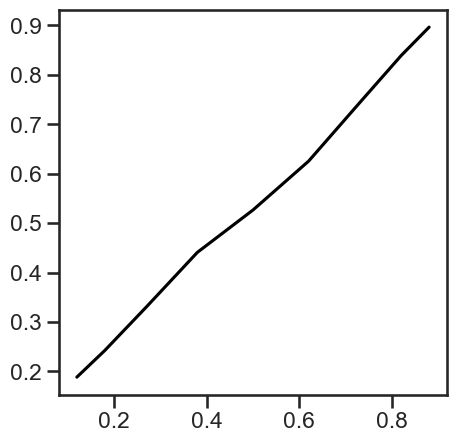

In [398]:
# check observed destroyed p1 
m1 = df[(df.expName=='FullPilot12') & (df.choice==1)].groupby('p1').destroyed.mean()
m2 = df[(df.expName=='FullPilot12') & (df.choice==2)].groupby('p2').destroyed.mean()

#now average over m1 and m2
empirical_fn = np.mean([m1, m2], axis=0)[:-1]

plt.plot(p, empirical_fn, label='empirical fn', color='black')

C:\Users\basil\AppData\Local\Temp\ipykernel_28448\62892530.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette='Set2', zorder=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_28448\62892530.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette='Set2', zorder=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_28448\62892530.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(d

Text(0, 0.5, 'inferred value at the last trial')

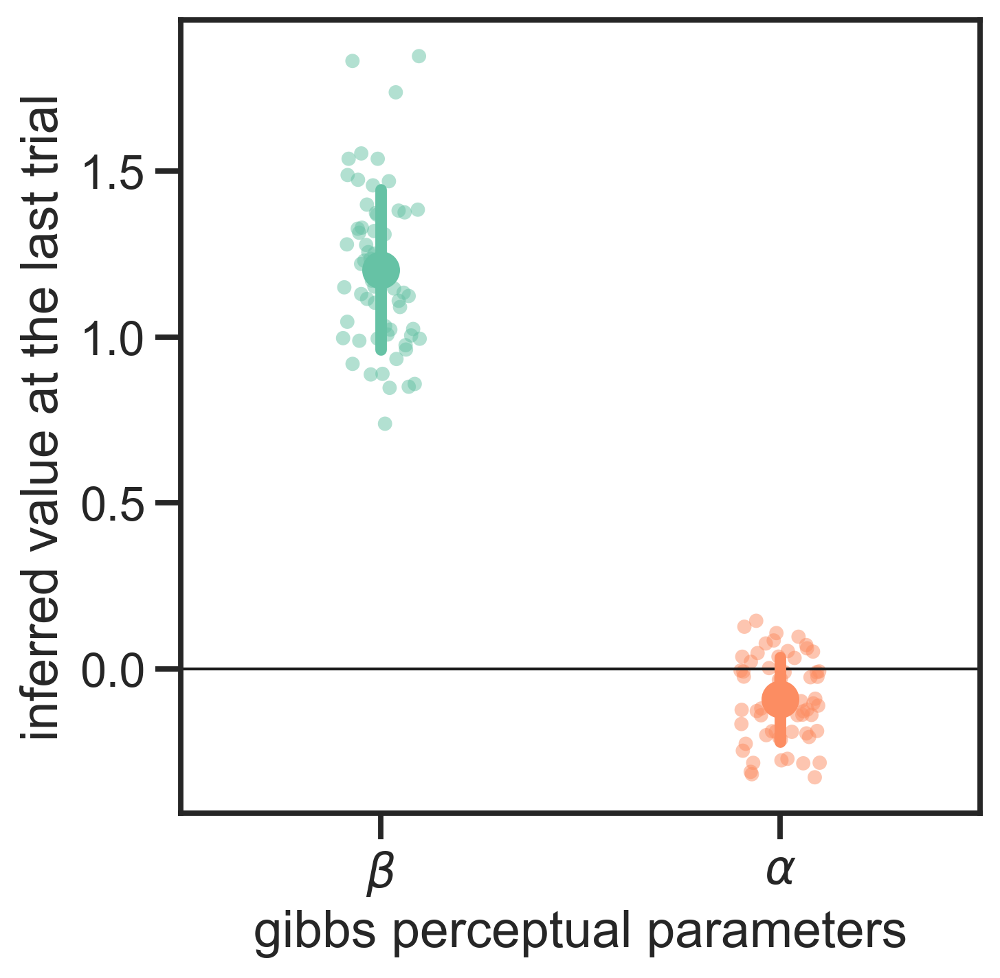

In [350]:
# # make a df with a column = param = 'alpha' or 'beta' and a column = value
df_param = df_sim[df_sim.model=='gibbs'].melt(
    id_vars=['t', 'session', 'prolificID'],
    value_vars=['beta', 'alpha'],
    var_name='param',
    value_name='value'
)

sns.set({'figure.figsize': (5, 5)})
sns.set_context('talk')
sns.set_style('ticks')  
# 0 horizontal line at 0.5
plt.axhline(0, color='k',  lw=1, zorder=2)
sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette='Set2', zorder=3)
sns.stripplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', zorder=0, palette='Set2', alpha=.5, jitter=True)
plt.xticks([0, 1], ['$\\beta$', '$\\alpha$'])
plt.xlabel('gibbs perceptual parameters')
plt.ylabel('inferred value at the last trial')

C:\Users\basil\AppData\Local\Temp\ipykernel_28448\1662378627.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette=['C2'], zorder=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_28448\1662378627.py:14: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette=['C2'], zorder=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_28448\1662378627.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.strip

Text(0, 0.5, 'inferred value at the last trial')

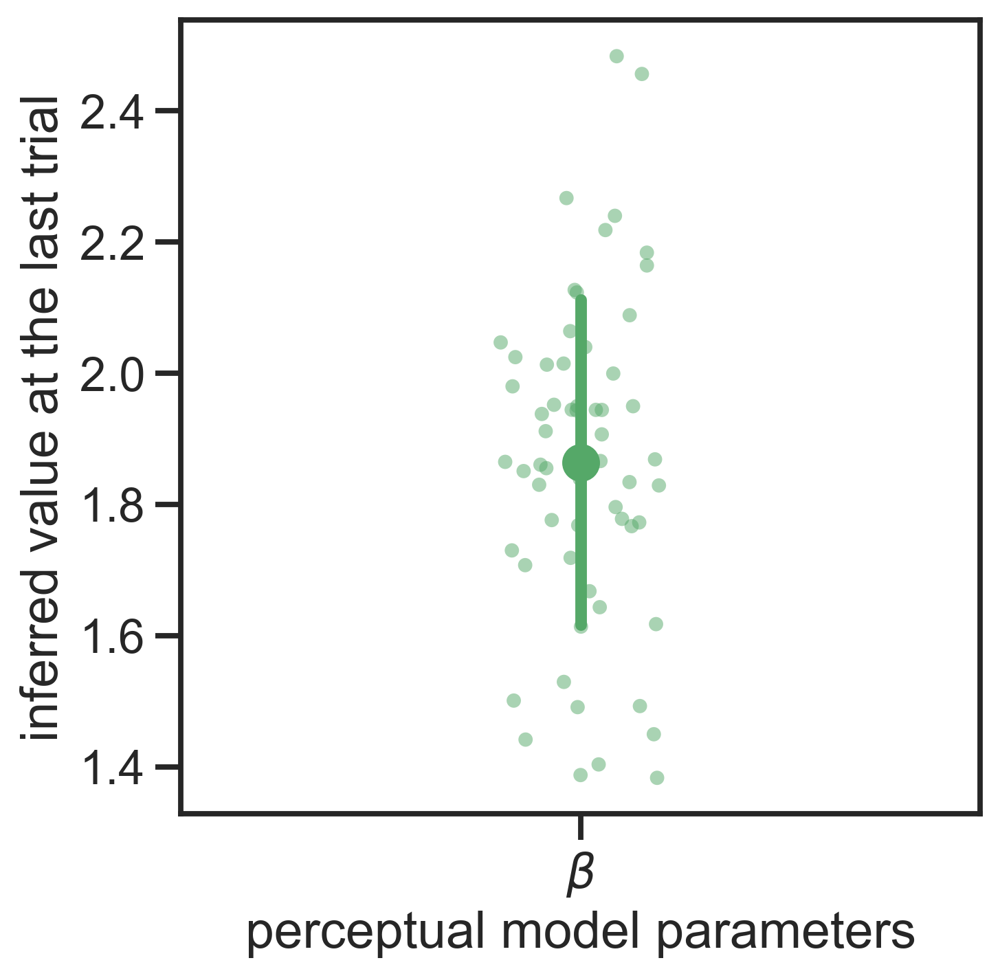

In [375]:
# # make a df with a column = param = 'alpha' or 'beta' and a column = value
df_param = df_sim[df_sim.model=='map'].melt(
    id_vars=['t', 'session', 'prolificID'],
    value_vars=['beta'],
    var_name='param',
    value_name='value'
)

sns.set({'figure.figsize': (5, 5)})
sns.set_context('talk')
sns.set_style('ticks')  
# 0 horizontal line at 0.5
# plt.axhline(0, color='k',  lw=1, zorder=2)
sns.pointplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', join=False, errorbar='sd', palette=['C2'], zorder=3)
sns.stripplot(data=df_param[df_param.t.max()==df_param.t], x='param', y='value', zorder=0, palette=['C2'], alpha=.5, jitter=True)
plt.xticks([0], ['$\\beta$'])
plt.xlabel('perceptual model parameters')
plt.ylabel('inferred value at the last trial')

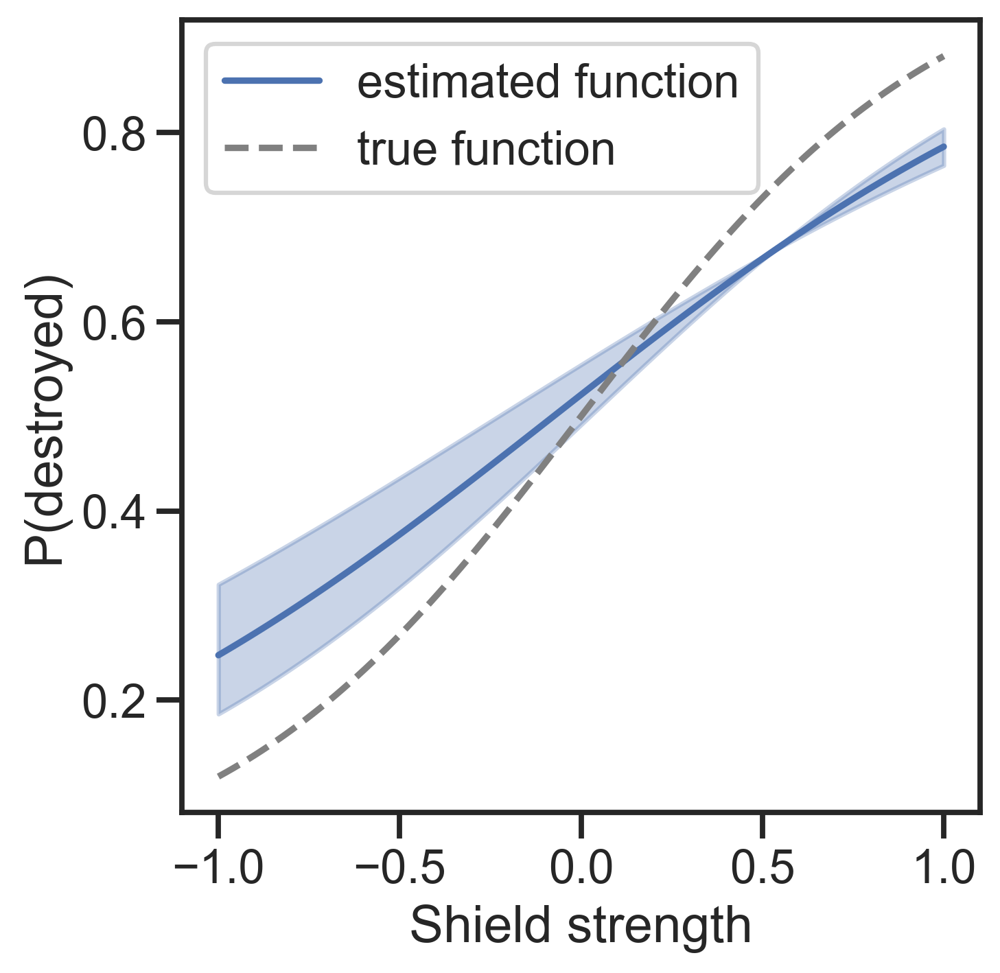

In [371]:
# select beta for each subject at max t
max_beta = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'beta')].value.mean()
max_alpha = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'alpha')].value.mean()
std_beta = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'beta')].value.std()
std_alpha = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'alpha')].value.std()

plt.figure(figsize=(5, 5))
sns.set_context('talk')
# plot the sigmoid function with the max beta and alpha
x = np.linspace(-1, 1, 100)
y = 1 / (1 + np.exp(-max_beta*  x + max_alpha))
plt.plot(x, y, label='estimated function')
y_fill_up = 1 / (1 + np.exp(-(max_beta+std_beta)*  x + (max_alpha + std_alpha)))
y_fill_down = 1 / (1 + np.exp(-(max_beta-std_beta)*  x + (max_alpha - std_alpha)))
plt.fill_between(x, y_fill_up, y_fill_down, alpha=.3, color='C0', label='uncertainty')
# add the std 
plt.plot(x, 1 / (1 + np.exp(-2*x)), label='true function', color='grey', linestyle='--')
# plt.plot(np.linspace(-1, 1, 9), empirical_fn, label='empirical function', alpha=.1)
plt.legend()
plt.xlabel('Shield strength')
plt.ylabel('P(destroyed)')

handles, labels = plt.gca().get_legend_handles_labels()

handles = [handles[0], handles[2]]
labels = [labels[0], labels[2]]

plt.legend(handles, labels, loc='upper left')

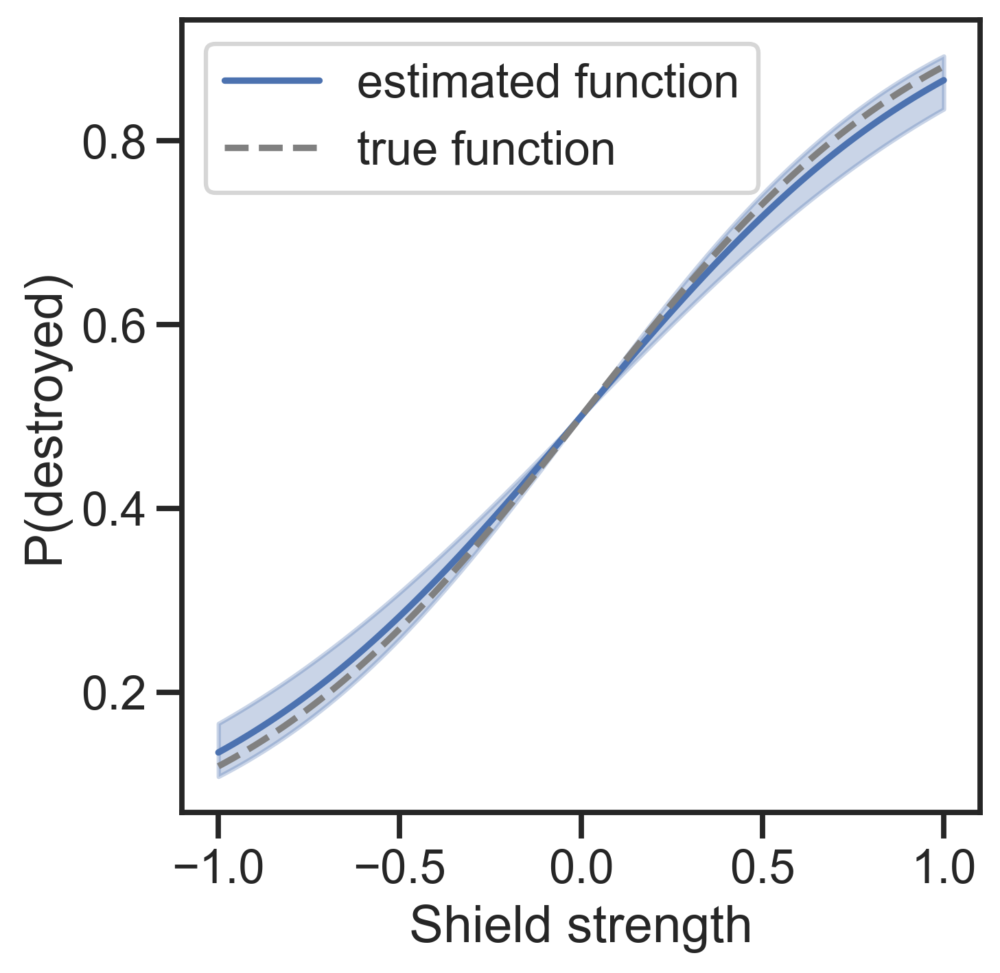

In [377]:
# select beta for each subject at max t
max_beta = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'beta')].value.mean()
# max_alpha = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'alpha')].value.mean()
std_beta = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'beta')].value.std()
# std_alpha = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'alpha')].value.std()

plt.figure(figsize=(5, 5))
sns.set_context('talk')
# plot the sigmoid function with the max beta and alpha
x = np.linspace(-1, 1, 100)
y = 1 / (1 + np.exp(-max_beta*  x))
plt.plot(x, y, label='estimated function')
y_fill_up = 1 / (1 + np.exp(-(max_beta+std_beta)*  x))
y_fill_down = 1 / (1 + np.exp(-(max_beta-std_beta)*  x))
plt.fill_between(x, y_fill_up, y_fill_down, alpha=.3, color='C0', label='uncertainty')
# add the std 
plt.plot(x, 1 / (1 + np.exp(-2*x)), label='true function', color='grey', linestyle='--')
# plt.plot(np.linspace(-1, 1, 9), empirical_fn, label='empirical function', alpha=.1)
plt.legend()
plt.xlabel('Shield strength')
plt.ylabel('P(destroyed)')

handles, labels = plt.gca().get_legend_handles_labels()

handles = [handles[0], handles[2]]
labels = [labels[0], labels[2]]

plt.legend(handles, labels, loc='upper left')

In [7]:
# select beta for each subject at max t
max_beta = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'beta')].value.mean()
# max_alpha = df_param[(df_param.t == df_param.t.max()) & (df_param.param == 'alpha')].value.mean()

plt.figure(figsize=(5, 5))
sns.set_context('talk')
# plot the sigmoid function with the max beta and alpha
x = np.linspace(-1, 1, 100)
y = 1 / (1 + np.exp(-max_beta * x))
plt.plot(x, y, label='estimated function')
plt.plot(x, 1 / (1 + np.exp(-2*x)), label='true function')
plt.plot(np.linspace(-1, 1, 9), empirical_fn, label='empirical function', alpha=.6)
plt.legend()
plt.xlabel('Shield strength')
plt.ylabel('P(destroyed)')

NameError: name 'df_param' is not defined

In [ ]:
df_sim = pd.read_csv('../data/processed/charles_sim2.csv')

In [738]:
df_sim['m1'] = df_sim.s.apply(lambda x: x[0])
df_sim['m2'] = df_sim.s.apply(lambda x: x[1])
df_sim['ev1'] = df_sim.apply(lambda x: x['m1'] * x['p1'], axis=1)

df_sim['ev2'] = df_sim.apply(lambda x: x['m2'] * x['p2'], axis=1)

df_sim['delta_ev'] = ((df_sim.ev1 - df_sim.ev2)/1000).abs().round(2)

In [747]:
df_sim['opti_sh'] = ((df_sim.p1 > df_sim.p2) & (df_sim.choice == 1)) | ((df_sim.p2 > df_sim.p1) & (df_sim.choice == 2))
df_sim['opti_ss'] = ((df_sim.m1 > df_sim.m2) & (df_sim.choice == 1)) | ((df_sim.m2 > df_sim.m1) & (df_sim.choice == 2))
df_sim['opti_ev'] = ((df_sim.ev1 >= df_sim.ev2) & (df_sim.choice == 1)) | ((df_sim.ev2 >= df_sim.ev1) & (df_sim.choice == 2))

In [36]:
df3['opti_ev'] = ((df3.ev1 >= df3.ev2) & (df3.choice == 1)) | ((df3.ev2 >= df3.ev1) & (df3.choice == 2))

In [748]:
#merge df2 and df_sim

df3 = pd.concat([df[df.expName=='FullPilot12'], df_sim])


In [749]:
df3.loc[df3.model.isna(), 'model'] = 'data'

In [750]:
def apply_group(pid):
    # Get the group for the given pid
    group = df3[df3.prolificID == pid].group.unique()
    # return value where not None
    return [g for g in group if g is not None][0]

# apply per prolificID
for pid in df3.prolificID.unique():
    df3.loc[df3.prolificID == pid, 'group'] = apply_group(pid)

In [751]:
df3.group.unique()

array(['perceptual', 'random', 'combined', 'value'], dtype=object)

C:\Users\basil\AppData\Local\Temp\ipykernel_15680\2033445524.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\basil\AppData\Local\Temp\ipykernel_15680\2033445524.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


<Axes: xlabel='model', ylabel='opti_ev'>

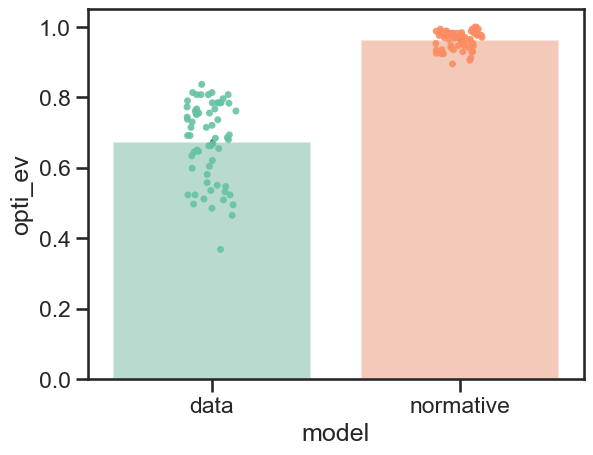

In [21]:
sns.set_style('ticks')
sns.set_context('talk')

# plot the last 25 trials opti_ev for each subject in df and df_sim
sns.barplot(
    data=df3[(df3.session==3) & (df3.expName=='FullPilot13')],
    x='model',
    y='opti_ev',
    errorbar='se',
    palette='Set2',
    alpha=0.5,
)
sns.stripplot(
    data=df3[(df3.session==3) & (df3.expName=='FullPilot13')].groupby(['prolificID', 'model'], as_index=False).mean(numeric_only=True),
    x='model',
    y='opti_ev',
    # color='black',
    alpha=0.9,
    jitter=True,
    palette='Set2',
)
# by_pid =  df3[(df3.session==3) & (df3.expName=='FullPilot12')].groupby(['prolificID', 'model'], as_index=False).mean(numeric_only=True)
# # for each subject, t, session set opti_ev2 to the mean of opti_ev for that subject where model is True
# for pid in df3.prolificID.unique():
#        by_pid.loc[(by_pid.prolificID==pid) & (by_pid.model==False), 'opti_ev2'] = by_pid.loc[(by_pid.prolificID==pid) & (by_pid.model==True), 'opti_ev'].mean()

# #now connect y1 and y2 for the same subject
# for i, row in by_pid.iterrows():
#         if row['model'] == True:
#               continue
#         plt.plot([0, 1], [row['opti_ev'], row['opti_ev2']], color='black', alpha=0.5, lw=0.5)

In [24]:
# for each group, check how they perform against the model


data = df3[(df3.session==3) & (df3.expName=='FullPilot13')]
data = data.groupby(['prolificID', 'group', 'model'], as_index=False).mean(numeric_only=True)
# now compute between model like non-model/model

data.loc[data.model=='data', 'opti_model'] = data[data.model=='data'].opti_ev.values/data[data.model=='normative'].opti_ev.values

C:\Users\basil\AppData\Local\Temp\ipykernel_15680\2912554563.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
C:\Users\basil\AppData\Local\Temp\ipykernel_15680\2912554563.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


[('perceptual', 'combined'), ('perceptual', 'value'), ('combined', 'value')]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

perceptual vs. combined: t-test independent samples, P_val:9.270e-03 t=-2.754e+00
value vs. perceptual: t-test independent samples, P_val:8.136e-01 t=2.377e-01
value vs. combined: t-test independent samples, P_val:1.044e-02 t=-2.769e+00


(<Axes: xlabel='group', ylabel='p(optimal choice)'>,
  <statannotations.Annotation.Annotation at 0x1f8341d3910>])

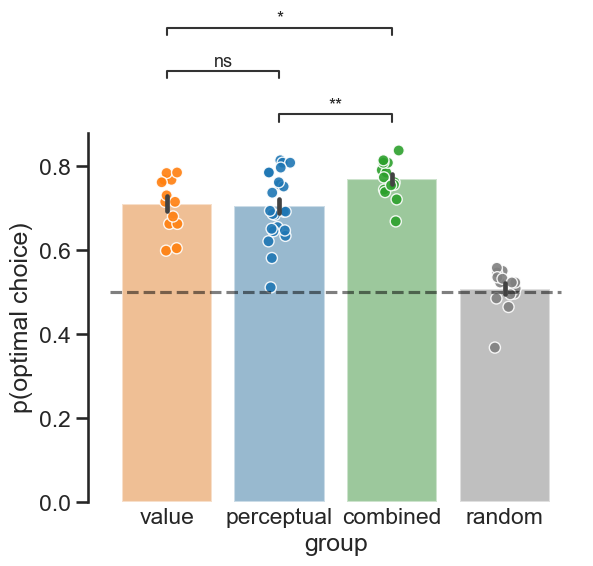

In [25]:
import seaborn as sns
sns.set_context('talk')
sns.set_style('ticks')

ax = sns.barplot(
    data=data[data.model=='data'].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True),
    x='group',
    y='opti_ev',
    errorbar='se',
    palette=['C1', 'C0', 'C2', 'grey'],
    order=['value', 'perceptual', 'combined', 'random'],
    alpha=0.5,
    zorder=-1
)
sns.stripplot(
    data=data[data.model=='data'].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True),
    x='group',
    y='opti_ev',
    # color='black',
    alpha=0.9,
    jitter=True,
    palette=['C1', 'C0', 'C2', 'grey'],
    order=['value', 'perceptual', 'combined', 'random'],
    zorder=1,
    size=8,
    edgecolor='white',
    linewidth=1,
    # jitter=0.2,
)

plt.ylabel('p(optimal choice)')
sns.despine(bottom=True)
# remove also x ticks (length to 0)
plt.tick_params(axis='x', length=0)

plt.plot([-.5, 3.5], [.5, .5], color='black', alpha=0.5, ls='--')

import itertools
from statannotations.Annotator import Annotator

pairs = list(itertools.combinations(data[data.model=='data'].group.unique(), 2))
# remove random
pairs = [pair for pair in pairs if 'random' not in pair]

print(pairs)
annotator = Annotator(ax, pairs, data=data[data.model=='data'],
                       x='group', y='opti_ev', order=['value', 'perceptual', 'combined', 'random'], loc='inside')
annotator.configure(test='t-test_ind', text_format='star', loc='outside', text_offset=0.01, fontsize=13)
annotator.apply_and_annotate()

[('perceptual', 'combined'), ('perceptual', 'value'), ('combined', 'value')]
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

perceptual vs. combined: t-test independent samples, P_val:2.075e-03 t=-3.327e+00
value vs. perceptual: t-test independent samples, P_val:6.902e-01 t=4.019e-01
value vs. combined: t-test independent samples, P_val:1.303e-02 t=-2.674e+00


C:\Users\basil\AppData\Local\Temp\ipykernel_15680\1242609864.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
C:\Users\basil\AppData\Local\Temp\ipykernel_15680\1242609864.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


(<Axes: xlabel='group', ylabel='subject / model performance'>,
  <statannotations.Annotation.Annotation at 0x1f8341cfee0>])

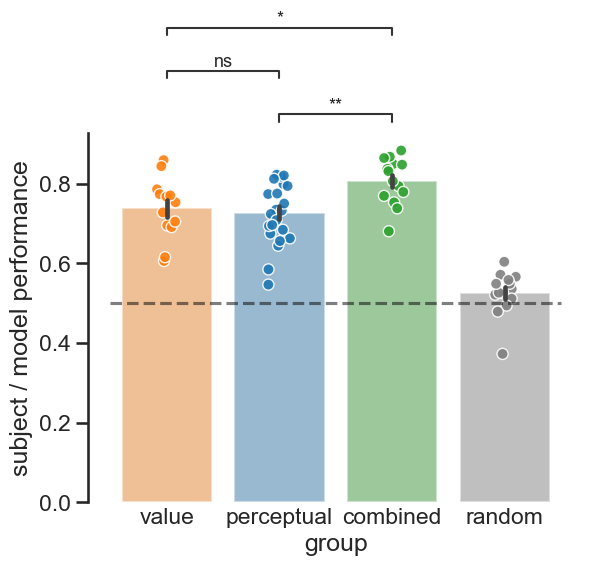

In [26]:
sns.set_context('talk')
sns.set_style('ticks')

ax = sns.barplot(
    data=data[data.model=='data'],
    x='group',
    y='opti_model',
    errorbar='se',
    palette=['C1', 'C0', 'C2', 'grey'],
    order=['value', 'perceptual', 'combined', 'random'],
    alpha=0.5,
    zorder=-1
)
sns.stripplot(
    data=data[data.model=='data'],
    x='group',
    y='opti_model',
    # color='black',
    alpha=0.9,
    jitter=True,
    palette=['C1', 'C0', 'C2', 'grey'],
    order=['value', 'perceptual', 'combined', 'random'],
    zorder=1,
    size=8,
    edgecolor='white',
    linewidth=1,
    # jitter=0.2,
)

plt.ylabel('subject / model performance')
sns.despine(bottom=True)
# remove also x ticks (length to 0)
plt.tick_params(axis='x', length=0)

plt.plot([-.5, 3.5], [.5, .5], color='black', alpha=0.5, ls='--')

import itertools
from statannotations.Annotator import Annotator

pairs = list(itertools.combinations(data[data.model=='data'].group.unique(), 2))
# remove random
pairs = [pair for pair in pairs if 'random' not in pair]

print(pairs)
annotator = Annotator(ax, pairs, data=data[data.model=='data'],
                       x='group', y='opti_model', order=['value', 'perceptual', 'combined', 'random'], loc='inside')
annotator.configure(test='t-test_ind', text_format='star', loc='outside', text_offset=0.01, fontsize=13)
annotator.apply_and_annotate()

Text(0, 0.5, 'p(optimal choice)')

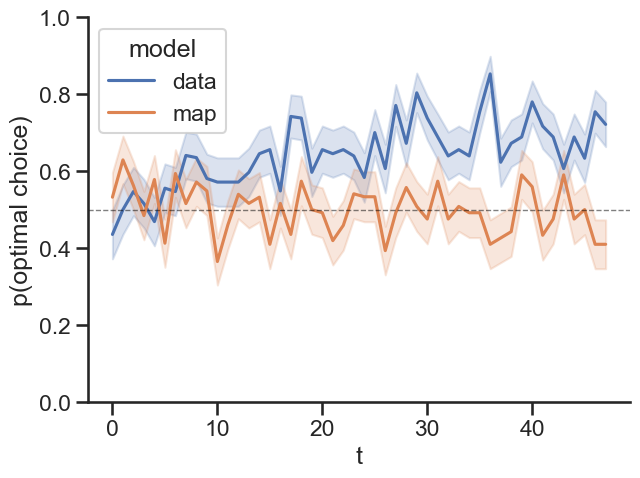

In [765]:
sns.lineplot(data=df3[df3.session==0], x='t', y='opti_ev', hue='model', errorbar='se')
plt.ylim(0, 1)
plt.axhline(0.5, color='black', ls='--', lw=1, alpha=0.5)
sns.despine()
plt.ylabel('p(optimal choice)')

# change legend (no title + data + normative model)
# handles, labels = plt.gca().get_legend_handles_labels()
# # remove the first two labels
# # add new labels
# labels = ['data', 'normative model']
# handles = [handles[0], handles[1]]
# plt.legend(handles, labels, loc='lower left', fontsize=15, title='', title_fontsize=0, frameon=False)

Text(0, 0.5, 'p(optimal choice)')

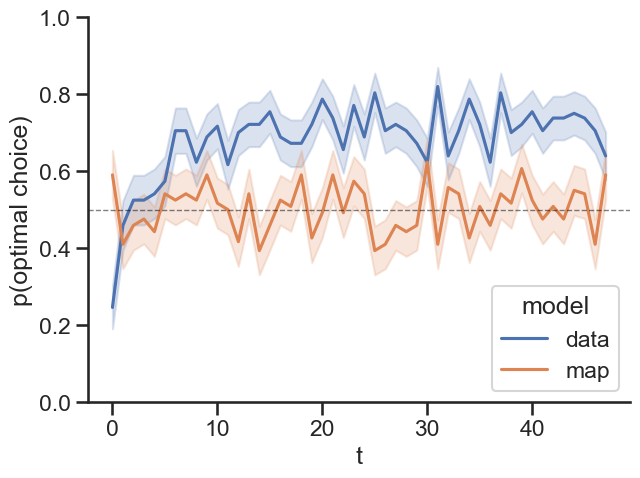

In [766]:
sns.set({'figure.figsize': (7, 5)})
sns.set_style('ticks')
sns.set_context('talk')
sns.lineplot(data=df3[df3.session==1], x='t', y='opti_ev', hue='model', errorbar='se')# palette=['black', 'C6'])
plt.ylim(0, 1)
plt.axhline(0.5, color='black', ls='--', lw=1, alpha=0.5)
sns.despine()
plt.ylabel('p(optimal choice)')

# change legend (no title + data + normative model)
# handles, labels = plt.gca().get_legend_handles_labels()
# # remove the first two labels
# # add new labels
# labels = ['data', 'normative model']
# handles = [handles[0], handles[1]]
# plt.legend(handles, labels, loc='lower left', fontsize=15, title='', title_fontsize=0, frameon=False)

In [746]:
df_sim.opti_ev

AttributeError: 'DataFrame' object has no attribute 'opti_ev'

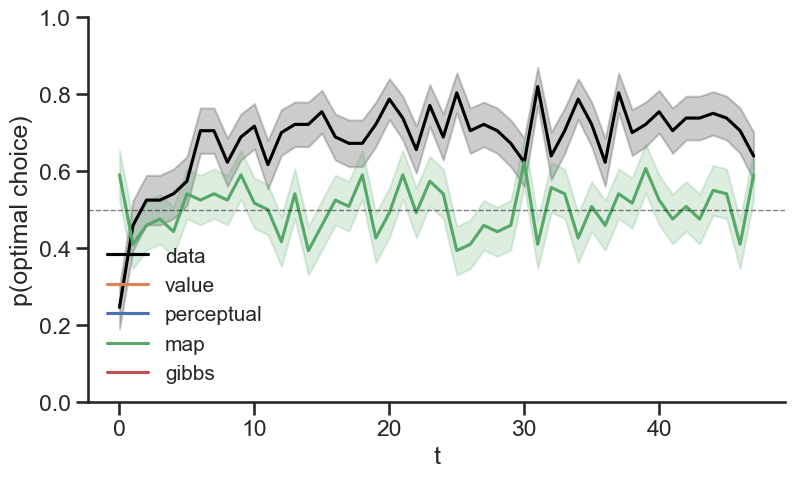

In [767]:
palette = ['black', 'C1', 'C0', 'C2', 'C3']
order =['data', 'value','perceptual', 'map', 'gibbs']
# tes

plt.figure(figsize=(9, 5))

sns.lineplot(data=df3[df3.session==1], x='t', y='opti_ev', hue='model', errorbar='se', palette=palette, hue_order=order)
plt.ylim(0, 1)
plt.axhline(0.5, color='black', ls='--', lw=1, alpha=0.5)
sns.despine()
plt.ylabel('p(optimal choice)')

# change legend (no title + data + normative model)
handles, labels = plt.gca().get_legend_handles_labels()
# remove the first two labels
# add new labels
# labels = ['data', 'normative model']
# handles = [handles[0], handles[1]]
plt.legend(handles, labels, loc='lower left', fontsize=15, title='', title_fontsize=0, frameon=False)

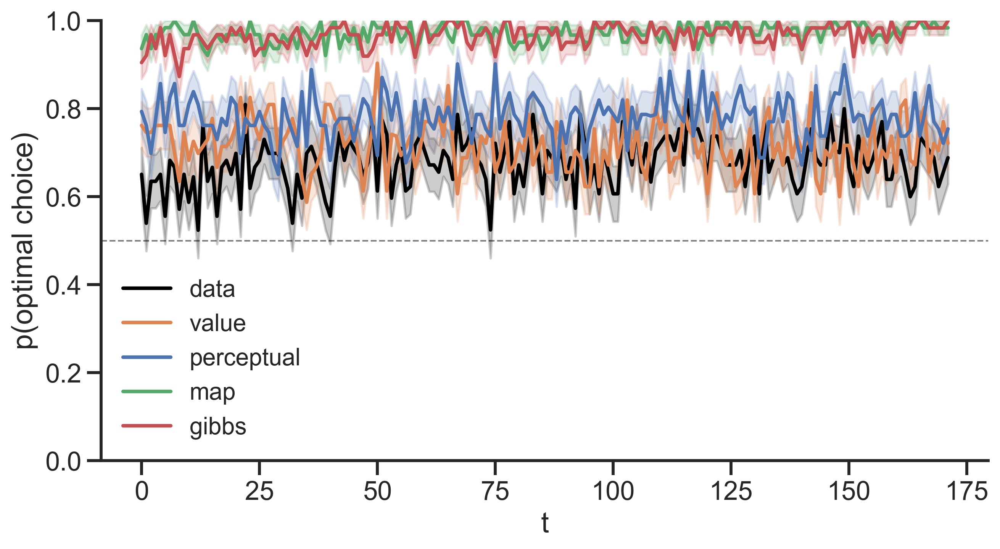

In [333]:
palette = ['black', 'C1', 'C0', 'C2', 'C3']
order =['data', 'value','perceptual', 'map', 'gibbs']
sns.set({'figure.figsize': (10, 5)})

sns.set_style('ticks')
sns.lineplot(data=df3[df3.session==3], x='t', y='opti_ev', hue='model', errorbar='se', palette=['black', 'C1', 'C0', 'C2', 'C3'], 
             hue_order=['data', 'value','perceptual', 'map', 'gibbs'])
plt.ylim(0, 1)
plt.axhline(0.5, color='black', ls='--', lw=1, alpha=0.5)
sns.despine()
plt.ylabel('p(optimal choice)')

# # change legend (no title + data + normative model)
# handles, labels = plt.gca().get_legend_handles_labels()
# # remove the first two labels
# # add new labels
# labels = ['data', 'normative model']
# handles = [handles[0], handles[1]]
plt.legend(handles, labels, loc='lower left', fontsize=15, title='', title_fontsize=0, frameon=False)

In [259]:
df3[df3.model=='data'].opti_ff

110684    0.0
110686    0.0
110688    0.0
110690    0.0
110692    0.0
         ... 
177621    0.0
177623    1.0
177625    1.0
177626    1.0
177628    1.0
Name: opti_ff, Length: 19376, dtype: float64

In [282]:
 df3.opti_ev[df3.model=='map']

0        False
1        False
2         True
3        False
4         True
         ...  
76554    False
76555     True
76556     True
76557     True
76558     True
Name: opti_ev, Length: 19376, dtype: bool

In [287]:
# for each subject in session 3, retrieve all opti_ss and opti_sh and t-test against map model opti_ss and opti_sh
def get_group_old(row):

    opti_ff = df3[df3.prolificID==row.prolificID].opti_ff[df3.model=='data']
    opti_ss = df3[df3.prolificID==row.prolificID].opti_ss[df3.model=='data']
    opti_ev = df3[df3.prolificID==row.prolificID].opti_ev[df3.model=='data']
    opti_ff_map = df3[df3.prolificID==row.prolificID].opti_sh[df3.model=='perceptual']
    opti_ss_map = df3[df3.prolificID==row.prolificID].opti_ss[df3.model=='value']
    opti_ev_map = df3[df3.prolificID==row.prolificID].opti_ev[df3.model=='map'].astype(float)
    p_ss = stats.ttest_rel(opti_ss, opti_ss_map).pvalue < 0.05
    p_ff = stats.ttest_rel(opti_ff, opti_ff_map).pvalue < 0.05
    p_ev = stats.ttest_rel(opti_ev, opti_ev_map).pvalue < 0.05

    if p_ev:
        return 'combined'
    if p_ss:
        return 'perceptual'
    if p_ff:
        return 'value'

    return 'random'

# for each subject in session 3, retrieve all opti_ss and opti_sh and t-test against map model opti_ss and opti_sh
def get_group(row):

    opti_ff = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_ff[df3.model=='data']
    opti_ss = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_ss[df3.model=='data']
    opti_ev = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_ev[df3.model=='data']
    opti_ff_map = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_sh[df3.model=='perceptual']
    opti_ss_map = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_ss[df3.model=='value']
    opti_ev_map = df3[df3.prolificID==row.prolificID].sort_values(['session', 't']).opti_ev[df3.model=='map'].astype(float)
    
    # check the proportion of matching values between opti_ff and opti_ff_map
    opti_ff_match = (opti_ff == opti_ff_map).mean()
    opti_ss_match = (opti_ss == opti_ss_map).mean()
    opti_ev_match = (opti_ev == opti_ev_map).mean()

    if opti_ev_match > opti_ss_match and opti_ev_match > opti_ff_match:
        return 'combined'

    if opti_ss_match > opti_ff_match:
        return 'value'
    
    if opti_ff_match > opti_ss_match:
        return 'perceptual'

    return 'random'
df_ = df3[df3.session==3].groupby('prolificID', as_index=False).mean(numeric_only=True)
df_['group2'] = df_.apply(get_group, axis=1)



ValueError: Can only compare identically-labeled Series objects

In [315]:
def get_group(row):
    # Get data for this subject across all sessions and trials
    subject_data = df3[(df3.session==3) & (df3.prolificID == row.prolificID)].sort_values(['session', 't'])
    
    # Extract values for different models, ensuring index alignment
    data_model = subject_data[subject_data.model == 'data'].sort_values(['session', 't'])
    value_model = subject_data[subject_data.model == 'value'].sort_values(['session', 't'])
    perceptual_model = subject_data[subject_data.model == 'perceptual'].sort_values(['session', 't'])
    map_model = subject_data[subject_data.model == 'map'].sort_values(['session', 't'])


    #random model data, simulate random choices for the same length as data_model
    random_model = np.random.choice([1, 2], size=len(data_model), replace=True)
   
    # match perceptual model with data model choices
    p_match = (data_model.choice.values == perceptual_model.choice.values).mean()
    # print(p_match)
    v_match = (data_model.choice.values == value_model.choice.values).mean()
    m_match = (data_model.choice.values == map_model.choice.values).mean()
    r_match = (data_model.choice.values == random_model).mean()
    
    if p_match > v_match and p_match > m_match and p_match > r_match:
        return 'perceptual'
    if v_match > p_match and v_match > m_match and v_match > r_match:
        return 'value'
    if m_match > p_match and m_match > v_match and m_match > r_match:
        return 'combined'
    if r_match > p_match and r_match > v_match and r_match > m_match:
        return 'random'

    
df_ = df3[df3.session==3].groupby('prolificID', as_index=False).mean(numeric_only=True)
df_['group2'] = df_.apply(get_group, axis=1)


In [312]:
df_.group2.value_counts()

df3['group2'] = df3['prolificID'].map(df_.set_index('prolificID')['group2'])

In [317]:
df_sim.to_csv('../data/processed/charles_sim5.csv', index=False)

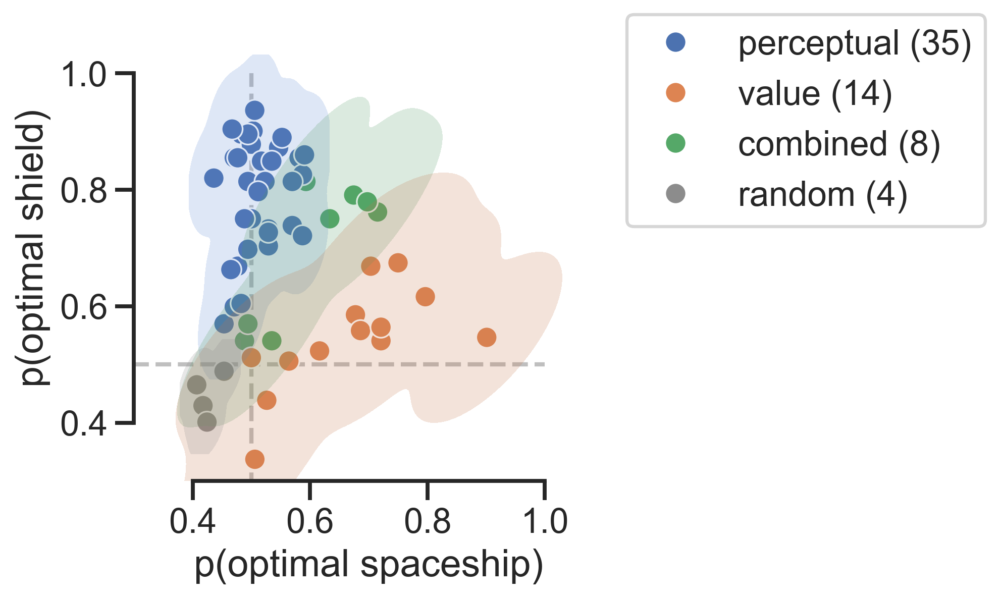

In [316]:
# same but with scatterplot

import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

df_ = df3[(df3.session==3) & (df3.model=='data')].groupby(['prolificID', 'group2'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.group!='random']
sns.set(rc={'figure.figsize':(4,4), 'figure.dpi': 300})
sns.set_context("talk")
sns.set_style("ticks")


# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group2'] = pd.Categorical(df_['group2'], categories=order, ordered=True)


scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group2', palette=['C0', 'C2', 'C1', 'C7'], s=100)


# using seaborn, we want a region of interest using the colors of the clusters in scatterplot
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, 
            palette=['C0', 'C2', 'C1', 'C7'], hue='group2', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points

            

# add a third dimension (opti_ev)
plt.ylim(0.3, 1.1)
plt.xlim(0.3, 1.1)

# add identity line (x=y)
# plt.plot([0.3, 1], [0.3, 1], color='grey', lw=2, zorder=-100, alpha=0.5)

# add 0.5 line v and h
# plt.axhline(0.5, color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
# plt.axvline(0.5, color='grey', lw=2, ls='--', alpha=0.5 , zorder=-100)

plt.plot([0, 1], [.5, .5], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
plt.plot([.5, .5], [0, 1], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)

plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal shield)')
# put legend outside
# N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')
sns.despine(trim=True)
#no legend
# plt.legend().remove()

#
# use order for legend
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['perceptual', 'value', 'combined', 'random']
handles = [handles[order.index(label)] for label in labels]
labels = [f'{label} ({len(df_[df_.group2==label])})' for label in labels]
plt.legend(title='', bbox_to_anchor=(1.05, 1), labels=labels, handles=handles,
           loc=2, borderaxespad=0.)

# legend order
# plt.legend().remove()

In [314]:
35+14+8+4


61

C:\Users\basil\AppData\Local\Temp\ipykernel_28448\4211614533.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  y1 = x[df3.model=='gibbs'].groupby('prolificID').opti_ev.mean()
C:\Users\basil\AppData\Local\Temp\ipykernel_28448\4211614533.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  y2 = x[df3.model=='map'].groupby('prolificID').opti_ev.mean()


TtestResult(statistic=-5.502391381137506, pvalue=8.178407697704477e-07, df=60)

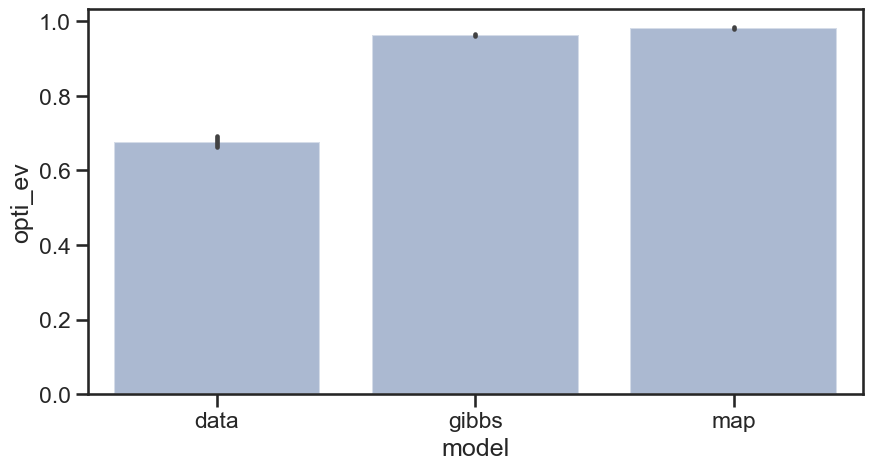

In [257]:
sns.barplot(
    data=df3[(df3.session==3) & (df3.expName=='FullPilot12')].groupby(['prolificID', 'model'], as_index=False).mean(numeric_only=True),
    x='model',
    y='opti_ev',
    errorbar='se',
    # palette=['black', 'C6'],
    alpha=0.5,
)
# plt.ylim(0.6, 0.98)
x = df3[(df3.session==3) & (df3.expName=='FullPilot12') & (df3.model.isin(['gibbs', 'map']))]

y1 = x[df3.model=='gibbs'].groupby('prolificID').opti_ev.mean()
y2 = x[df3.model=='map'].groupby('prolificID').opti_ev.mean()    

import scipy.stats as stats

stats.ttest_rel(y1, y2)

In [80]:
y1.mean()
y2.mean()

86.09403278688525

In [ ]:
# are there instances of ev1 == ev2?
df2 = df[df.expName=='FullPilot13']
med = np.median(abs(df2[(df2.session==3)].ev1 - df2[(df2.session==3)].ev2))

In [ ]:
# add a column to df2 with bool if abs(df2.ev1 - df2.ev2) < median
df2['hard'] = abs(df2.ev1 - df2.ev2) < med
df2['delta_ev'] = abs(df2.ev1 - df2.ev2)

C:\Users\garciaba\AppData\Local\Temp\ipykernel_38372\3163046488.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['hard'] = abs(df2.ev1 - df2.ev2) < med
C:\Users\garciaba\AppData\Local\Temp\ipykernel_38372\3163046488.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['delta_ev'] = abs(df2.ev1 - df2.ev2)


<Axes: xlabel='hard', ylabel='opti_ss'>

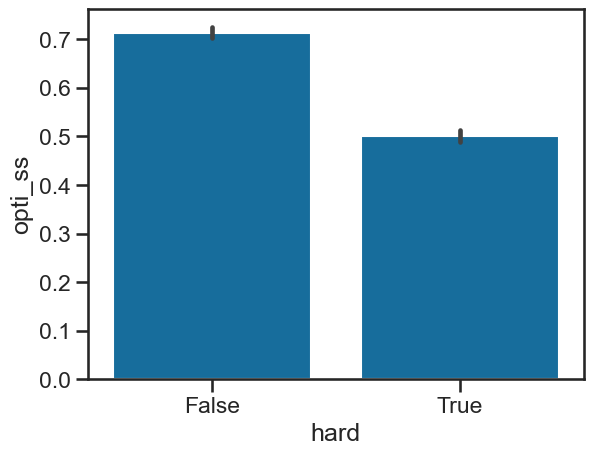

In [ ]:
sns.barplot(data=df2[(df2.session==3)], x='hard', y='opti_ss')

C:\Users\garciaba\AppData\Local\Temp\ipykernel_38372\2288101647.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['delta_ev'] = abs(df2.ev1 - df2.ev2)


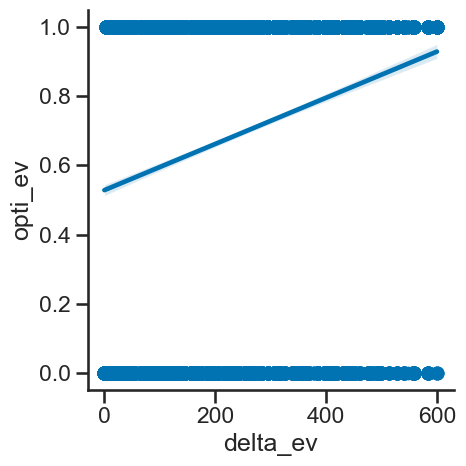

In [ ]:

# check with log model if delta_ev predicts opti_ss or opti_ev
df2['delta_ev'] = abs(df2.ev1 - df2.ev2)

sns.lmplot(data=df2[(df2.session==3)], x='delta_ev', y='opti_ev')

In [ ]:
from math import sqrt
from joblib import Parallel, delayed
from tqdm_joblib import tqdm_joblib
from tqdm_joblib import ParallelPbar

with tqdm_joblib(desc="My calculation", total=10) as progress_bar:
    Parallel(n_jobs=16)(delayed(sqrt)(i**2) for i in range(10))

# or

ParallelPbar("My calculation")(n_jobs=16)(
    delayed(sqrt)(i**2) for i in range(10)
)

c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\tqdm_joblib\__init__.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


My calculation:   0%|          | 0/10 [00:00<?, ?it/s]

My calculation:   0%|          | 0/10 [00:00<?, ?it/s]

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]

In [ ]:
data[data.prolificID == subs].sort_values(['session', 't'])

,prolificID,expName,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,delta_ev,correct,opti_ff,opti_ss,outcome,trial,s,id,ff1,ff2
110684,610a1655e385fd7341e12778,FullPilot12,0,0,3,1,398,699,1,1,...,340,False,False,False,0.398,0,"(380, 720)",0,NaN,NaN
110686,610a1655e385fd7341e12778,FullPilot12,0,1,4,1,390,265,0,0,...,100,True,False,True,0.390,1,"(380, 280)",0,NaN,NaN
110688,610a1655e385fd7341e12778,FullPilot12,0,2,2,1,595,319,0,0,...,340,True,False,True,0.595,2,"(620, 280)",0,NaN,NaN
110690,610a1655e385fd7341e12778,FullPilot12,0,3,1,2,618,758,1,0,...,100,True,False,True,0.758,3,"(620, 720)",0,NaN,NaN
110692,610a1655e385fd7341e12778,FullPilot12,0,4,5,2,698,255,0,1,...,440,False,False,False,0.255,4,"(720, 280)",0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111575,610a1655e385fd7341e12778,FullPilot12,3,167,-2,1,657,375,1,1,...,98,False,False,True,0.657,167,"(620, 380)",0,-0.25,1.00
111578,610a1655e385fd7341e12778,FullPilot12,3,168,1,1,711,242,0,0,...,460,True,True,True,0.711,168,"(720, 280)",0,1.00,0.25
111580,610a1655e385fd7341e12778,FullPilot12,3,169,0,1,657,375,0,0,...,402,True,True,True,0.657,169,"(620, 380)",0,1.00,-0.25
111582,610a1655e385fd7341e12778,FullPilot12,3,170,0,1,583,354,1,1,...,240,True,True,True,0.583,170,"(620, 380)",0,0.25,-0.25


In [ ]:
np.random.binomial(1, 1)


1

In [ ]:
results

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

Mean density for spaceship 0: 525.72
Mean density for spaceship 1: 633.66
Mean density for spaceship 2: 758.47
Mean density for spaceship 3: 739.83


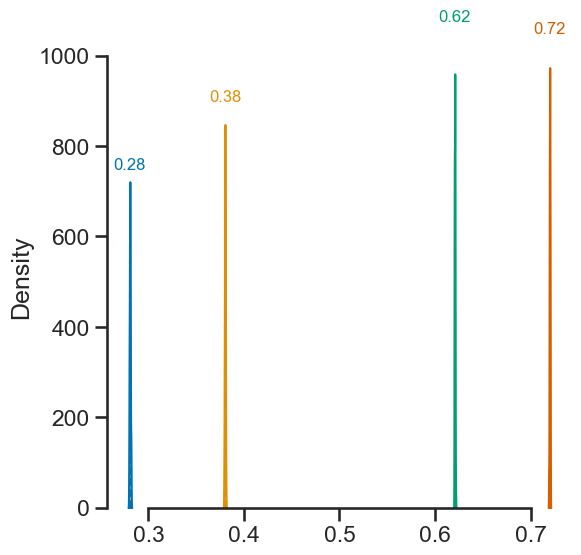

In [ ]:
# dists 
dists = [model.sample_posterior(s, n_samples=100) for s in [280, 380, 620, 720]]


import seaborn as sns
import matplotlib.pyplot as plt

# plot beautiful and modern kdensity plots
sns.set_context("talk")
sns.set_style("ticks")
sns.set_style("ticks")

sns.set_palette("colorblind")

plt.figure(figsize=(6, 6))

for i, dist in enumerate(dists):
    ax = sns.kdeplot(dist, label=f'Spaceship {i}', fill=True, alpha=0.5, linewidth=1.5)
    # also plot the mean of the distribution in the same color, in text and line
    # to get y axis we need to get the density at the mean
    # compute the density at the mean for dist
    mean_density = np.mean(norm.pdf(dist, loc=np.mean(dist), scale=np.std(dist)))
    print(f"Mean density for spaceship {i}: {mean_density:.2f}")
    #plot the vertical line at the mean with the same color as the kdeplot
    plt.plot([np.mean(dist), np.mean(dist)], [0, mean_density+(mean_density*0.1)], color=f'C{i}', linestyle='--', linewidth=1.5)

    # plot the text at the mean with the same color as the kdeplot
    plt.text(np.mean(dist), mean_density+(mean_density*0.41), f'{np.mean(dist):.2f}', color=f'C{i}', fontsize=12, ha='center', va='bottom')

sns.despine(trim=True)


In [ ]:
ax.get_lines()

<a list of 0 Line2D objects>

0.40126821612829877

In [ ]:
df[((df.session==2) | (df.session==0)) & (df.expName=='FullPilot12')].groupby(['prolificID'], as_index=False).mean(numeric_only=True).sort_values(by='opti_ss', ascending=True).head(100)[['opti_ss', 'prolificID']]


,opti_ss,prolificID
16,0.357895,60da2baf34bde948982f84db
23,0.385417,628de7e8ff1744a9717d7883
14,0.406250,6087ee3e8df094dc6dd69e8e
34,0.416667,663784abc88d62265def75ea
20,0.427083,6165e6f471254e3af05c5057
...,...,...
56,0.927083,66f09b3690fe3df51613a689
0,0.936842,5484d361fdf99b0379939d5b
49,0.945652,66c7f746e43985cfcb2c99e6
42,0.947368,668180f26a3b162091510589


# Parameter Retrieval

In [ ]:
#remove duplicated trials
df = df.drop_duplicates(subset=['prolificID', 'session', 't'])
df.groupby('prolificID').size()

prolificID
5484a2b2fdf99b07b28f2335    144
5484d361fdf99b0379939d5b    144
559c3a4dfdf99b32b6963e70    144
57027c1f68c641000e0c8970    144
57bb618b8e26d6000196c3bb    144
                           ... 
675dd4aed41b2116f978a0a1    144
675edf24452fd3015aaee4dc    144
675eedc3e29d31f79d612346    143
675efe6044b2f5bde425ceac    143
67603ec6f369599a362eecb9    144
Length: 179, dtype: int64

In [ ]:
session = 3
df_ = df[(df.session==session)].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats

df_['delta'] = df_.opti_ff - df_.opti_ss

df_['opti_ff'] = df_.opti_ff.astype(float)
df_['opti_ss'] = df_.opti_ss.astype(float)
df_['delta'] = df_.delta.astype(float)
df['opti_ff'] = df['opti_ff'].astype(float)
df['opti_ss'] = df['opti_ss'].astype(float)
         
df2 = df[(df.session==session)]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')

df_['group'] = df_.apply(get_group, axis=1)

df['group'] = df['prolificID'].map(df_.set_index('prolificID')['group'])

# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

190


In [ ]:
import pandas as pd
import numpy as np


slope = 2
logistic = lambda x: 1/(1+np.exp(-slope*x))
map_ff_values = {logistic(i).round(2):i for i in np.linspace(-1, 1, 9)}
map_ff_values[1] = 1
df['agent'] = df.prolificID

df['s'] = list(zip(df.m1, df.m2))
df['a'] = df.choice - 1
df['r'] = df.outcome
df['ff1'] = df.p1.map(map_ff_values)
df['ff2'] = df.p2.map(map_ff_values)
# if (df.p1.unique()[0]==1):
    # df['ff1'] = .25
    # df['ff2'] = .25
df['destroy'] = df.destroyed

df['opti_ev'] = (df.ev1 > df.ev2) & (df.choice == 1) | (df.ev2 > df.ev1) & (df.choice == 2)


# SIMULATE

In [ ]:
import tqdm.notebook as tqdm
# import Parallel and delayed
from joblib import Parallel, delayed

# agents = pd.read_csv('../data/processed/fit_params_fullpilot12_13_14_all_models.csv')
agents = pd.read_csv('../data/processed/fit_params_full_latest_fixed_wv.csv')
models = ['absolute', 'absolute-var']
# models = ['independent']
# models = ['absolute-var','absolute', 'value', 'perceptual']
n_sim = 1

pbar = tqdm.tqdm(total=len(agents.agent.unique()) * n_sim)
slope = 2
ff_values = np.round(np.linspace(-1, 1, 9), 2)
logistic = lambda x: 1/(1+np.exp(-slope*x))
pp = {i:np.round(logistic(i),2) for i in ff_values}

df_sim = []
models += ['data']

# for agent in Parallel(n_jobs=-2, backend='loky')(delayed(simulate)(agent) for agent in agents.agent.unique()):
for agent in agents.agent.unique():
    for sim in range(n_sim):
        if agent not in df.prolificID.unique():
            print('Agent not found:', agent)
            pbar.update()
            continue
        df2 = df[(df.agent==agent) & (df.session.isin([0,1,2,3]))].sort_values('t')
        df2 = df2.loc[df2.choice.isin([1, 2])]
        df2 = df2.loc[~((df2.session==3) & (~df2.pair.isin([0, 1])))]
        # TODO:remove?
        # df2 = df2[df2.session==3]
        tt = df2.t.values
        s, a, r = df2.s.values, df2.a.values, df2.r.values
        tt = df2.t.values
        ff1, ff2 = df2.ff1.values, df2.ff2.values
        session = df2.session.values
        destroy = df2.destroy.values
        ev1, ev2 = df2.ev1.values, df2.ev2.values
        exp = df2.expName.values[0]

        ntrials = df2.shape[0]

        for model in models:
            if model == 'log-ratio':
                perceptual_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ff')].value.values[0]
                rl_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ss')].value.values[0]
                fit_perceptual = 'logit'
                fit_value = 'relative'

                m = NormativeLogRatio(perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=0, slope_prior=0.5,
                                    fit_perceptual='logit', fit_value='relative', x=list(ff_values), states=s, nstate=len(np.unique(s)))
                
            if model == 'value' or model == 'value-var':
                rl_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta')].value.values[0]
                perceptual_temp = 0
                fit_perceptual = 'logit'
                fit_value = 'relative'
                var = 1 if model == 'value-var' else 0

                m = NormativeIndependent(perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=0,
                                    fit_perceptual='value', fit_value='absolute', x=list(ff_values), states=s, nstate=len(np.unique(s)), var=var)
            if model == 'perceptual' or model == 'perceptual-var':
                perceptual_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta')].value.values[0]
                rl_temp = 0
                fit_perceptual = 'logit'
                fit_value = 'relative'
                var = 1 if model == 'perceptual-var' else 0

                m = NormativeIndependent(perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=0,
                                    fit_perceptual='value', fit_value='absolute', x=list(ff_values), states=s, nstate=len(np.unique(s)), var=var)
                
            if model == 'absolute':
                perceptual_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ff')].value.values[0]
                rl_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ss')].value.values[0]
                leak = 0
                fit_value = 'absolute'
                fit_perceptual = 'value'
            # leak = x0[2]
                m = NormativeIndependent(states=s, nstate=len(np.unique(s)),
                                    perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=leak, x=list(ff_values),
                                    fit_value=fit_value, fit_perceptual=fit_perceptual, var=0)
            if model == 'absolute-var':
                perceptual_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ff')].value.values[0]
                rl_temp = agents[(agents.agent==agent) & (agents.model==model) & (agents.param2=='beta_ss')].value.values[0]
                leak = 0
                fit_value = 'absolute'
                fit_perceptual = 'value'
                m = NormativeIndependent(states=s, nstate=len(np.unique(s)),
                                        perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=leak, x=list(ff_values),
                                        fit_value=fit_value, fit_perceptual=fit_perceptual, var=1)
                
            if model == 'random':
                m = RandomModel()
            
            if (model == 'data') and (sim == 0):
                # append another row for the original data, but this 
                # row should be unique
                for t in range(ntrials):
                    d = \
                        {
                            'opti_ff': df2.opti_ff.values[t],
                            'opti_ss': df2.opti_ss.values[t],
                            'opti_ev': df2.opti_ev.values[t],
                            'p1': df2.p1.values[t],
                            'p2': df2.p2.values[t],
                            'choice': df2.choice.values[t],
                            'destroyed': df2.destroyed.values[t],
                            'outcome': df2.outcome.values[t],
                            'ev1': df2.ev1.values[t],
                            'ev2': df2.ev2.values[t],
                            'm1': df2.m1.values[t],
                            'm2': df2.m2.values[t],
                            't': df2.t.values[t],
                            'session': df2.session.values[t],
                            'agent': agent,
                            'model': 'data',
                            'group': df2.group.values[0],
                            'expName': df2.expName.values[0],
                            'beta_ff': None,
                            'beta_ss': None,
                        }
                    df_sim.append(d)
                continue


            # print('starting p means:', m.prior_mean)

            for t in range(ntrials):
                
                c = m.make_choice(s=s[t], ff1=ff1[t], ff2=ff2[t])

                r[t] = df2.outcome1.values[t] * (c==0) + df2.outcome2.values[t] * (c==1)
                r[t] /= 1000
                # print('Session:', session[t], 'Trial:', tt[t], 'ff1:', ff1[t], 'ff2:', ff2[t], 's:', s[t], 'a:', a[t], 'r:', r[t], 'destroy:', destroy[t])
                # print(a[t])
                # print(a[t])

                # assert session[t] == 3, session[t]

                # if session[t] in (1, 3):
                ff_chosen = [ff1[t], ff2[t]][c]

                destroy[t] = int(np.random.random() < 1/(1+np.exp(-2*ff_chosen)))
                    # if model == 'independent':
                        # print(ff_chosen, r[t])
                        # assert
                # assert destroy[t] == 1, "destroyed, {}".format(destroy[t])

                if session[t] in (1, 3) and ('value' not in model):
                    ff_chosen = [ff1[t], ff2[t]][c]
                    if exp == 'FullPilot14':
                        m.learn_perceptual(ff_chosen, r[t])
                    else:
                        m.learn_perceptual(ff_chosen, destroy[t])

                if session[t] in (0, 2, 3) and ('perceptual' not in model):
                    if destroy[t] or exp == 'FullPilot14':
                        m.learn_value(s[t], c, r[t])

                chosen_ff = [ff1[t], ff2[t]][c]
                unchosen_ff = [ff2[t], ff1[t]][c]
                chosen_ev = [ev1[t], ev2[t]][c]
                unchosen_ev = [ev2[t], ev1[t]][c]
                chosen_m = [s[t][0], s[t][1]][c]
                unchosen_m = [s[t][1], s[t][0]][c]
                
                df_sim.append(
                    {
                        'opti_ff': chosen_ff > unchosen_ff,
                        'opti_ss': chosen_m > unchosen_m,
                        'opti_ev': chosen_ev > unchosen_ev,
                        'p1': pp[ff1[t]],
                        'p2': pp[ff2[t]],
                        'choice': c+1,
                        'destroyed': destroy[t],
                        'outcome': r[t],
                        'ev1': ev1[t],
                        'ev2': ev2[t],
                        'm1': s[t][0],
                        'm2': s[t][1],
                        't': tt[t],
                        'session': session[t],
                        'agent': agent,
                        'model': model,
                        'group': df2.group.values[0],
                        'expName': df2.expName.values[0],
                        'beta_ff': perceptual_temp,
                        'beta_ss': rl_temp,
                        'same_as_data': int((c+1) == df2.choice.values[t]),
                        'n_sim': sim
                    } 
                    # | {f'sm{i}': m.prior_mean[i] for i in range(9)}
                    # | {f'sv{i}': m.prior_var[i] for i in range(9)}
                    # | {f'ssm{i}': m.prior_means[i] for i in [280, 380, 620, 720]}
                    # | {f'ssv{i}': m.prior_vars[i] for i in [280, 380, 620, 720]}
                    # | {f'sm{i}': m.zscored['sm'][i] for i in range(9)}
                    # | {f'sv{i}': m.zscored['sv'][i] for i in range(9)}
                    # | {f'ssm{i}': m.zscored['ssm'][i] for i in range(4)}
                    # | {f'ssv{i}': m.zscored['ssv'][i] for i in range(4)}
                )

                
                    
            # print('ending p means:', m.prior_mean)

        pbar.update()
    # means[count] = 1/(1+np.exp(-m.get_slope()*ff_values))

pbar.refresh() 

df_sim = pd.DataFrame(df_sim)


  0%|          | 0/190 [00:00<?, ?it/s]

C:\Users\basil\AppData\Local\Temp\ipykernel_8340\1902010971.py:353: RuntimeWarning: overflow encountered in exp
  choice = int(np.random.random() > 1 / (1 + np.exp(-x)))


<Axes: xlabel='ff', ylabel='var'>

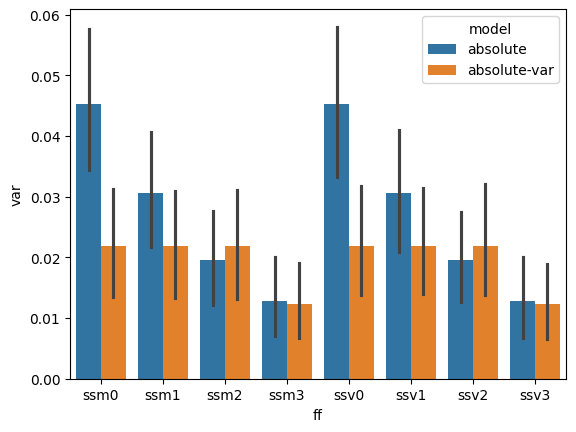

In [ ]:
# show means and variance for shields
# for this we need to get the mean and variance of the shield values 
# and create a new dataframe with the means and variances of the shield values
#  | {f'sm{i}': m.prior_mean[i] for i in range(9)}
# | {f'sv{i}': m.prior_var[i] for i in range(9)}

new_df = pd.melt(df_sim[df_sim.expName=='FullPilot12'], id_vars=['agent', 'model', 't'], value_vars=[f'ssm{i}' for i in range(4)], var_name='ff', value_name='mean')
new_df = pd.concat(
    [new_df,
    pd.melt(df_sim[df_sim.expName=='FullPilot12'], id_vars=['agent', 'model', 't'], value_vars=[f'ssv{i}' for i in range(4)], var_name='ff', value_name='var')]
)

# select only for max t
new_df = new_df[new_df.t == df_sim.t.max()]

sns.barplot(data=new_df, x='ff', y='var', hue='model')

# now for the mean AND variance



In [ ]:
mask = ((df_sim.t == df_sim.t.max()) & (df_sim.expName=='FullPilot12') & (df_sim.model=='absolute'))
df_sim[mask].ssv3.mean()

0.012868417309622711

<Axes: xlabel='ff', ylabel='mean'>

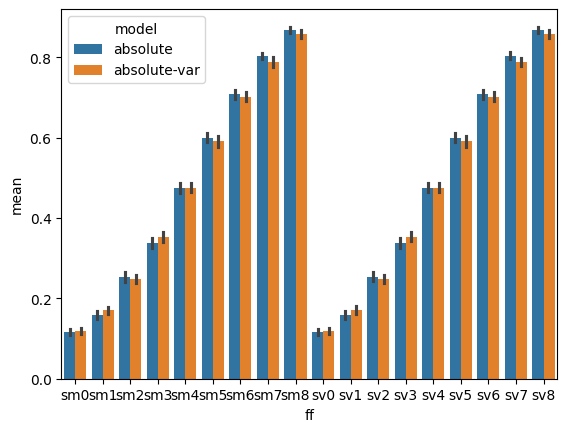

In [ ]:
# show means and variance for shields
# for this we need to get the mean and variance of the shield values 
# and create a new dataframe with the means and variances of the shield values
#  | {f'sm{i}': m.prior_mean[i] for i in range(9)}
# | {f'sv{i}': m.prior_var[i] for i in range(9)}

new_df = pd.melt(df_sim[df_sim.expName=='FullPilot12'], id_vars=['agent', 'model', 't'], value_vars=[f'sm{i}' for i in range(9)], var_name='ff', value_name='mean')
new_df = pd.concat(
    [new_df,
    pd.melt(df_sim[df_sim.expName=='FullPilot12'], id_vars=['agent', 'model', 't'], value_vars=[f'sv{i}' for i in range(9)], var_name='ff', value_name='var')]
)

# select only for max t
new_df = new_df[new_df.t == df_sim.t.max()]

sns.barplot(data=new_df, x='ff', y='mean', hue='model')

# now for the mean AND variance



# POOLED


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

absolute vs. absolute-var: t-test paired samples with Bonferroni correction, P_val:3.194e-03 t=2.995e+00


C:\Users\basil\AppData\Local\Temp\ipykernel_8340\1268465926.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['same_as_data'] = data.same_as_data.astype(int)
C:\Users\basil\AppData\Local\Temp\ipykernel_8340\1268465926.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=data,x='model', y='same_as_data', errorbar='se', palette=palette, order=model,
C:\Users\basil\AppData\Local\Temp\ipykernel_8340\1268465926.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the s

(<Axes: xlabel='model', ylabel='p(simulated choice = human choice)'>,
 [<statannotations.Annotation.Annotation at 0x21ac8ccbbe0>])

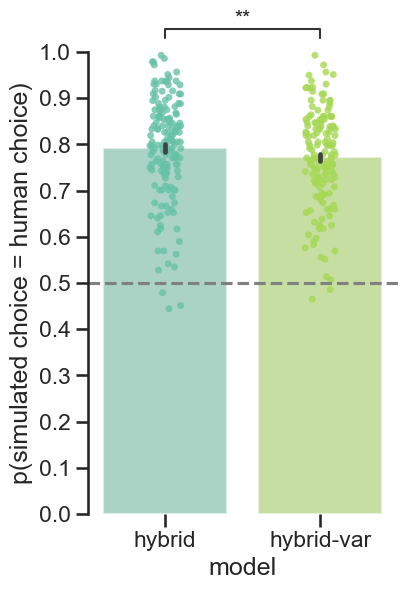

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(4, 6), 'figure.dpi':100})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('darkgrid')
sns.set_style('ticks')
sns.set_context('talk')

# model  = ['absolute','absolute-var', 'value', 'value-var', 'perceptual', 'perceptual-var']
model = ['absolute', 'absolute-var']
# model = ['absolute' ,'absolute-var']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
palette = ['C0', 'C4']
# palette = ['C3', 'C0']
data = df_sim[(df_sim.model!='data') & (df_sim.group!='random') & (df_sim.session==3)]
data['same_as_data'] = data.same_as_data.astype(int)
data = data.groupby(['agent', 'model'], as_index=False).mean(numeric_only=True)

ax = sns.barplot(data=data,x='model', y='same_as_data', errorbar='se', palette=palette, order=model, 
            alpha=.6, zorder=1)
sns.stripplot(data=data, x='model', y='same_as_data', palette=palette, order=model, 
             alpha=0.8, zorder=1)

# Finally, manually plot the error bars on top
# for bar, (x, y, err) in zip(ax.patches, zip(data['group'], data['same_as_data'], .2)):
#     plt.errorbar(x=bar.get_x() + bar.get_width() / 2, y=y, yerr=err, fmt='none', 
#                  color='black', capsize=3, zorder=3, linewidth=1.5)
    
plt.axhline(0.5, color='grey', linestyle='--')
plt.ylim(0, 1)
# alternative naming
plt.ylabel("p(simulated choice = human choice)")
# set y axis with .1 intervals
plt.yticks(np.arange(0, 1.1, 0.1))

sns.despine(bottom=True)
plt.xticks([0, 1], ['hybrid', 'hybrid-var'])
# set legend outside the plot
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# handles, labels = ax.get_legend_handles_labels()
# plt.legend(handles=handles[:len(model)], labels=labels[:len(model)], title='Model', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
x_values = data['model'].unique()

import itertools
# hue_values = by_pid['expName'].unique()
pairs = list(itertools.combinations(x_values, 2))

from statannotations.Annotator import Annotator
annotator = Annotator(ax, pairs, data=data, x='model', y='same_as_data', order=model)
annotator.configure(test='t-test_paired', text_format='star', loc='outside',comparisons_correction="Bonferroni",
                    line_height=0.02, text_offset=0.0001, line_offset_to_group=10, line_offset=10, fontsize=15)

annotator.apply_and_annotate()

# group x model

C:\Users\basil\AppData\Local\Temp\ipykernel_18568\1170571031.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['same_as_data'] = data.same_as_data.astype(int)
C:\Users\basil\AppData\Local\Temp\ipykernel_18568\1170571031.py:17: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  ax = sns.barplot(data=data, x='group', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model,
C:\Users\basil\AppData\Local\Temp\ipykernel_18568\1170571031.py:17: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(data=data, x='group', hue='model', y='same_as_data', errorbar='se', palette=palette, h

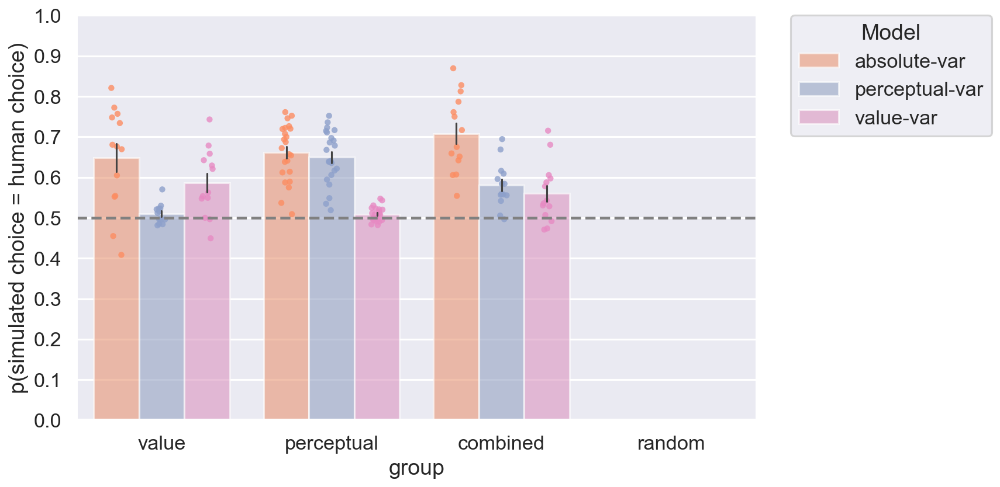

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 6), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('darkgrid')
sns.set_context('talk')

model  = ['absolute','absolute-var', 'value', 'value-var', 'perceptual', 'perceptual-var']
model = ['absolute-var', 'perceptual-var', 'value-var']
# model = ['absolute' ,'absolute-var']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
# palette = ['C3', 'C0']
data = df_sim[(df_sim.model!='data') & (df_sim.group!='random') & (df_sim.session==3) & (df_sim.expName=='FullPilot13')]
data['same_as_data'] = data.same_as_data.astype(int)
data = data.groupby(['agent', 'group','model'], as_index=False).mean(numeric_only=True)

ax = sns.barplot(data=data, x='group', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model, 
            order=['value', 'perceptual', 'combined', 'random'], errwidth=1.5, alpha=.6, zorder=1)
sns.stripplot(data=data, x='group', hue='model', y='same_as_data', palette=palette, hue_order=model, 
            order=['value', 'perceptual', 'combined', 'random'], dodge=True, alpha=0.8, zorder=1)

# Finally, manually plot the error bars on top
# for bar, (x, y, err) in zip(ax.patches, zip(data['group'], data['same_as_data'], .2)):
#     plt.errorbar(x=bar.get_x() + bar.get_width() / 2, y=y, yerr=err, fmt='none', 
#                  color='black', capsize=3, zorder=3, linewidth=1.5)
    
plt.axhline(0.5, color='grey', linestyle='--')
plt.ylim(0, 1)
# alternative naming
plt.ylabel("p(simulated choice = human choice)")
# set y axis with .1 intervals
plt.yticks(np.arange(0, 1.1, 0.1))

# set legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[:len(model)], labels=labels[:len(model)], title='Model', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# group x exp. x. model

C:\Users\garciaba\AppData\Local\Temp\ipykernel_15636\3851899885.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['same_as_data'] = data.same_as_data.astype(int)
C:\Users\garciaba\AppData\Local\Temp\ipykernel_15636\3851899885.py:21: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  ax = sns.barplot(data=data[data.expName == exp], x='group', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model,
C:\Users\garciaba\AppData\Local\Temp\ipykernel_15636\3851899885.py:21: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(data=data[data.expName == exp], x='group', hue='model', 

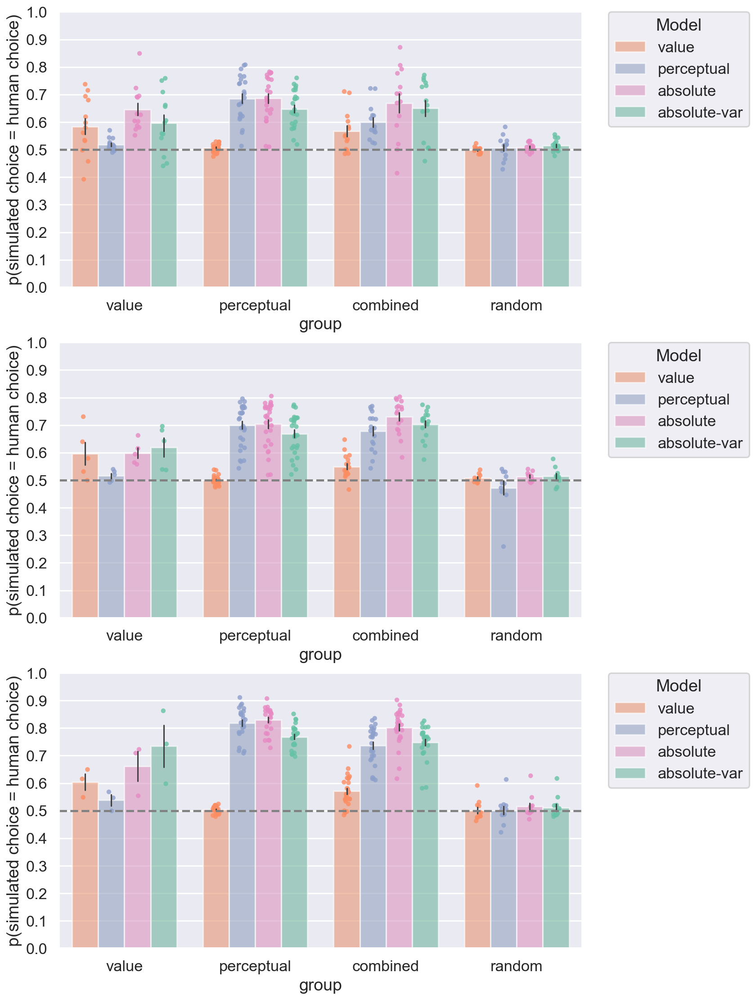

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 18), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('darkgrid')
sns.set_context('talk')

model  = ['value', 'perceptual', 'absolute', 'absolute-var']
# model = ['absolute' ,'absolute-var']    
# model = ['absolute' ,'absolute-var']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
# palette = ['C3', 'C0']
data = df_sim[(df_sim.model!='data') ]
data['same_as_data'] = data.same_as_data.astype(int)
data = data.groupby(['agent', 'expName', 'group','model'], as_index=False).mean(numeric_only=True)

count = 0
for exp in data.expName.unique():
    count += 1 
    plt.subplot(3, 1, count)
    ax = sns.barplot(data=data[data.expName == exp], x='group', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model, 
                order=['value', 'perceptual', 'combined', 'random'], errwidth=1.5, alpha=.6, zorder=1)
    sns.stripplot(data=data[data.expName == exp], x='group', hue='model', y='same_as_data', palette=palette, hue_order=model, 
                order=['value', 'perceptual', 'combined', 'random'], dodge=True, alpha=0.8, zorder=1)

    # Finally, manually plot the error bars on top
    # for bar, (x, y, err) in zip(ax.patches, zip(data['group'], data['same_as_data'], .2)):
    #     plt.errorbar(x=bar.get_x() + bar.get_width() / 2, y=y, yerr=err, fmt='none', 
    #                  color='black', capsize=3, zorder=3, linewidth=1.5)
        
    plt.axhline(0.5, color='grey', linestyle='--')
    plt.ylim(0, 1)
    # alternative naming
    plt.ylabel("p(simulated choice = human choice)")
    # set y axis with .1 intervals
    plt.yticks(np.arange(0, 1.1, 0.1))

    # set legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles=handles[:len(model)], labels=labels[:len(model)], title='Model', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# group x exp.

C:\Users\basil\AppData\Local\Temp\ipykernel_18568\2421996406.py:17: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  ax = sns.barplot(data=data, x='expName', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model,
C:\Users\basil\AppData\Local\Temp\ipykernel_18568\2421996406.py:17: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(data=data, x='expName', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model,
C:\Users\basil\AppData\Local\Temp\ipykernel_18568\2421996406.py:19: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.stripplot(data=data, x='expName', hue='model', y='same_as_data', palette=palette, hue_order=model,


([<matplotlib.axis.XTick at 0x2650ea17820>,
 [Text(0, 0, 'all or none'),
  Text(1, 0, 'partial rew.'),
  Text(2, 0, 'partial destroy')])

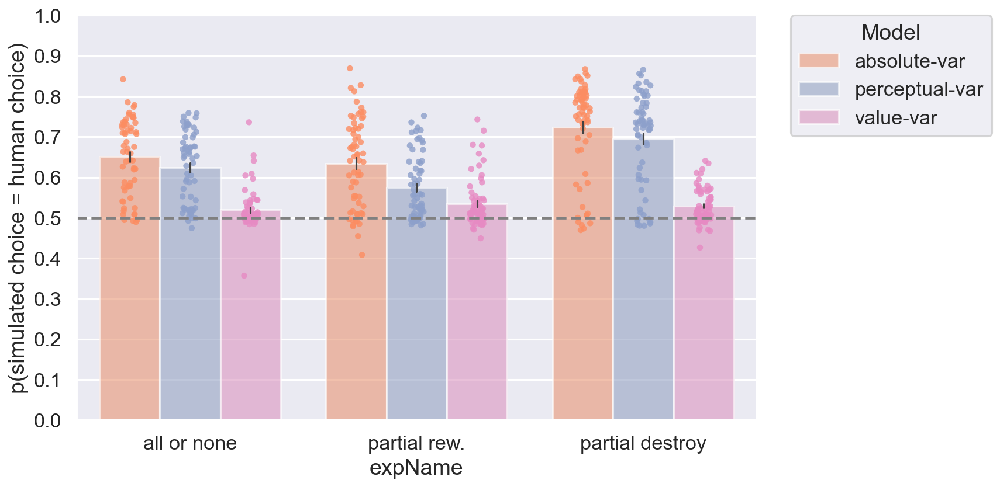

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 6), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('darkgrid')
sns.set_context('talk')

model  = ['absolute-var', 'perceptual-var', 'value-var']
# model = ['absolute' ,'absolute-var']    
# model = ['absolute' ,'absolute-var']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
# palette = ['C3', 'C0']
data = df_sim[(df_sim.session==3) & (df_sim.model!='data') ]
data['same_as_data'] = data.same_as_data.astype(int)
data = data.groupby(['agent', 'expName','model'], as_index=False).mean(numeric_only=True)

ax = sns.barplot(data=data, x='expName', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model, 
            order=['FullPilot12', 'FullPilot13', 'FullPilot14'], errwidth=1.5, alpha=.6, zorder=1)
sns.stripplot(data=data, x='expName', hue='model', y='same_as_data', palette=palette, hue_order=model, 
            order=['FullPilot12', 'FullPilot13', 'FullPilot14'], dodge=True, alpha=0.8, zorder=1)

# Finally, manually plot the error bars on top
# for bar, (x, y, err) in zip(ax.patches, zip(data['group'], data['same_as_data'], .2)):
#     plt.errorbar(x=bar.get_x() + bar.get_width() / 2, y=y, yerr=err, fmt='none', 
#                  color='black', capsize=3, zorder=3, linewidth=1.5)
    
plt.axhline(0.5, color='grey', linestyle='--')
plt.ylim(0, 1)
# alternative naming
plt.ylabel("p(simulated choice = human choice)")
# set y axis with .1 intervals
plt.yticks(np.arange(0, 1.1, 0.1))

# set legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[:len(model)], labels=labels[:len(model)], title='Model', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.xticks([0, 1, 2], ['all or none', 'partial rew.', 'partial destroy'])

# group x session

C:\Users\basil\AppData\Local\Temp\ipykernel_21668\3486318335.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['same_as_data'] = data.same_as_data.astype(int)
C:\Users\basil\AppData\Local\Temp\ipykernel_21668\3486318335.py:17: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  ax = sns.barplot(data=data, x='session', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model,
C:\Users\basil\AppData\Local\Temp\ipykernel_21668\3486318335.py:17: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(data=data, x='session', hue='model', y='same_as_data', errorbar='se', palette=palett

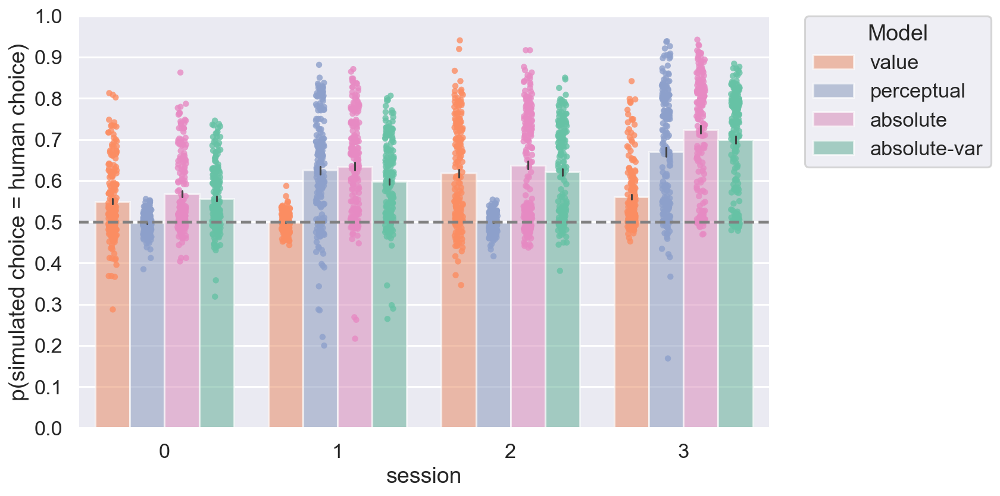

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 6), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('darkgrid')
sns.set_context('talk')

model  = ['value', 'perceptual', 'absolute', 'absolute-var']
# model = ['absolute' ,'absolute-var']    
# model = ['absolute' ,'absolute-var']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
# palette = ['C3', 'C0']
data = df_sim[(df_sim.model!='data') ]
data['same_as_data'] = data.same_as_data.astype(int)
data = data.groupby(['agent','model', 'session'], as_index=False).mean(numeric_only=True)

ax = sns.barplot(data=data, x='session', hue='model', y='same_as_data', errorbar='se', palette=palette, hue_order=model, 
             errwidth=1.5, alpha=.6, zorder=1)
sns.stripplot(data=data, x='session', hue='model', y='same_as_data', palette=palette, hue_order=model, 
             dodge=True, alpha=0.8, zorder=1)

# Finally, manually plot the error bars on top
# for bar, (x, y, err) in zip(ax.patches, zip(data['group'], data['same_as_data'], .2)):
#     plt.errorbar(x=bar.get_x() + bar.get_width() / 2, y=y, yerr=err, fmt='none', 
#                  color='black', capsize=3, zorder=3, linewidth=1.5)
    
plt.axhline(0.5, color='grey', linestyle='--')
plt.ylim(0, 1)
# alternative naming
plt.ylabel("p(simulated choice = human choice)")
# set y axis with .1 intervals
plt.yticks(np.arange(0, 1.1, 0.1))

# set legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[:len(model)], labels=labels[:len(model)], title='Model', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)



In [ ]:
df_sim

,opti_ff,opti_ss,opti_ev,p1,p2,choice,destroyed,outcome,ev1,ev2,...,t,session,agent,model,group,expName,beta_ff,beta_ss,same_as_data,n_sim
0,True,True,True,0.82,0.50,1,1,0.585,508,190,...,144,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,0,0
1,True,False,True,0.12,0.82,2,1,0.240,86,230,...,146,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
2,True,True,True,0.73,0.62,1,1,0.639,453,236,...,147,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
3,True,True,True,0.82,0.12,1,1,0.616,508,46,...,149,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
4,True,True,True,0.73,0.50,1,1,0.652,453,190,...,150,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554495,True,False,False,0.27,0.38,2,0,0.155,167,144,...,310,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554496,True,True,True,0.82,0.50,1,1,0.539,508,190,...,312,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554497,True,True,True,0.88,0.62,1,0,0.542,546,236,...,313,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554498,True,True,True,0.73,0.12,1,1,0.501,526,34,...,314,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9


In [ ]:
df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12']))  & 
     (df_sim.session.isin([3]))]  #& (df_sim.model.isin(model))]

,opti_ff,opti_ss,opti_ev,p1,p2,choice,destroyed,outcome,ev1,ev2,...,t,session,agent,model,group,expName,beta_ff,beta_ss,same_as_data,n_sim
0,True,True,True,0.82,0.50,1,1,0.585,508,190,...,144,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,0,0
1,True,False,True,0.12,0.82,2,1,0.240,86,230,...,146,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
2,True,True,True,0.73,0.62,1,1,0.639,453,236,...,147,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
3,True,True,True,0.82,0.12,1,1,0.616,508,46,...,149,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
4,True,True,True,0.73,0.50,1,1,0.652,453,190,...,150,3,610a1655e385fd7341e12778,absolute,perceptual,FullPilot12,879230.526717,77753.304312,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554495,True,False,False,0.27,0.38,2,0,0.155,167,144,...,310,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554496,True,True,True,0.82,0.50,1,1,0.539,508,190,...,312,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554497,True,True,True,0.88,0.62,1,0,0.542,546,236,...,313,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9
554498,True,True,True,0.73,0.12,1,1,0.501,526,34,...,314,3,6745171138a79bddfee4e965,absolute-var,combined,FullPilot14,999998.061003,82548.113761,1,9


In [ ]:
((df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12'])) &  (df_sim.session.isin([1])) & (df_sim.model.isin(['data']))).sum()

0

In [ ]:
df_sim.model.unique()

array(['absolute', 'absolute-var'], dtype=object)

In [ ]:
df_sim[df_sim.session==1].t.min()

48

In [ ]:
df[(df.session==1) & (df.t==df[df.session==1].t.min())]

,prolificID,expName,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,s,id,group,agent,a,r,ff1,ff2,destroy,opti_ev
110833,610a1655e385fd7341e12778,FullPilot12,1,48,-1,2,500,500,0,1,...,"(500, 500)",0,perceptual,610a1655e385fd7341e12778,1,0.000,-0.25,-0.75,0,False
110854,66f6c4195f17d26ce8c8018d,FullPilot12,1,48,-1,1,500,500,1,1,...,"(500, 500)",1,perceptual,66f6c4195f17d26ce8c8018d,0,0.500,0.75,0.50,1,True
111998,636590165e6fcc3e84ee2b6d,FullPilot12,1,48,-1,1,500,500,0,0,...,"(500, 500)",2,random,636590165e6fcc3e84ee2b6d,0,0.500,0.50,0.25,1,True
113126,667ad18688c9319e6559bdc4,FullPilot12,1,48,-1,2,500,500,0,1,...,"(500, 500)",4,combined,667ad18688c9319e6559bdc4,1,0.000,0.25,-0.50,0,False
113135,660d619f39d061875f78ac8c,FullPilot12,1,48,-1,2,500,500,1,0,...,"(500, 500)",3,random,660d619f39d061875f78ac8c,1,0.000,0.50,-0.25,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125058,6743a27eda56d91031757fdc,FullPilot14,1,48,-1,1,189,439,1,1,...,"(500, 500)",185,combined,6743a27eda56d91031757fdc,0,0.189,-0.25,1.00,1,False
126700,6751e21bab5bb259997e4c67,FullPilot14,1,48,-1,2,59,409,1,0,...,"(500, 500)",186,perceptual,6751e21bab5bb259997e4c67,1,0.409,-1.00,0.75,1,True
127400,67628f7b4f57e91918c49e72,FullPilot14,1,48,-1,2,90,135,0,1,...,"(500, 500)",187,perceptual,67628f7b4f57e91918c49e72,1,0.135,-0.75,-0.50,1,True
127635,67055efcc9d6595c24d60bb5,FullPilot14,1,48,-1,2,365,250,0,1,...,"(500, 500)",188,combined,67055efcc9d6595c24d60bb5,1,0.250,0.50,0.00,1,False


In [ ]:
df_sim[(df_sim.session==1) & (df_sim.t==df_sim[df_sim.session==1].t.min()) & (df_sim.model=='data')]

,opti_ff,opti_ss,opti_ev,p1,p2,choice,destroyed,outcome,ev1,ev2,...,t,session,agent,model,group,expName,beta_ff,beta_ss,same_as_data,n_sim
621,0.0,0.0,False,0.38,0.18,2,0,0.000,190,90,...,48,1,610a1655e385fd7341e12778,data,perceptual,FullPilot12,NaN,NaN,NaN,NaN
1482,True,False,True,0.38,0.18,1,1,0.500,190,90,...,48,1,610a1655e385fd7341e12778,data,perceptual,FullPilot12,678168.427482,126814.846161,0.0,1.0
2343,True,False,True,0.38,0.18,1,1,0.500,190,90,...,48,1,610a1655e385fd7341e12778,data,perceptual,FullPilot12,678168.427482,126814.846161,0.0,2.0
3204,True,False,True,0.38,0.18,1,0,0.500,190,90,...,48,1,610a1655e385fd7341e12778,data,perceptual,FullPilot12,678168.427482,126814.846161,0.0,3.0
4065,True,False,True,0.38,0.18,1,0,0.500,190,90,...,48,1,610a1655e385fd7341e12778,data,perceptual,FullPilot12,678168.427482,126814.846161,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1647504,True,False,True,0.50,0.73,2,1,0.365,250,365,...,48,1,6745171138a79bddfee4e965,data,combined,FullPilot14,999998.061003,82548.113761,0.0,5.0
1648368,True,False,True,0.50,0.73,2,1,0.365,250,365,...,48,1,6745171138a79bddfee4e965,data,combined,FullPilot14,999998.061003,82548.113761,0.0,6.0
1649232,True,False,True,0.50,0.73,2,1,0.365,250,365,...,48,1,6745171138a79bddfee4e965,data,combined,FullPilot14,999998.061003,82548.113761,0.0,7.0
1650096,True,False,True,0.50,0.73,2,1,0.365,250,365,...,48,1,6745171138a79bddfee4e965,data,combined,FullPilot14,999998.061003,82548.113761,0.0,8.0


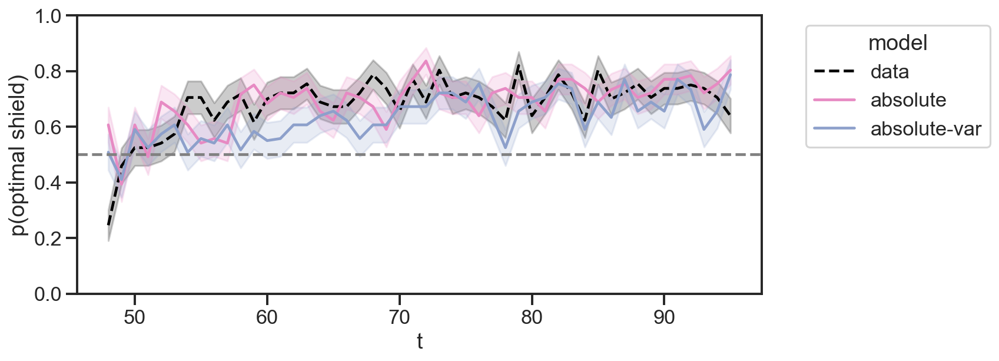

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 9), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

# model  = ['value', 'perceptual', 'absolute', 'absolute-var', 'random']
model = ['absolute' ,'absolute-var']
# palette = ['C1', 'C2', 'C3', 'C0', 'grey']
palette = ['C3', 'C2']
# 

plt.subplot(2, 1, 1)
sns.lineplot(x='t', y='opti_ff', data=df_sim[(df_sim.expName.isin(['FullPilot12'])) & 
     (df_sim.session.isin([1]))  & (df_sim.model.isin(['data']))], alpha=1, color='black', label='data', errorbar=('se'), linestyle='--')

sns.lineplot(x='t', y='opti_ff', data=df_sim[(df_sim.expName.isin(['FullPilot12']))  & 
     (df_sim.session.isin([1]))  & (df_sim.model.isin(model))], hue="model",  errorbar=('se'),
     hue_order=model, palette=palette)

# set linestyle on second line to dashed
# plt.gca().get_lines()[0].set_linestyle("--")
# smooth line with 
plt.axhline(y=0.5, color='grey', linestyle='--')
plt.ylabel('p(optimal shield)')
# plt.ylim(0,1)
# set x ticks to 72
# plt.xticks(np.arange(0, 48, 5))
plt.ylim(0,1)
#get labels and handles
handles, labels = plt.gca().get_legend_handles_labels()

# legend out of plot
plt.legend(title='model', bbox_to_anchor=(1.05, 1), loc='upper left')
           
# plt.legend(title='training', labels=['1', '2'], handles=handles[[2, 3]], loc='upper left')
# plt.legend().remove()

([], [])

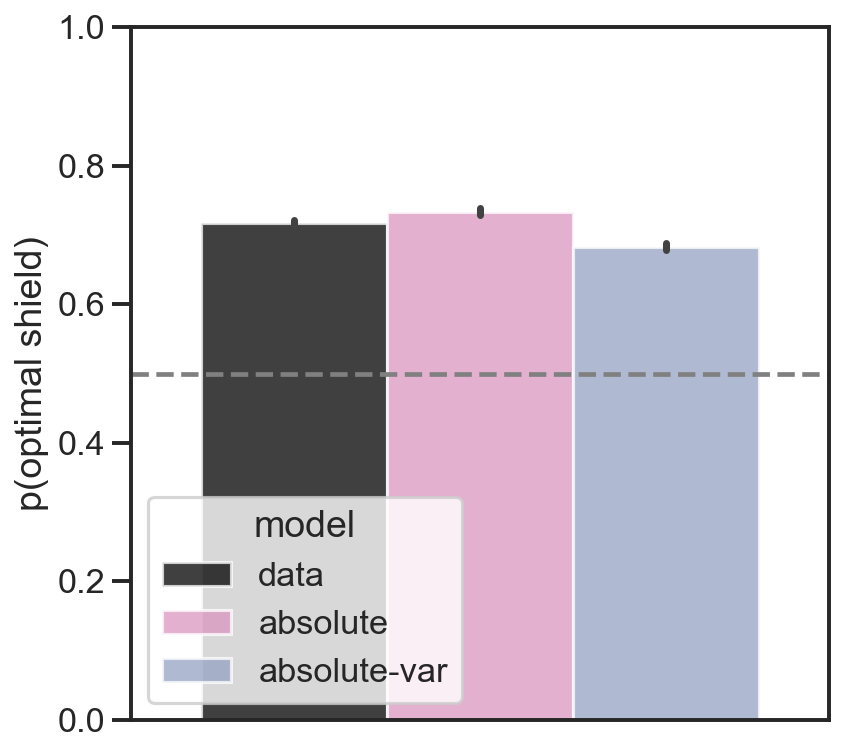

In [ ]:
sns.set({'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

model = ['data', 'value', 'perceptual', 'absolute', 'absolute-var', 'random']
model = ['data', 'absolute', 'absolute-var']
palette = ['black', 'C1', 'C2', 'C3', 'C0', 'grey']
palette = ['black', 'C3', 'C2']

sns.barplot(y='opti_ff', data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12']))  &
     (df_sim.session.isin([1]))  & (df_sim.model.isin(model))], hue="model",  errorbar=('se'),
     hue_order=model, palette=palette, alpha=.75)
plt.axhline(y=0.5, color='grey', linestyle='--')
# legend outside
plt.ylim(0,1)
plt.ylabel('p(optimal shield)')
plt.xticks([])

# legend out of plot
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend().remove()

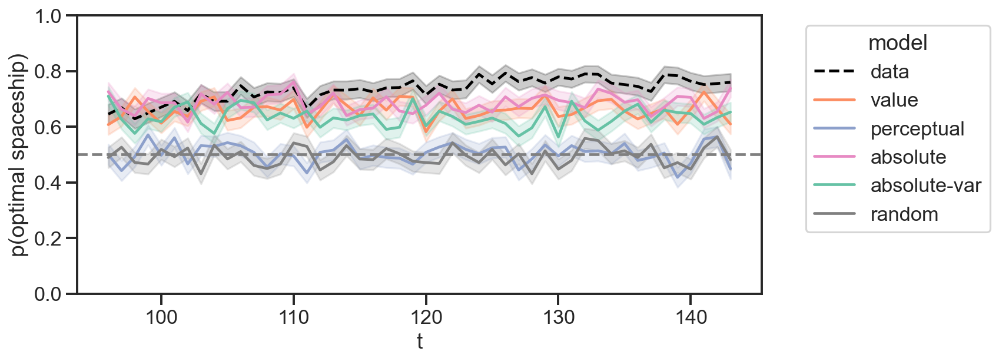

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(10, 9), 'figure.dpi':150})
from scipy.ndimage import gaussian_filter
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

model = ['value', 'perceptual', 'absolute', 'absolute-var', 'random']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
plt.subplot(2, 1, 1)
sns.lineplot(x='t', y='opti_ss', data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12']))  &
     (df_sim.session.isin([2]))  & (df_sim.model.isin(['data']))], alpha=1, color='black', label='data', errorbar=('se'), linestyle='--')
sns.lineplot(x='t', y='opti_ss', data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12'])) &  
     (df_sim.session.isin([2]))  & (df_sim.model.isin(model))], hue="model",  errorbar=('se'),
     hue_order=model, palette=palette)

# plot a smooth line using the mean of the data
# set dashed line for first line
# plt.gca().get_lines()[0].set_linestyle(":")



# set linestyle on second line to dashed
# plt.gca().get_lines()[0].set_linestyle("--")
# smooth line with 
plt.axhline(y=0.5, color='grey', linestyle='--')
plt.ylabel('p(optimal spaceship)')
# plt.ylim(0,1)
# set x ticks to 72
# plt.xticks(np.arange(0, 48, 5))
plt.ylim(0,1)
#get labels and handles
handles, labels = plt.gca().get_legend_handles_labels()

# legend out of plot
plt.legend(title='model', bbox_to_anchor=(1.05, 1), loc='upper left')
           
# plt.legend(title='training', labels=['1', '2'], handles=handles[[2, 3]], loc='upper left')
# plt.legend().remove()

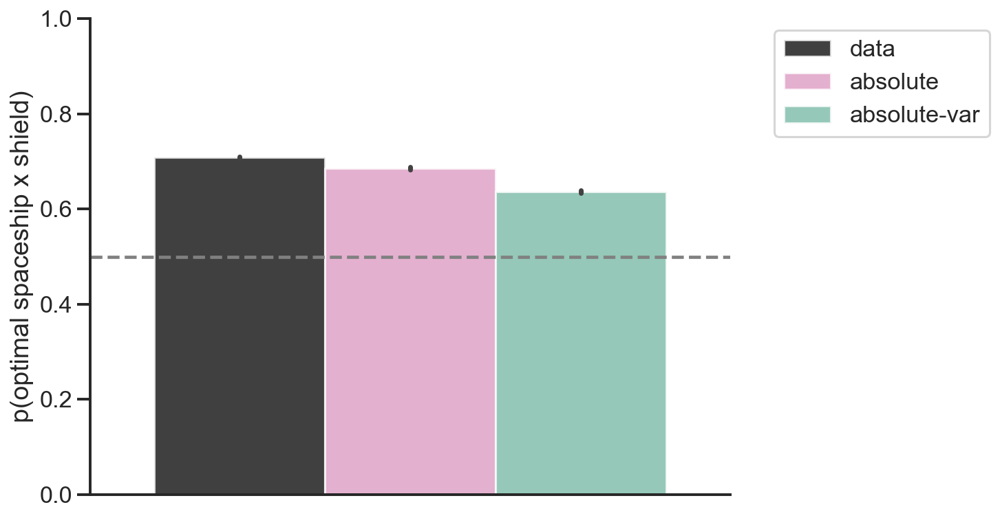

In [ ]:
sns.set({'figure.figsize':(8, 6), 'figure.dpi':150})
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')
from statannotations.Annotator import Annotator
import itertools


model = ['data', 'value', 'perceptual', 'absolute', 'absolute-var', 'random']
palette = ['black', 'C1', 'C2', 'C3', 'C0', 'grey']
model = ['data', 'absolute', 'absolute-var']
palette = ['black', 'C3', 'C0']


data = df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12']))  &
     (df_sim.session.isin([3]))  & (df_sim.model.isin(model))]

data['opti_ff'] = data['opti_ff'].astype(float)


ax = sns.barplot(y='opti_ff', data=data, hue="model",  errorbar=('se'), hue_order=model, palette=palette, alpha=.75)
plt.axhline(y=0.5, color='grey', linestyle='--')

# generate pairs with itertools
pairs = list(itertools.combinations(model, 2))


# legend outside
plt.ylim(0,1)
plt.ylabel('p(optimal spaceship x shield)')
plt.xticks([])
sns.despine()

# annotator = Annotator(ax, pairs, data=data, x='model', y='opti_ff', order=model, loc='outside')
# annotator.configure(test='t-test_paired', text_format='star', loc='outside', text_offset=0.01, fontsize=13)
# annotator.apply_and_annotate()
# legend out of plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.legend().remove()

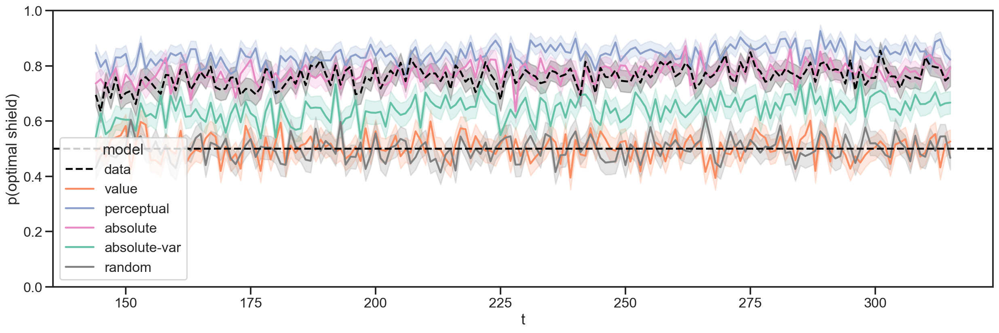

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(20, 13), 'figure.dpi':150})

sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')


model = ['value', 'perceptual', 'absolute', 'absolute-var', 'random']
palette = ['C1', 'C2', 'C3', 'C0', 'grey']
plt.subplot(2, 1, 1)

sns.lineplot(x='t', y='opti_ff', data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12'])) & (df_sim.group!='random') &
     (df_sim.session.isin([3]))  & (df_sim.model.isin(['data']))], alpha=1, color='black', label='data', errorbar=('se'), linestyle='--', zorder=10)
sns.lineplot(x='t', y='opti_ff', data=df_sim[(df_sim.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14'])) & (df_sim.group!='random') &
     (df_sim.session.isin([3])) & (df_sim.model.isin(model))], hue="model",  errorbar=('se'),
     hue_order=model, palette=palette)

# set linestyle on second line to dashed
# plt.gca().get_lines()[0].set_linestyle("--")
# smooth line with 
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal shield)')
# plt.ylim(0,1)
# set x ticks to 72
# plt.xticks(np.arange(0, 48, 5))
plt.ylim(0,1)
#get labels and handles
handles, labels = plt.gca().get_legend_handles_labels()

# plt.legend(title='training', labels=['1', '2'], handles=handles[[2, 3]], loc='upper left')
# plt.legend().remove()

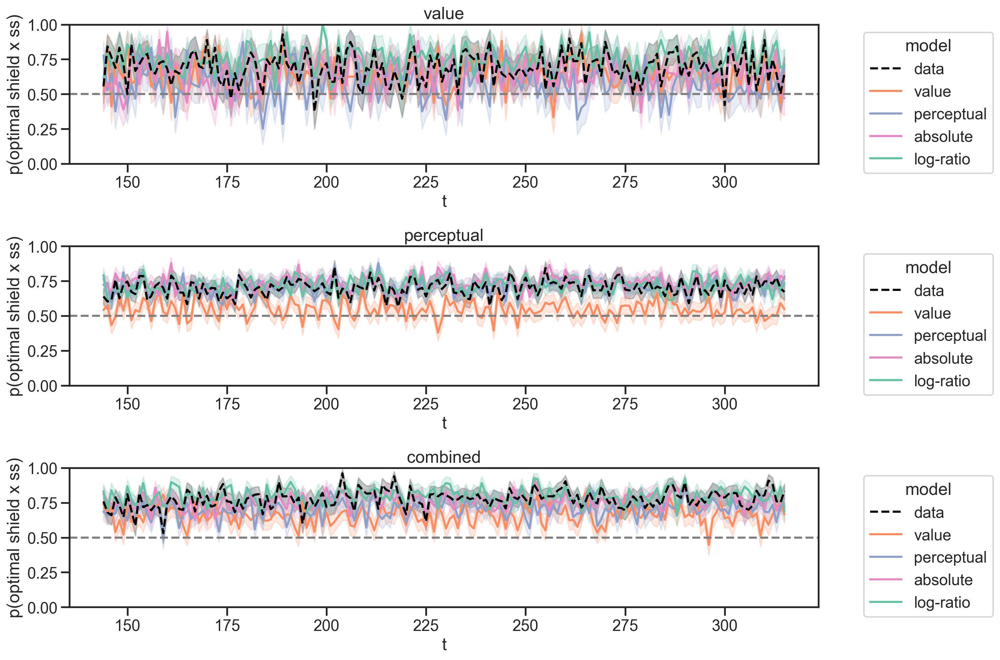

In [ ]:
import matplotlib.pyplot as plt
sns.set(rc={'figure.figsize':(15, 10), 'figure.dpi':200})

sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')


count = 0
for group in ['value', 'perceptual', 'combined']:
     count += 1
     plt.subplot(3, 1, count)

     sns.lineplot(x='t', y='opti_ev', data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12'])) & (df_sim.group==group) &
          (df_sim.session.isin([3]))  & (df_sim.model.isin(['data']))], alpha=1, color='black', label='data', errorbar=('se'), linestyle='--', zorder=10)
     sns.lineplot(x='t', y='opti_ev', data=df_sim[(df_sim.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14'])) & (df_sim.group==group) &
          (df_sim.session.isin([3])) & (df_sim.model!='random') & (df_sim.model.isin(['perceptual', 'value', 'log-ratio', 'absolute']))], hue="model",  errorbar=('se'),
          hue_order=['value', 'perceptual', 'absolute', 'log-ratio'], palette=['C1', 'C2', 'C3', 'C0'])

# set linestyle on second line to dashed
# plt.gca().get_lines()[0].set_linestyle("--")
# smooth line with 
     plt.axhline(y=0.5, color='grey', linestyle='--')
     plt.ylabel('p(optimal shield x ss)')
     plt.title(group)
# plt.ylim(0,1)
# set x ticks to 72
# plt.xticks(np.arange(0, 48, 5))
     plt.ylim(0,1)
     plt.legend(title='model', bbox_to_anchor=(1.05, 1), loc='upper left')
#get labels and handles
     # handles, labels = plt.gca().get_legend_handles_labels()
plt.tight_layout()
# plt.legend().remove()

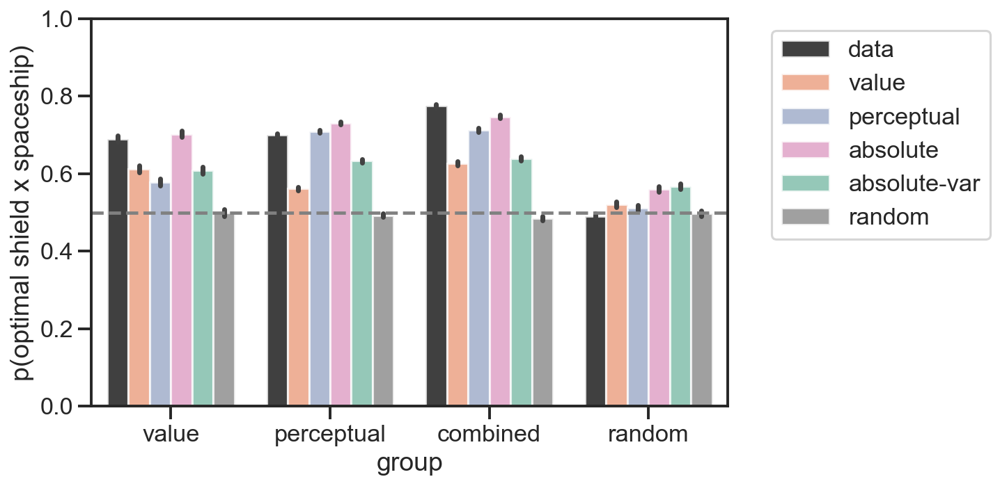

In [ ]:
sns.set({'figure.figsize':(10, 10/2), 'figure.dpi':150})
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

model = ['data', 'value', 'perceptual', 'absolute', 'absolute-var', 'random']
y = 'opti_ev'
sns.barplot(x='group', y=y, data=df_sim[(df_sim.expName.isin(['FullPilot14', 'FullPilot13', 'FullPilot12']))  &
     (df_sim.session.isin([3]))  & (df_sim.model.isin(model))], hue="model",  errorbar=('se'),
     hue_order=model, palette=['black', 'C1', 'C2', 'C3', 'C0', 'grey'], alpha=.75, order=['value', 'perceptual', 'combined', 'random'])
plt.axhline(y=0.5, color='grey', linestyle='--')
# legend outside
plt.ylim(0,1)

if y == 'opti_ff':
     plt.ylabel('p(optimal shield)')
if y == 'opti_ss':
     plt.ylabel('p(optimal spaceship)')
if y == 'opti_ev':
     plt.ylabel('p(optimal shield x spaceship)')
# plt.xticks([])
# legend out of plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# plt.suptitle('partial destroy')
plt.tight_layout()
# plt.legend().remove()

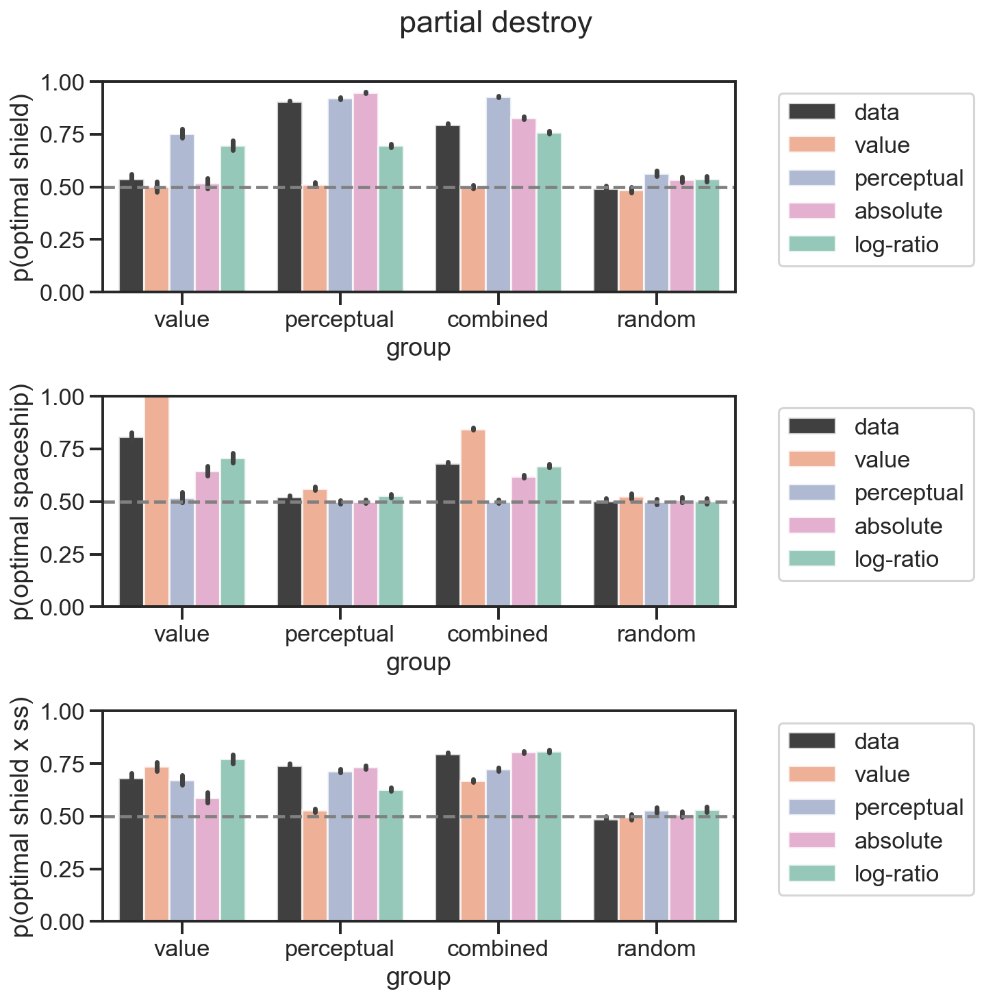

In [ ]:
sns.set({'figure.figsize':(10, 10), 'figure.dpi':150})
sns.set_palette('Set2')
sns.set_style('ticks')
sns.set_context('talk')

count = 0
for y in ['opti_ff', 'opti_ss', 'opti_ev']:
     count += 1
     plt.subplot(3, 1, count)
    
     sns.barplot(x='group', y=y, data=df_sim[(df_sim.expName.isin(['FullPilot14']))  &
          (df_sim.session.isin([3]))  & (df_sim.model.isin(['log-ratio', 'absolute', 'data', 'perceptual', 'value']))], hue="model",  errorbar=('se'),
          hue_order=['data', 'value', 'perceptual', 'absolute', 'log-ratio'], palette=['black', 'C1', 'C2', 'C3', 'C0'], alpha=.75, order=['value', 'perceptual', 'combined', 'random'])
     plt.axhline(y=0.5, color='grey', linestyle='--')
     # legend outside
     plt.ylim(0,1)

     if y == 'opti_ff':
          plt.ylabel('p(optimal shield)')
     if y == 'opti_ss':
          plt.ylabel('p(optimal spaceship)')
     if y == 'opti_ev':
          plt.ylabel('p(optimal shield x ss)')
     # plt.xticks([])
     # legend out of plot
     plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.suptitle('partial destroy')
plt.tight_layout()
# plt.legend().remove()

In [ ]:
df_sim['opti_ff'] = df_sim.opti_ff.astype(float)
df_sim['opti_ss'] = df_sim.opti_ss.astype(float)


Text(74.50000000000001, 0.5, 'p(optimal spaceship)')

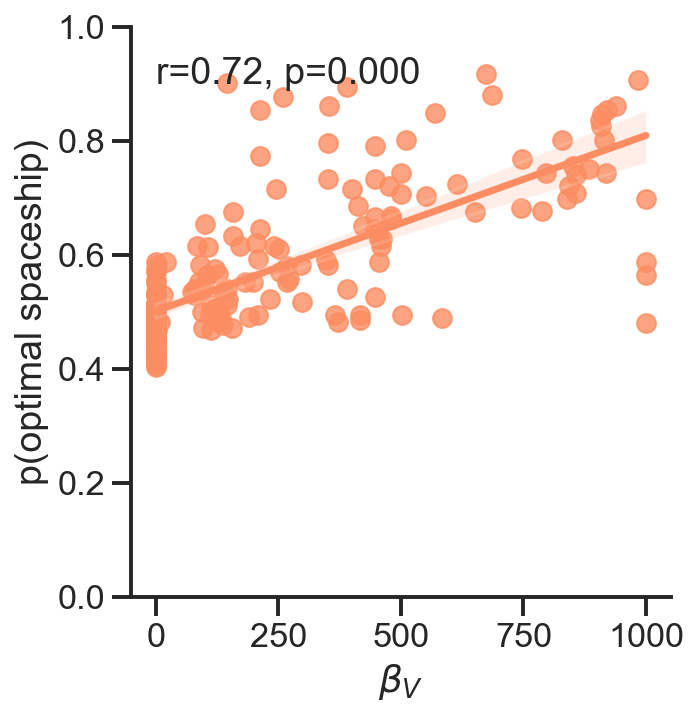

In [ ]:
model = 'absolute'
# avg = df_sim.groupby(['agent', 'model'], as_index=False).mean(numeric_only=True)
avg_sim = df_sim[df_sim.session==3].groupby(['agent', 'model'], as_index=False).mean(numeric_only=True)

avg = df[df.session==3].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

for pid in avg.prolificID.unique():
    avg.loc[avg.prolificID==pid, 'beta_ss'] = avg_sim[(avg_sim.agent==pid) & (avg_sim.model==model)].beta_ss.values[0]
    avg.loc[avg.prolificID==pid, 'beta_ff'] = avg_sim[(avg_sim.agent==pid) & (avg_sim.model==model)].beta_ff.values[0]

# change color of lmplot
colors = sns.color_palette("Set2")
sns.set_palette([colors[1]])
sns.lmplot(x='beta_ss', y='opti_ss', data=avg, fit_reg=True)
plt.ylim(0,1)
# pearson corr
import scipy.stats as stats

r, p = stats.pearsonr(avg.beta_ss, avg.opti_ss)

plt.text(0.5, 0.9, f'r={r:.2f}, p={p:.3f}')

plt.xlabel('$\\beta_{V}$')
plt.ylabel('p(optimal spaceship)') 

In [ ]:
import pymc3 as pm
import numpy as np
import pandas as pd

# Example data
spaceship_means = np.array([280, 380, 620, 720])
shield_values_true = np.random.uniform(0.12, 0.88, size=172)
observed_rewards = spaceship_means[np.random.choice(len(spaceship_means), size=172)] * shield_values_true

# Prepare data for fitting
data = pd.DataFrame({
    'observed_rewards': observed_rewards,
    'spaceship_means': spaceship_means[np.random.choice(len(spaceship_means), size=172)]
})

# Model definition using PyMC3
with pm.Model() as model:
    # Prior for shield value (Uniform distribution between 0.12 and 0.88)
    shield = pm.Uniform('shield', lower=0.12, upper=0.88, shape=(len(data),))

    # Likelihood function: the observed rewards are generated by spaceship mean * shield value
    expected_rewards = data['spaceship_means'].values * shield
    sigma = pm.HalfNormal('sigma', sigma=1)  # Error term (standard deviation)
    likelihood = pm.Normal('likelihood', mu=expected_rewards, sigma=sigma, observed=data['observed_rewards'])

    # Inference
    trace = pm.sample(100, return_inferencedata=False)

# Get the posterior estimates for shield values
shield_posterior = trace['shield']

# Display estimated shield values (e.g., mean of posterior samples)
estimated_shields = shield_posterior.mean(axis=0)
print("Estimated shield values:", estimated_shields)


The version of PyMC you are using is very outdated.

Please upgrade to the latest version of PyMC https://www.pymc.io/projects/docs/en/stable/installation.html

Also notice that PyMC3 has been renamed to PyMC.
Only 100 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, shield]


Sampling 4 chains for 1_000 tune and 100 draw iterations (4_000 + 400 draws total) took 1148 seconds.


Estimated shield values: [0.61547238 0.70414301 0.53575201 0.25212649 0.8721079  0.39456702
 0.45962257 0.40486163 0.40079023 0.84907179 0.17425599 0.24163712
 0.13768023 0.77814071 0.3813304  0.31484234 0.15188668 0.18320965
 0.84933908 0.43606881 0.22235149 0.48990065 0.56653148 0.80645281
 0.79269856 0.87008314 0.56618943 0.83332497 0.17883818 0.33048727
 0.828314   0.44306348 0.51122145 0.16503815 0.86934868 0.28501039
 0.18013967 0.83876845 0.85944686 0.19251102 0.20315357 0.54862457
 0.48548488 0.84193841 0.20350568 0.72095589 0.54777978 0.78202023
 0.47558711 0.67717089 0.48918774 0.8696669  0.70378194 0.28461857
 0.58479691 0.523594   0.85052666 0.8383545  0.82793333 0.39060562
 0.73873191 0.51756608 0.18620979 0.4785151  0.14850934 0.87122999
 0.40650877 0.55986258 0.55498736 0.45549901 0.38911375 0.81807234
 0.37708933 0.83539664 0.74620214 0.76222741 0.67933961 0.74802999
 0.35701123 0.86045461 0.26654692 0.30491771 0.60009076 0.48523947
 0.28405414 0.48168523 0.68156262 0.3

Text(74.50000000000001, 0.5, 'p(optimal shield)')

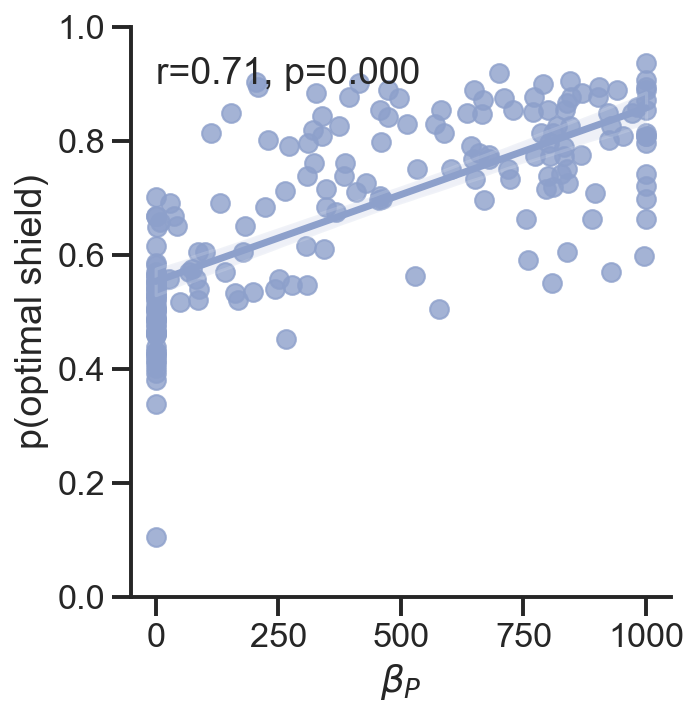

In [ ]:
model = 'absolute'
# avg = df_sim.groupby(['agent', 'model'], as_index=False).mean(numeric_only=True)

avg_sim = df_sim[df_sim.session==3].groupby(['agent', 'model'], as_index=False).mean(numeric_only=True)

avg = df[df.session==3].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

for pid in avg.prolificID.unique():
    avg.loc[avg.prolificID==pid, 'beta_ss'] = avg_sim[(avg_sim.agent==pid) & (avg_sim.model==model)].beta_ss.values[0]
    avg.loc[avg.prolificID==pid, 'beta_ff'] = avg_sim[(avg_sim.agent==pid) & (avg_sim.model==model)].beta_ff.values[0]

# change color of lmplot
colors = sns.color_palette("Set2")
sns.set_palette([colors[2]])
sns.lmplot(x='beta_ff', y='opti_ff', data=avg, fit_reg=True)
plt.ylim(0,1)
# pearson corr
import scipy.stats as stats

r, p = stats.pearsonr(avg.beta_ff, avg.opti_ff)

plt.text(0.5, 0.9, f'r={r:.2f}, p={p:.3f}')

plt.xlabel('$\\beta_{P}$')
plt.ylabel('p(optimal shield)') 

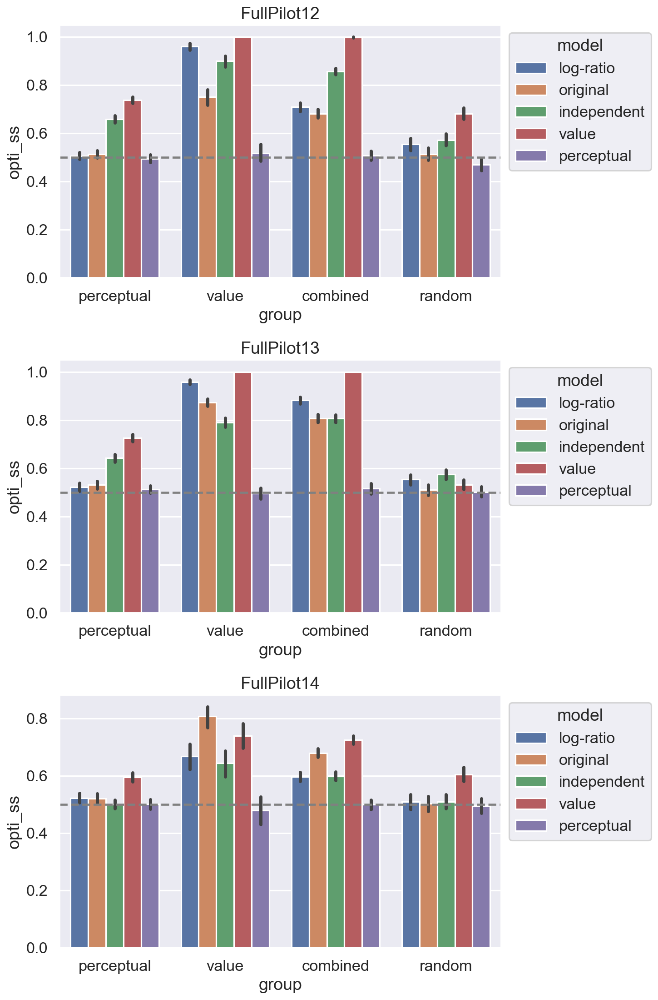

In [ ]:
sns.set({'figure.figsize':(10, 15), 'figure.dpi':150})

count = 0
for exp in ['FullPilot12', 'FullPilot13', 'FullPilot14']:
    count += 1
    plt.subplot(3, 1, count)
    sns.barplot(x='group', y='opti_ss', hue='model', data=df_sim[(df_sim.expName==exp) & (df_sim.session.isin([3]))],
            order=['perceptual', 'value', 'combined', 'random'])
    plt.axhline(y=0.5, color='grey', linestyle='--')

    # put legend outside the plot
    plt.legend(title='model', loc='upper left', bbox_to_anchor=(1, 1))
    
    plt.title(exp)

plt.tight_layout()

In [ ]:
expName == 'FullPilot13'
df_sim[(df_sim.model=='independent') & (df_sim.expName==expName) & (df_sim.session.isin([2]))]\
.groupby(['group']).mean(numeric_only=True)[['beta_ff', 'beta_ss']]

,beta_ff,beta_ss
group,,
combined,61.693364,39.832754
perceptual,60.502427,3.203956
random,4.356642,0.241233
value,24.508303,91.301050


# FIT


In [ ]:
import itertools
from scipy.special import logsumexp

def fit(x0, *args):
    # print('Running fit...')
    model, session, ntrials, s, a, r, destroy, ff1, ff2, ff_values = args
    try:
        _ = len(x0)
    except:
        x0 = [x0]

    if model == 'single':
        temp = x0[0]
        # leak = x0[2]
        leak = 0
        fit_perceptual = 'single'
        fit_value = 'single'
        m = NormativeEV(states=s, nstate=len(np.unique(s)), x=list(ff_values), temp=temp, leak=leak)

    # if model == 'random':
        # m = RandomModel(params=x0)
    if model == 'perceptual':
        perceptual_temp = x0[0]
        rl_temp = 0
        leak = 0
        fit_perceptual = 'logit'
        fit_value = 'relative'
        m = NormativeLogRatio(states=s, nstate=len(np.unique(s)),
                                perceptual_temp=perceptual_temp, rl_temp=rl_temp,
                                leak=leak, x=list(ff_values), fit_perceptual=fit_perceptual)
    
    if model == 'value':
        perceptual_temp = 0
        rl_temp = x0[0]
        leak = 0
        fit_value = 'relative'
        fit_perceptual = 'logit'
        m = NormativeLogRatio(states=s, nstate=len(np.unique(s)),
                                perceptual_temp=perceptual_temp, rl_temp=rl_temp,
                                leak=leak, x=list(ff_values), fit_perceptual=fit_perceptual)
        

    if model == 'log-ratio':
        perceptual_temp = x0[0]
        rl_temp = x0[1]
        leak = 0
        fit_perceptual = 'logit'
        fit_value = 'relative'
        # leak = x0[2]
        m = NormativeLogRatio(states=s, nstate=len(np.unique(s)),
                                perceptual_temp=perceptual_temp, rl_temp=rl_temp,
                                leak=leak, x=list(ff_values), 
                                fit_perceptual=fit_perceptual, fit_value=fit_value, slope_prior=.5)

    if model == 'independent':
        perceptual_temp = x0[0]
        rl_temp = x0[1]
        leak = 0
        fit_value = 'absolute'
        fit_perceptual = 'value'
        # leak = x0[2]
        m = NormativeIndependent(states=s, nstate=len(np.unique(s)),
                                  perceptual_temp=perceptual_temp, rl_temp=rl_temp, leak=leak, x=list(ff_values),
                                  fit_value=fit_value, fit_perceptual=fit_perceptual)
    
    if model != 'random':
        ll = 0

        for t in range(ntrials):
            
            # if a[t] not in (0, 1):
                # continue
            
            if session[t] in (1, 3) and model != 'value':
                ff_chosen = [ff1[t], ff2[t]][a[t]]
                if fit_perceptual == 'value':
                    m.learn_perceptual(ff_chosen, r[t])
                else:
                    m.learn_perceptual(ff_chosen, destroy[t])

            if session[t] in (0, 2, 3) and model != 'perceptual':
                if destroy[t]:
                    m.learn_value(s[t], a[t], r[t])
            
            # print('Session:', session[t], 'Trial:', t, 'ff1:', ff1[t], 'ff2:', ff2[t], 's:', s[t], 'a:', a[t], 'r:', r[t], 'destroy:', destroy[t])
            p_of_choices = m.ll_of_choice(ff1[t], ff2[t], s[t], a[t])
            ll += np.log(np.exp(p_of_choices - logsumexp(p_of_choices)))[a[t]]          
                
    else:
        ll = 0
        for t in range(ntrials):
            ll += np.log(np.exp([.5, .5] - logsumexp([.5, .5])))[0]

    return -ll, m.get_params()

def fit_pwf(x0, *args):
    ntrials, s, a, r, destroy, ff1, ff2, ff_values = args
    logistic = lambda ff, x: 1/(1+np.exp(ff*-x))
    ll = 0

    for t in range(ntrials):
        ff = np.array([ff1[t], ff2[t]])

        # ll += np.log(logistic(ff_chosen, x0[0]))
        x = logistic(ff, x0[0]) * r[t]
        
        # p1 = 1/(1+np.exp(x[1]-x[0]))
        # p2 = 1-p1
        # ll += np.log([p1, p2][a[t]])

        ll += np.log(np.exp(x - logsumexp(x)))[a[t]]

    return (-ll, 0)


def minimize(f, space, args):
    array = np.zeros(len(space))
    params = []
    count = 0
    for x in space:
        array[count], param = f(x, *args)
        params.append(param)
        count += 1
    argmin = np.argmin(array)
    return (space[argmin], array[argmin],params[argmin], array)
        


    

In [ ]:
from joblib import Parallel, delayed
import itertools
from pybads import BADS
import pandas as pd
from tqdm.notebook import tqdm
import numpy as np

# Assuming df is predefined
exp = ['FullPilot12', 'FullPilot13', 'FullPilot14']
agents = df[df.expName.isin(exp)].agent.unique()
models = [ 'value', 'perceptual']
parallel = False 

# Function to optimize for one agent and model
def optimize_agent_model(agent, model, agent_data):
    # print('Running optimization for', agent, model)
    df2 = agent_data
    # drop rows where session==3 and pair is not in [0,1]
    
    # Condition to drop rows
    condition = (df2['session'] == 3) & (~df2['pair'].isin([0, 1]))

    # Drop rows meeting the condition, keeping other rows intact
    df2 = df2.loc[~condition]

    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    session = df2.session.values
    destroy = df2.destroy.values
    ntrials = df2.shape[0]

    def target(x):
        return fit(x, *(model, session, ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()))[0]

    if model in ['single', 'value', 'perceptual']:
        lower_bounds = np.array([0])
        upper_bounds = np.array([100])
        x0 = np.array([1])

    if model in ['independent', 'log-ratio']:
        lower_bounds = np.array([0, 0])
        upper_bounds = np.array([100, 100])
        x0 = np.array([1, 1])
    

    # lower_bounds = np.array([0, 0, 0])
    # upper_bounds = np.array([100, 100, 1])
    # x0 = np.array([1, 1, 0.5])

    bads = BADS(
        target,
        x0=x0,
        lower_bounds=lower_bounds,
        upper_bounds=upper_bounds,
        options={'display': 'off'}
    )

    optimize_result = bads.optimize()
    return (agent, model), {'x': optimize_result.x, 'll': optimize_result.fval}

# Prepare list of all agent-model pairs
tasks = list(itertools.product(agents, models))
pbar = tqdm(total=len(agents)*len(models))


if parallel:
    # Parallel execution with notebook-friendly progress bar
    results = []
    count = 0
    for result in Parallel(n_jobs=4,
                            backend='threading'
    )(delayed(optimize_agent_model)(agent, model, df[df.agent == agent].sort_values('t')) for agent, model in tasks):
        results.append(result)
        count += 1
        pbar.update()

else:

    # non parallel version
    results = []
    for agent, model in tasks:
        results.append(optimize_agent_model(agent, model, df[df.agent == agent].sort_values('t')))
        pbar.update()


# Gather results
xopt = dict(results)


  0%|          | 0/380 [00:00<?, ?it/s]

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [ ]:
# print likelihood function
# -----------------------------------------------------------------
# parameters to tune
import itertools
from pybads import BADS
import scipy.optimize as opt
from tqdm.notebook import tqdm
# timeit

pbar = tqdm(total=len(df.agent.unique())*2)

#install IPyWidgets

# space = np.arange(0, 100, 5)
space = np.linspace(0, 20, 20)
space_all = np.array(list(itertools.product(space, repeat=2)))
# import pyfmincon.opt
# pyfmincon.opt.connect()
d = []

xopt = {}
for agent in df.agent.unique():
    for model in ['single', 'log-ratio']:
        df2 = df[df.agent==agent]
        # order by trial number
        df2 = df2.sort_values('t')
        
        s, a, r = df2.s.values, df2.a.values, df2.r.values
        ff1, ff2 = df2.ff1.values, df2.ff2.values
        session = df2.session.values
        destroy = df2.destroy.values
        ntrials = df2.shape[0]
        
        # print all params
        def target(x):
            return fit(x, *(model, session, ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()))[0]

        lower_bounds = np.array([0,0, 0])
        upper_bounds = np.array([100, 100, 1])
        plausible_lower_bounds = np.array([1.0, 1.0, 0.1])
        plausible_upper_bounds = np.array([10., 10., 0.9])
        # Starting point
        x0 = np.array([1, 1, 0.5])

        bads = BADS(
            target,
            x0=x0, 
            lower_bounds=lower_bounds[:3],
            upper_bounds=upper_bounds[:3],
            # plausible_lower_bounds=plausible_lower_bounds[:1],
            # plausible_upper_bounds=plausible_upper_bounds[:1],
            options={'display': 'off'}
        )
        
        # xopt[agent] = opt.minimize(target, x0, bounds=[(0,100), (0,100), (0, 1)]).x

        optimize_result = bads.optimize()
        
        xopt[(agent, model)] = {'x': optimize_result.x, 'll': optimize_result.fval}
        pbar.update()


d = pd.DataFrame(d)
pbar.refresh()


  0%|          | 0/380 [00:00<?, ?it/s]

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

True

In [ ]:
# save the dict xopt
import pickle
with open('xopt_p_v_f12_f13_f14.pkl', 'wb') as f:
    pickle.dump(xopt, f)

In [ ]:
import pickle
# xopt1 = pickle.load(open('xopt_ind_log_f14.pkl', 'rb'))
# xopt2 = pickle.load(open('xopt_ind_f12_f13.pkl', 'rb'))

# xopt = {**xopt1, **xopt2}
xopt = pickle.load(open('xopt_all_f12_f13_f14.pkl', 'rb'))
# xopt = pickle.load(open('xopt_p_v_f12_f13_f14.pkl', 'rb'))



In [ ]:
xopt

{('610a1655e385fd7341e12778',
  'independent'): {'x': array([79.88256756, 54.64740463]), 'll': 187.16959992648535},
 ('610a1655e385fd7341e12778', 'single'): {'x': array([5.79347]),
  'll': 186.1613921416523},
 ('610a1655e385fd7341e12778',
  'log-ratio'): {'x': array([26.08886777,  0.97745627]), 'll': 183.12336814074538},
 ('610a1655e385fd7341e12778', 'value'): {'x': array([0.07276563]),
  'll': 198.94611689903564},
 ('610a1655e385fd7341e12778', 'perceptual'): {'x': array([3.61260013]),
  'll': 185.66704181841573},
 ('66f6c4195f17d26ce8c8018d',
  'independent'): {'x': array([62.07785144, 11.71774349]), 'll': 156.14356797681742},
 ('66f6c4195f17d26ce8c8018d', 'single'): {'x': array([26.97461483]),
  'll': 161.98790907065248},
 ('66f6c4195f17d26ce8c8018d',
  'log-ratio'): {'x': array([99.99999799,  6.55623687]), 'll': 140.56510312405942},
 ('66f6c4195f17d26ce8c8018d', 'value'): {'x': array([0.96564474]),
  'll': 200.61758092605365},
 ('66f6c4195f17d26ce8c8018d', 'perceptual'): {'x': array

In [ ]:
# make a dataframe with the fitted values that are arrays of length 2 in a dic then convert to a dataframe
d = []
for (agent, model), value in xopt.items():
    if agent not in df.prolificID.values:
        continue
    # print(agent, model, value['x'], value['ll'])

    if model in ['single', 'value', 'perceptual']:
        d.append({
            'agent': agent,
            'expName': df[df.prolificID==agent].expName.values[0],
            'group': df[df.prolificID==agent].group.values[0],
            'model': model,
            'value': value['x'][0],
            'll': value['ll'],
            'param': '$\\beta$',
            'param2': 'beta'
        })
        
    else:
       
        d.append({
            'agent': agent,
            'expName': df[df.prolificID==agent].expName.values[0],
            'group': df[df.prolificID==agent].group.values[0],
            'model': model,
            'value': value['x'][0],
            'll': value['ll'],
            'param': '$\\beta_P$',
            'param2': 'beta_ff'
        })
        
        d.append({
            'agent': agent,
            'expName': df[df.prolificID==agent].expName.values[0],
            'group': df[df.prolificID==agent].group.values[0],
            # 'model': 'NormativeEV',
            'model': model,
            'value': value['x'][1],
            'll': value['ll'],
            'param': '$\\beta_V$',
            'param2': 'beta_ss'
        })

        # dd.append({
        #         'agent': agent,
        #         'expName': df[df.prolificID==agent].expName.values[0],
        # 'group': df[df.prolificID==agent].group.values[0],
        # 'model': model,
        # 'value': value['x'][2],
        # 'll': value['ll'],
        # 'param': '$\\lambda$',
        #     'param2': 'leak'
        # })

dd = pd.DataFrame(d)
# dd.to_csv('../data/processed/fit_params_fullpilot13_2_models.csv', index=False)

In [ ]:
dd2 = pd.read_csv('../data/processed/fit_params_fullpilot13_2_models.csv')
#remove log-ratio model for FullPilot14
dd2 = dd2[~((dd2.expName=='FullPilot14') & (dd2.model=='log-ratio'))]
# dd = pd.concat([dd, dd2])


In [ ]:
dd = pd.concat([dd, dd2])

In [ ]:
dd.groupby(['expName', 'model']).size()

expName      model      
FullPilot12  independent    183
             log-ratio      183
             single         183
FullPilot13  independent    192
             log-ratio      192
             single         192
FullPilot14  independent    195
             log-ratio      195
             single         195
dtype: int64

In [ ]:
# reset groups

for agent in dd.agent:
    
    group = df[df.prolificID==agent].group.values[0]
    if group not in ['value', 'perceptual', 'combined', 'random']:
        print(group)
    dd.loc[dd.agent==agent, 'group'] = group

In [ ]:
df.group.unique()

array([nan, 'combined', 'random', 'perceptual', 'value'], dtype=object)

In [ ]:
by_pid = dd.groupby(['agent', 'model', 'expName']).ll.first().reset_index()
by_pid.groupby(['expName', 'model']).size() 

expName      model      
FullPilot12  independent    61
             log-ratio      61
             single         61
FullPilot13  independent    64
             log-ratio      64
             single         64
FullPilot14  independent    65
             log-ratio      65
             single         65
dtype: int64

C:\Users\basil\AppData\Local\Temp\ipykernel_220\911274175.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  size = df[df.session.isin([0, 1, 2, 3])].groupby('prolificID').size()[0]


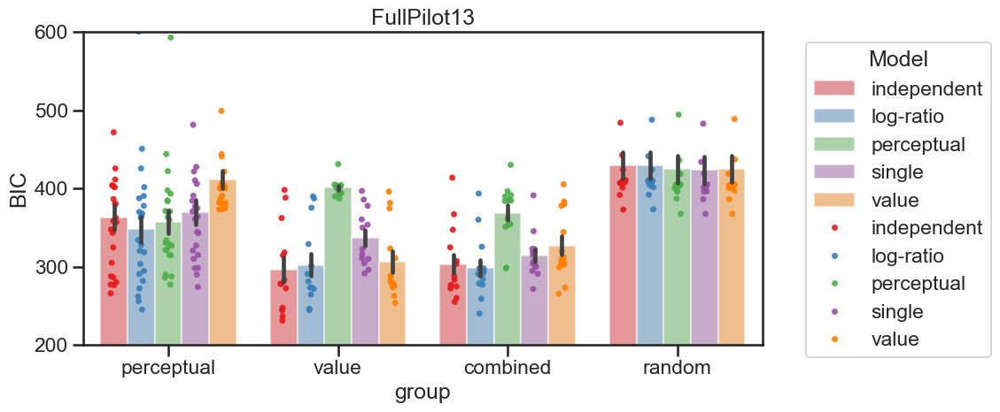

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np

# Assuming 'df' and 'dd' are your original DataFrame and Dask DataFrame
# Filter the session data
size = df[df.session.isin([0, 1, 2, 3])].groupby('prolificID').size()[0]
# Group by the necessary columns and compute first
by_pid = dd.groupby(['agent', 'model', 'expName', 'group']).ll.first().reset_index()
by_pid['n_param'] = by_pid['model'].map({'single': 1, 'log-ratio': 2, 'independent': 2, 'value': 1, 'perceptual': 1})
# by_pid['model'] = by_pid['model'].map({'single': '$1 \\beta$', 'log-ratio': '$2 \\beta$'})
# by_pid['model'] = by_pid['model'].map({'independent': 'absolute', 'single': 'single', 'log-ratio': 'log-ratio'})
# Ensure that 'll' contains negative log likelihood and compute BIC
bic = 2 * by_pid['ll'] + by_pid['n_param'] * np.log(size)

# Add BIC to the DataFrame
by_pid['BIC'] = bic

sns.set({'figure.figsize': (10*3, 5)})
sns.set_context('talk')
sns.set_palette('Set1')
sns.set_style('ticks')

count = 0
for exp in ['FullPilot13']:
    count += 1
    plt.subplot(1, 3, count)
    # Filter data for a specific experiment (e.g., 'FullPilot13') and plot
    sns.barplot(data=by_pid[by_pid.expName==exp], x='group', y='BIC', hue='model', errorbar='se', alpha=0.5,
                order=['perceptual', 'value', 'combined', 'random'], zorder=-1)
    sns.stripplot(data=by_pid[by_pid.expName==exp], x='group', y='BIC', hue='model',
                dodge=True, alpha=0.9, zorder=1, order=['perceptual', 'value', 'combined', 'random'])
    plt.ylim(200, 600)

    plt.title(exp)
    plt

# put legend outside the plot
plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')


# plt.xticks([0, 1, 2], ['all or none', 'partial rew.', 'partial destroy'])
plt.tight_layout()
#change mo

C:\Users\basil\AppData\Local\Temp\ipykernel_220\3657521248.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  size = df[df.session.isin([0, 1, 2, 3])].groupby('prolificID').size()[0]


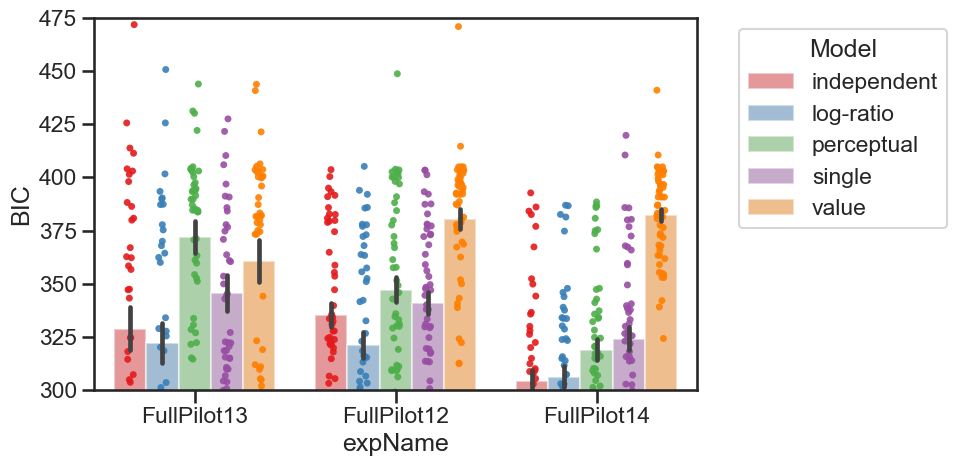

In [ ]:
size = df[df.session.isin([0, 1, 2, 3])].groupby('prolificID').size()[0]
# Group by the necessary columns and compute first

by_pid = dd[dd.group!='random'].groupby(['agent', 'model', 'expName']).ll.first().reset_index()

by_pid['n_param'] = by_pid['model'].map({'single': 1, 'log-ratio': 2, 'independent': 2, 'value': 1, 'perceptual': 1})
# by_pid['model'] = by_pid['model'].map({'single': '$1 \\beta$', 'log-ratio': '$2 \\beta$'})
# by_pid['model'] = by_pid['model'].map({'independent': 'absolute', 'single': 'single', 'log-ratio': 'log-ratio'})
# Ensure that 'll' contains negative log likelihood and compute BIC
bic = 2 * by_pid['ll'] + by_pid['n_param'] * np.log(size)
by_pid['BIC'] = bic

sns.set({'figure.figsize': (10, 5)})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set1')

# plt.subplot(1, 2, 1)
sns.barplot(data=by_pid, x='expName', y='BIC', hue='model', errorbar='se', alpha=0.5, zorder=-1)
sns.stripplot(data=by_pid, x='expName', y='BIC', hue='model', dodge=True, alpha=0.9, zorder=1)

# plt.legend().remove()


# plt.subplot(1, 2, 2)
# sns.barplot(data=by_pid, x='expName', y='ll', hue='model', errorbar='se', alpha=0.5, zorder=-1)
# sns.stripplot(data=by_pid, x='expName', y='ll', hue='model', dodge=True, alpha=0.9, zorder=1)

# plt.xticks([0, 1, 2], ['all or none', 'partial rew.', 'partial destroy'])
plt.ylim(300, 475)
# put legend outside the plot
handles, labels = plt.gca().get_legend_handles_labels()
# labels[0] = 'absolute'
plt.legend(handles=handles[:5], labels=labels[:5], title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()


In [ ]:
import pingouin as pg
by_pid['model'] = by_pid['model'].map({'single': 'single', 'log-ratio': 'log-ratio', 'independent': 'absolute'})
by_pid['expName'] = by_pid['expName'].map({'FullPilot12': 'all or none', 'FullPilot13': 'partial rew.', 'FullPilot14': 'partial destroy'})
pg.pairwise_ttests(data=by_pid, dv='BIC', within='model', between='expName', subject='agent', padjust='bonf', within_first=True).round(6)

c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


,Contrast,model,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,model,-,absolute,log-ratio,True,True,3.277813,189.000000,two-sided,0.001245,0.003735,bonf,13.967,0.079180
1,model,-,absolute,single,True,True,-5.999090,189.000000,two-sided,0.000000,0.000000,bonf,9.226e+05,-0.180010
2,model,-,log-ratio,single,True,True,-9.956210,189.000000,two-sided,0.000000,0.000000,bonf,1.003e+16,-0.266259
3,expName,-,all or none,partial destroy,False,True,2.600159,123.719025,two-sided,0.010452,0.031357,bonf,3.892,0.460464
4,expName,-,all or none,partial rew.,False,True,-0.797044,103.221700,two-sided,0.427255,1.000000,bonf,0.255,-0.140110
5,expName,-,partial destroy,partial rew.,False,True,-2.700763,103.066331,two-sided,0.008089,0.024267,bonf,4.898,-0.474510
6,model * expName,absolute,all or none,partial destroy,False,True,3.412504,123.775289,two-sided,0.000870,0.007833,bonf,32.204,0.602586
7,model * expName,absolute,all or none,partial rew.,False,True,-0.419081,99.702425,two-sided,0.676059,1.000000,bonf,0.207,-0.073590
8,model * expName,absolute,partial destroy,partial rew.,False,True,-2.852297,104.996724,two-sided,0.005228,0.047053,bonf,7.077,-0.501038
9,model * expName,log-ratio,all or none,partial destroy,False,True,1.911468,120.527940,two-sided,0.058319,0.524869,bonf,0.985,0.339833


In [ ]:
by_pid.groupby(['expName', 'model']).size()

expName      model      
FullPilot12  log-ratio      61
             single         61
FullPilot13  log-ratio      64
             single         64
FullPilot14  independent    65
             log-ratio      65
             single         65
dtype: int64

In [ ]:
pg.pairwise_ttests(data=by_pid[by_pid.expName=='FullPilot13'], dv='BIC', between='group', within='model', subject='agent', padjust='bonf', within_first=False).round(5)

# test random group with a single ttest
pg.ttest(x=by_pid[(by_pid.expName=='FullPilot13') & (by_pid.group=='random') & (by_pid.model=='$1 \\beta$')].BIC,
         y=by_pid[(by_pid.expName=='FullPilot13') & (by_pid.group=='random') & (by_pid.model=='$2 \\beta$')].BIC)

c:\Users\garciaba\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.221619,26,two-sided,0.826342,"[-65.02, 52.37]",0.083764,0.36,0.055241


In [ ]:
dd.model.unique()

array(['single', 'log-ratio'], dtype=object)

In [ ]:
dd.to_csv('../data/processed/fit_params_fullpilot12_13_14_all_models.csv', index=False)

In [ ]:
dd = pd.read_csv('../data/processed/fit_params_fullpilot13_2_models.csv')

In [ ]:
dd.loc[dd.param2=='leak', 'value'] = dd.loc[dd.param2=='leak', 'value'] / 100

In [ ]:
dd[(dd.model=='log-ratio')

57.10443988638217

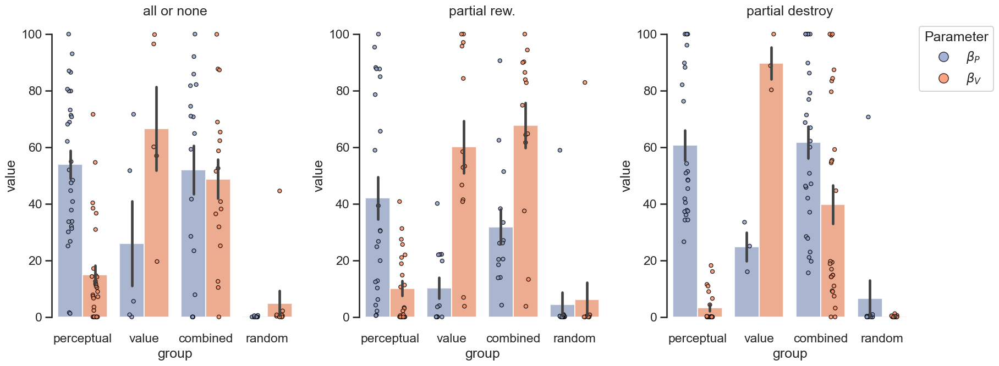

In [ ]:
sns.set({'figure.figsize': (18.5,7), 'figure.dpi': 100})

sns.set_context('talk')
sns.set_style("ticks")
# change palette must be very different from set2
palette = sns.color_palette("Set2")
# only select the first 3 colors
palette = palette[1:3][::-1]
# palette = ['grey']
palette.append('#feabf2')
sns.set_palette(palette)

count_subplot = 0
model = 'independent'

# dd['expName'] = dd.expName.map({'FullPilot12': 'all or none', 'FullPilot13': 'partial rew.', 'FullPilot14': 'partial destroy'})
# dd = dd[dd.param2!='beta_ff']
# dd.loc[dd.param=='$\\beta_V$', 'param'] = '$\\beta$'

for expName in ['FullPilot12', 'FullPilot13', 'FullPilot14']:
    count_subplot += 1
    plt.subplot(1, 3, count_subplot)
    sns.set_style("ticks")
    sns.set_context('talk')
    sns.set_palette(palette)
    order = ['perceptual', 'value', 'combined', 'random']
    sns.barplot(data=dd[(dd.expName==expName) & (dd.model == model)], x='group', y='value', hue='param',  dodge=True, alpha=.8, errorbar='se', zorder=-1, order=order)
    sns.stripplot(data=dd[(dd.expName==expName) & (dd.model == model)], x='group', y='value', hue='param', jitter=0.1,alpha=.8, dodge=True, edgecolor='black', linewidth=1, zorder=1, order=order)
    plt.ylim(-5, 105)

    handles, labels = plt.gca().get_legend_handles_labels()
    # increase the size of the markers

    plt.legend().remove()

    sns.despine(trim=True, bottom=True)
    plt.tick_params(axis='x', length=0)
    if expName=='FullPilot12':
        plt.title('all or none')
    if expName=='FullPilot13':
        plt.title('partial rew.')
    if expName=='FullPilot14':
        plt.title('partial destroy')
    # plt.title(expName)

# plt.legend(handles[2:], labels[2:], title='Parameter', loc='upper left', bbox_to_anchor=(1, 1), markerscale=2.5)
# legent horizontal position outside
plt.legend(handles=handles[2:4], labels=labels[2:4], title='Parameter', loc='upper left', bbox_to_anchor=(1, 1), markerscale=2.5)

# legend flat and horizontal


plt.tight_layout()

In [ ]:
dd[(dd.expName=='FullPilot13') & (dd.model=='independent')]

,agent,expName,group,model,value,ll,param,param2
444,66ba4608bc582e7db54007e5,FullPilot13,NaN,independent,99.997461,133.557743,$\beta_P$,beta_ff
445,66ba4608bc582e7db54007e5,FullPilot13,NaN,independent,99.997461,133.557743,$\beta_V$,beta_ss
446,66ba4608bc582e7db54007e5,FullPilot13,NaN,independent,0.999975,133.557743,$\lambda$,leak
447,615e5b5f1e8fbfe2c701bc8e,FullPilot13,NaN,independent,33.314478,124.594468,$\beta_P$,beta_ff
448,615e5b5f1e8fbfe2c701bc8e,FullPilot13,NaN,independent,99.999983,124.594468,$\beta_V$,beta_ss
...,...,...,...,...,...,...,...,...
724,63197f9b80d9c0d22597a837,FullPilot13,NaN,independent,8.813329,121.646508,$\beta_V$,beta_ss
725,63197f9b80d9c0d22597a837,FullPilot13,NaN,independent,0.932019,121.646508,$\lambda$,leak
735,661571d6cc16ee34676734df,FullPilot13,NaN,independent,97.745146,111.920104,$\beta_P$,beta_ff
736,661571d6cc16ee34676734df,FullPilot13,NaN,independent,71.192182,111.920104,$\beta_V$,beta_ss


In [ ]:
df['opti_ev'] = ((df.choice==1) & (df.ev1 > df.ev2)) | ((df.choice==2) & (df.ev2 > df.ev1))

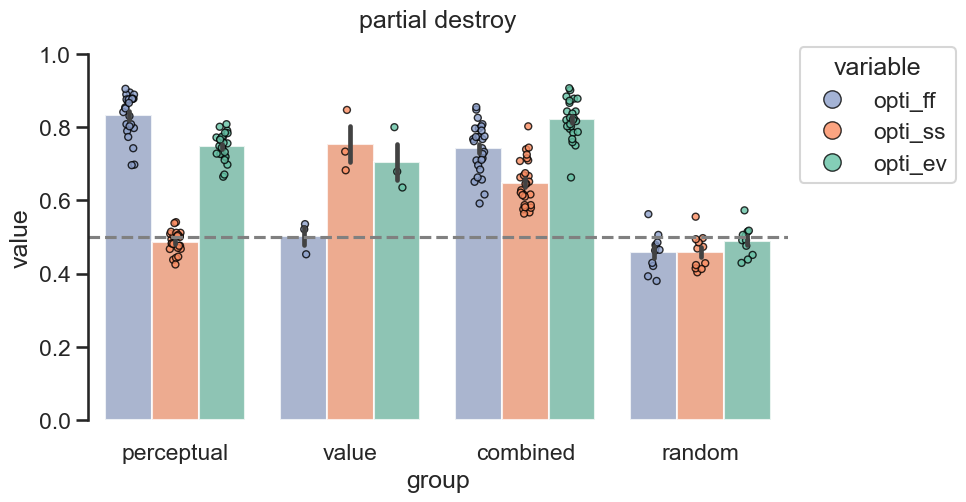

In [ ]:
sns.set({'figure.figsize': (10, 14.5), 'figure.dpi': 100})

sns.set_context('talk')
sns.set_style("ticks")
# change palette must be very different from set2
palette = sns.color_palette("Set2")
# only select the first 3 colors
palette = palette[1:3][::-1]
# palette = ['grey']
palette.append('#feabf2')
sns.set_palette(palette)

count_subplot = 0
model = 'independent'

# dd['expName'] = dd.expName.map({'FullPilot12': 'all or none', 'FullPilot13': 'partial rew.', 'FullPilot14': 'partial destroy'})
# dd = dd[dd.param2!='beta_ff']
# dd.loc[dd.param=='$\\beta_V$', 'param'] = '$\\beta$'

# melt to have a opti and value column, where opti = ff, ss, ev and value = value
df3 = df[df.expName.isin(['FullPilot14']) & (df.session==3)].groupby(['agent', 'group'], as_index=False).mean(numeric_only=True)
# df3 = df.melt(id_vars=['agent', 'group'], value_vars=['opti_ff', 'opti_ss', 'opti_ev'], var_name='opti', value_name='value')
# df3 = df3.groupby(['agent', 'group'], as_index=False).mean(numeric_only=True).reset_index()
df3 = pd.melt(df3,
                   id_vars=['agent', 'group'], value_vars=['opti_ff', 'opti_ss', 'opti_ev'], var_name='opti', value_name='value')

# df3 = df3.groupby(['agent', 'group', 'opti'], as_index=False).value.mean().reset_index()
palette = sns.color_palette("Set2")
palette = palette[0:3][::-1]
for expName in ['FullPilot14']:
    count_subplot += 1
    plt.subplot(3, 1, count_subplot)
    sns.set_style("ticks")
    sns.set_context('talk')
    sns.set_palette(palette)
    order = ['perceptual', 'value', 'combined', 'random']
    sns.barplot(data=df3, x='group', y='value', hue='opti',  dodge=True, alpha=.8, errorbar='se', zorder=-1, order=order)
    sns.stripplot(data=df3, x='group', y='value', hue='opti', jitter=0.1,alpha=.8, dodge=True, edgecolor='black', linewidth=1, zorder=1, order=order)
    plt.ylim(-.05, 1.05)

    handles, labels = plt.gca().get_legend_handles_labels()
    # increase the size of the markers


    plt.legend(handles[3:], labels[3:], title='variable', loc='upper left', bbox_to_anchor=(1, 1), markerscale=2.5)
    sns.despine(trim=True, bottom=True)
    plt.tick_params(axis='x', length=0)
    # hline
    plt.axhline(0.5, color='grey', linestyle='--')
    

    if expName=='FullPilot12':
        plt.title('all or none')
    if expName=='FullPilot13':
        plt.title('partial rew.')
    if expName=='FullPilot14':
        plt.title('partial destroy')

plt.tight_layout()

In [ ]:
df3

,index,agent,group
0,0,57d810f1813eb30001825b65,combined
1,1,5c989ea4c7f75b0001677fa8,combined
2,2,5d23ac815173fe001528bcd6,random
3,3,5ddb5ed4a64380abb2907440,combined
4,4,5de7d12c26dd95000b6824c5,combined
...,...,...,...
60,60,675efe6044b2f5bde425ceac,perceptual
61,61,67603ec6f369599a362eecb9,combined
62,62,67628f7b4f57e91918c49e72,perceptual
63,63,677a58735c4ac72aaffc95a7,random


[  0.  50. 100. 150.]


C:\Users\garciaba\AppData\Local\Temp\ipykernel_32000\2125915897.py:18: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.5`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(y=y, x='expName', hue=hue, zorder=-1, data=df, alpha=.6, linecolor='w', bw=0.5, gap=.1, split=True,
C:\Users\garciaba\AppData\Local\Temp\ipykernel_32000\2125915897.py:20: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 68)` for the same effect.

  ax=sns.pointplot(y=y, x='expName', hue=hue, zorder=2, data=df, dodge=True, ci=68, estimator=np.mean, markers='o', scale=1.3, color='black')
C:\Users\garciaba\AppData\Local\Temp\ipykernel_32000\2125915897.py:20: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  ax=sns.pointplot(y=y, x='expName', hue=hue, zorder=

([<matplotlib.axis.YTick at 0x203f79e7be0>,
 [Text(0, 0.0, '0'),
  Text(0, 50.0, '50'),
  Text(0, 100.0, '100'),
  Text(0, 150.0, '150')])

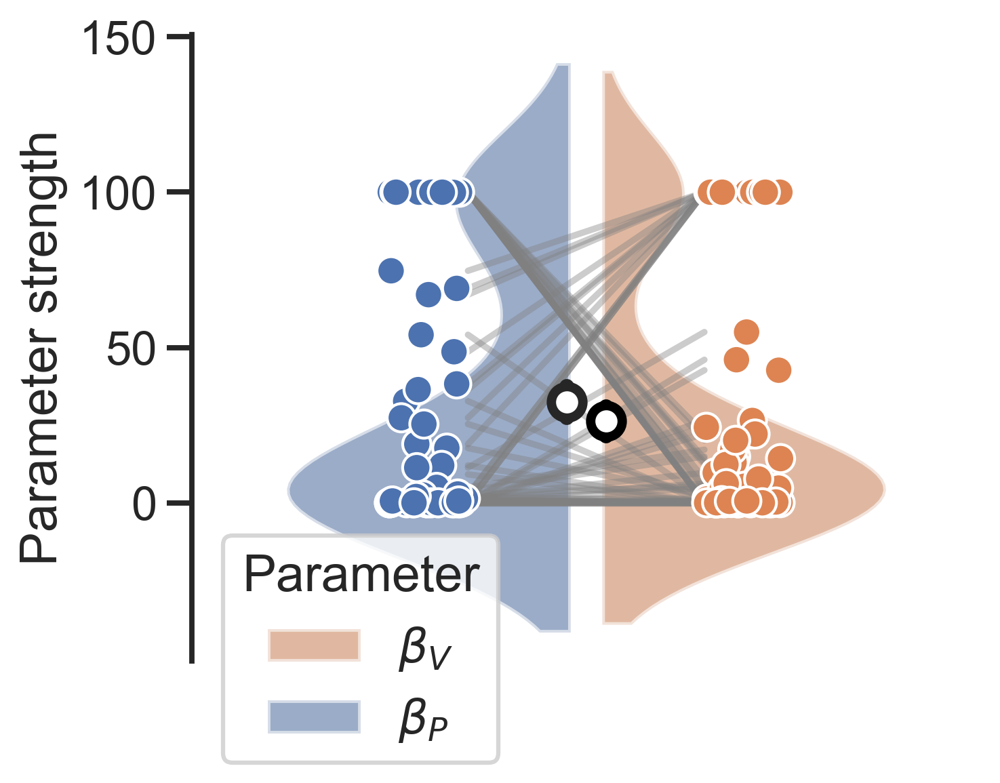

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set(rc={'figure.figsize':(5, 4), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', hue='param', df=None):
    sns.violinplot(y=y, x='expName', hue=hue, zorder=-1, data=df, alpha=.6, linecolor='w', bw=0.5, gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C0', 'C1'], inner=None)
    ax=sns.pointplot(y=y, x='expName', hue=hue, zorder=2, data=df, dodge=True, ci=68, estimator=np.mean, markers='o', scale=1.3, color='black')
    m1 = df[df.param=='$\\beta_P$'].groupby('expName').mean(numeric_only=True).reset_index()
    m2 = df[df.param=='$\\beta_V$'].groupby('expName').mean(numeric_only=True).reset_index()
    # get x positon of the pointplot

    plt.scatter([-.025], m1.value, zorder=3, s=40, color='white')
    plt.scatter([.025], m2.value, zorder=3, s=40, color='white')
    ax = sns.stripplot(y=y, x='expName', hue=hue, zorder=1, size=10, 
                    data=df,dodge=True, edgecolor='white', linewidth=1, palette=['C0', 'C1'])
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    # trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    trace_lines_between_dots(y=y, df=df)
    # plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
def get_x_from_y(y_value, ax, i):
    # Get the PathCollection (which contains the points' positions)
    collection = ax.collections[0]
    paths = collection.get_offsets()

    # Convert to a numpy array of points (x, y)
    points = np.array(paths)
    # Find the index of the closest point in terms of y value
    idx = (np.abs(points[:, 1] - y_value)).argmin()
    # Return the corresponding x value
    return points[idx, 0]      

# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(y='opti_ss', ax=None, df=None):
    p1, p2 = df.param.unique()
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df[df.expName==expname].agent.unique()):
            d1 = df[(df.agent==name) & (df.expName==expname) & (df.param==p1)]['value']
            assert len(d1) == 1
            d2 = df[(df.agent==name) & (df.expName==expname) & (df.param==p2)]['value']
            assert len(d2) == 1
            # d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            # y3 = d3.values[0]
            if ax:
                #this is the scatterplot ax
                # get the x position of the dot using y1, y2, y3
                # Function to find the x value corresponding to a given y value
                x1 = get_x_from_y(y1, ax, i)
                x2 = get_x_from_y(y2, ax, i)
                x3 = get_x_from_y(y3, ax, i)      
                plt.plot([x1, x2, x3], [y1, y2, y3], 'grey', alpha=.4)
                continue
                
            plt.plot([j-.15, j+.15], [y1, y2], 'grey', alpha=.4, zorder=-1)


# plt.subplot(1, 3, 1)
sns.set(rc={'figure.figsize':(5, 4), 'figure.dpi':300})

sns.set_context('talk')
sns.set_style('ticks')

#plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
# plt.plot([-0.5, 0.5], [0.5, 0.5], 'k--', alpha=0.5) 
dd = pd.read_csv('../data/processed/fit_params_fullpilot13.csv')
plot(y='value', df=dd)
plt.ylabel('Parameter strength')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
# plt.legend(handles[0:3], ['spaceship', 'shield', 'optimal ev'], title='', loc='lower center', fontsize=12, title_fontsize=12)
# handle size
plt.xlabel('')

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
# plt.xticks([0], ['session 1'])
param = dd.param.unique()
plt.legend(handles[:2][::-1], param[::-1], title='Parameter', bbox_to_anchor=(.01, -0.2), loc='lower left')
print(yticks)
plt.yticks(yticks)
# plt.legend().remove()

In [ ]:
from scipy.stats import ttest_rel
ttest_rel(dd[dd.param=='$\\beta_P$'].value, dd[dd.param=='$\\beta_V$'].value)

TtestResult(statistic=0.8273182851428539, pvalue=0.4111794748546158, df=63)

In [ ]:
# make a dataframe with the fitted values that are arrays of length 2 in a dic then convert to a dataframe
ddd = []
norm = lambda x: (x - x.min()) / (x.max() - x.min())
for agent, value in xopt.items():
    if agent not in df.prolificID.values:
        continue
    delta = value[0] - value[1]
    ddd.append({
        'agent': agent,
        'expName': df[df.prolificID==agent].expName.values[0],
        # 'model': 'NormativeEV',
        'opti_ff': value[0],
        'opti_ss': value[1],
    })
    
ddd = pd.DataFrame(ddd)

ddd['opti_ff'] = norm(ddd.opti_ff)
ddd['opti_ss'] = norm(ddd.opti_ss)
ddd['delta'] = ddd.opti_ff - ddd.opti_ss

# ddd['group'] = ddd.apply(lambda x:'perceptual' if x.delta > 0.1 else 'value' if x.delta < -0.1 else 'combined', axis=1)
ddd['group'] = None
ddd.to_csv('../data/processed/fitting_FullPilot12.csv', index=False)


In [ ]:
group_df = pd.read_csv('../data/processed/df_fullpilot12.csv')

# set group from group_df to ddd using prolificID and agent columns
ddd['group'] = ddd.apply(lambda x: group_df[group_df.prolificID==x.agent].group.values[0], axis=1)

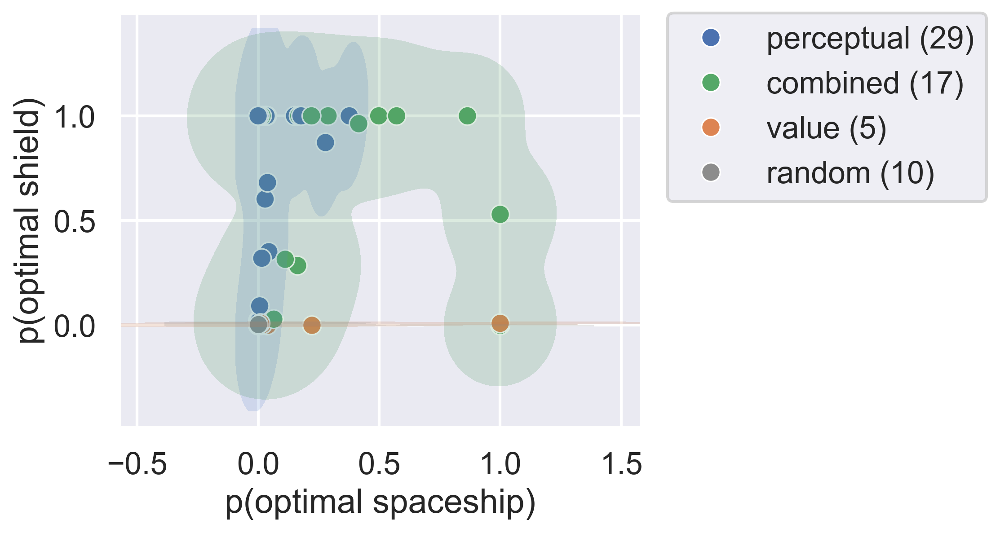

In [ ]:
# same but with scatterplot
sns.set(rc={'figure.figsize':(5,4)})
sns.set_context("talk")
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

# Function to create hand-drawn-like regions
def draw_handdrawn_region(center, hue, ax, radius=0.09, irregularity=0.004):
    # Generate random points around the center
    center = (center[0].mean(), center[1].mean())

    angles = np.linspace(0, 2 * np.pi, 20)
    # make it elliptical
    radius_x = radius - (radius/2)
    radius_y = radius + (radius/2)
    x_offsets = radius_x * np.cos(angles) + np.random.randn(20) * irregularity
    y_offsets = radius_y * np.sin(angles) + np.random.randn(20) * irregularity
    region_x = center[0] + x_offsets
    region_y = center[1] + y_offsets
    
    # clip the region to the axes boundaries in order to get oval shapes instead of circles
    # use max to cut off like 30% of the region

    # Fill the hand-drawn region with alpha
    ax.fill(region_x, region_y, color=hue, alpha=0.2, linewidth=0, zorder=2)

def draw_contour_region(center, hue, ax, radius=0.07):
    # Create a grid of points around the center
    x = np.linspace(center[0] - radius, center[0] + radius, 100)
    y = np.linspace(center[1] - radius, center[1] + radius, 100)
    X, Y = np.meshgrid(x, y)
    
    # Create a multivariate normal distribution for contour
    pos = np.dstack((X, Y))
    rv = multivariate_normal([center[0], center[1]], [[radius, 0], [0, radius]])
    Z = rv.pdf(pos)
    
    # Plot contourf for filled contours
    ax.contourf(X, Y, Z, levels=2, colors=hue, alpha=0.2)


df_ = ddd

# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)
scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C0', 'C2', 'C1', 'C7'], s=100)

# hightlight the clusters
# plt.axvline(0.5, color='gray', linestyle='--', alpha=0.2)
# plt.axhline(0.5, color='gray', linestyle='--', alpha=0.2)

# hightlight the clusters
# using seaborn, we want a region of interest using the colors of the clusters in scatterplot
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points

# change legend labels to add N=xx
handles, labels = plt.gca().get_legend_handles_labels()
labels = [f'{label} ({len(df_[df_.group==label])})' for label in labels]
plt.legend(handles, labels, bbox_to_anchor=(1.05, 1)
           , loc=2, borderaxespad=0.)
data = df_
data['hue'] = data['group']
data['x'] = data['opti_ss']
data['y'] = data['opti_ff']
for hue_value in data['hue'].unique():
    
    subset = data[data['hue'] == hue_value]
    # For small groups, draw manual circles
    if len(subset) <= 2:
             # For small groups, draw hand-drawn regions
        draw_handdrawn_region((subset['x'], subset['y']), 'C2', plt.gca())
            


# add a third dimension (opti_ev)
# plt.ylim(0.3, 1)
# plt.xlim(0.3, 1)
plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal shield)')
# put legend outside
N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')

#no legend
# plt.legend().remove()

C:\Users\basil\AppData\Local\Temp\ipykernel_21068\967022716.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='count', palette=['C0', 'C1', 'C2'])


ValueError: nan is not in list

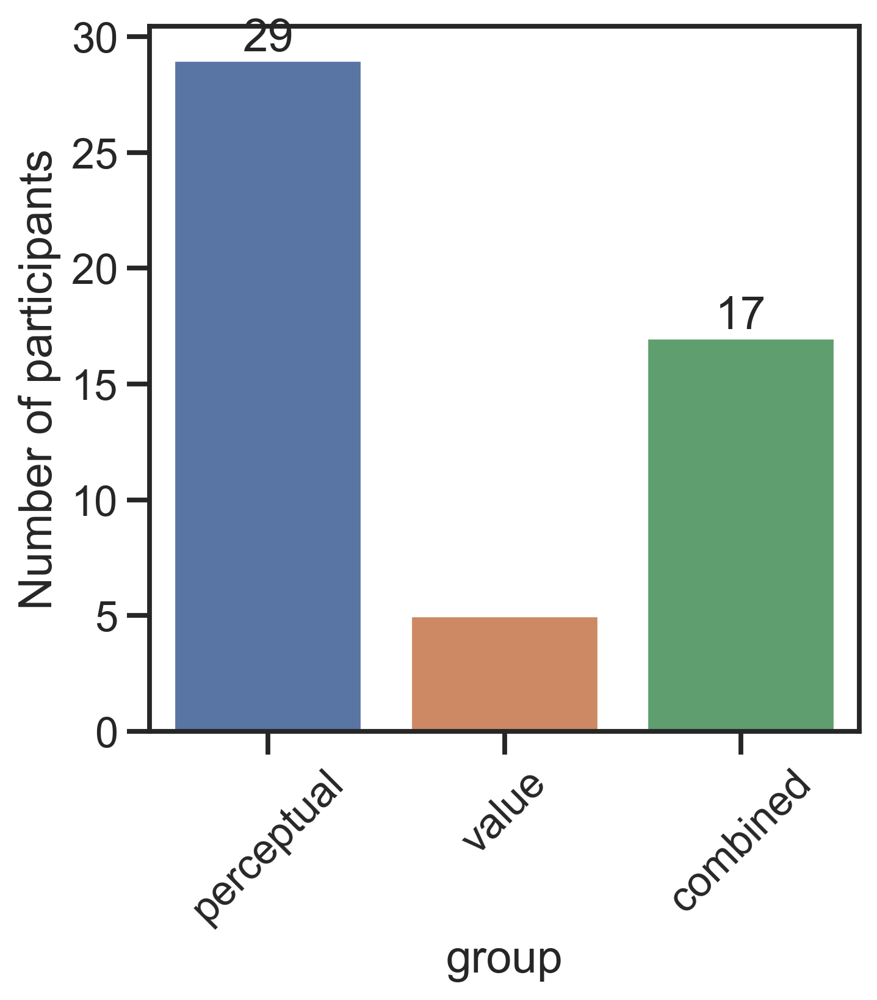

In [ ]:
import matplotlib.pyplot as plt
# plot group distribution
sns.set(rc={'figure.figsize':(5,5)})
sns.set_style("ticks")
sns.set_context('talk')
# create new df with count of participants in each group
df_ = ddd.groupby(['group']).size().reset_index(name='count')
order = ['perceptual', 'value', 'combined']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)
# sort by count
df_ = df_.sort_values('count', ascending=False)
sns.barplot(data=df_, x='group', y='count', palette=['C0', 'C1', 'C2'])
plt.xticks(rotation=45)
plt.ylabel('Number of participants')

# annotate with count of participants
# order is 1=perceptual, 2=balanced, 3=value
for i, row in df_.iterrows():
    order_idx = order.index(row['group'])
    # plt.text(order_idx, row['count'], row['count'], ha='center')
    # annotate with count of participants
    # for each hue, so 6 annotations, 2 for each hue
    plt.text(order_idx, row['count'], row['count'], ha='center', va='bottom')
    # the above is centered, we want to offset to left and right according to hue, so 
    # if i % 2 == 0, then offset to the left, else offset to the right
    # offset = -0.2 if i % 2 == 0 else 0.2
    # plt.text(order_idx + offset, row['count'], row['count'], ha='center', va='bottom')

sns.despine(trim=True)

In [ ]:
# print likelihood function
# -----------------------------------------------------------------
# parameters to tune
import itertools
from pybads import BADS
import scipy.optimize as opt
from tqdm.notebook import tqdm
# timeit

pbar = tqdm(total=len(df.agent.unique()))

#install IPyWidgets

# space = np.arange(0, 100, 5)
space = np.linspace(0, 20, 20)
space_all = np.array(list(itertools.product(space, repeat=2)))
# import pyfmincon.opt
# pyfmincon.opt.connect()
d = []

xopt = {}
for agent in df.agent.unique():
    df2 = df[df.agent==agent]
    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    destroy = df2.destroy.values
    ntrials = df2.shape[0]

    # xopt, fopt, fn1 = minimize(
        # f=fit,
        # args=(ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()), space=space)
    
    # ...
    def target(x):
        return fit_pwf(x, *(ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()))[0]

    lower_bounds = np.array([-10, -10])
    upper_bounds = np.array([10, 10])
    plausible_lower_bounds = np.array([1.0, 1.0])
    plausible_upper_bounds = np.array([5., 5.])
    # Starting point
    x0 = np.array([0, 0]);        

    bads = BADS(
        target,
        x0=x0[:1],
        lower_bounds=lower_bounds[:1],
        upper_bounds=upper_bounds[:1],
        # plausible_lower_bounds=plausible_lower_bounds[:1],
        # plausible_upper_bounds=plausible_upper_bounds[:1],
        options={'display': 'off'}
    )
    
    # xopt[agent] = opt.minimize(target, x0[:1], bounds=[(-10, 10)]).x[0]

    optimize_result = bads.optimize()
    
    xopt[agent] = optimize_result.x[0]
    continue

    # d.append({
        # 'agent': agent,
        # 'model': 'NormativeEV',
        # 'param': 'temp',
        # 'value': xopt
    # })

    # for i in range(len(fn1)):
    #     d.append({
    #         'agent': agent,
    #         'model': 'NormativeEV',
    #         # 'original_model': df2.model.values[0],
    #         'fn': fn1[i],
    #         'space': space[i],
    #     }) 

    xopt, fopt, params, fn2 = minimize(
        f=fit,
        args=(ntrials, s, a, r, destroy, ff1, ff2, map_ff_values.values()), space=space_all)
    # # print(xopt)
    d.append({
        'agent': agent,
        'model': 'NormativeLogRatio',
        'param': 'rl_temp',
        'value': xopt[1],
        'params': params
    })
    
    # d.append({
    #     'agent': agent,
    #     'model': 'NormativeLogRatio',
    #     'param': 'perceptual_temp',
    #     'value': xopt[0],
    #     'params': params
    # })
    # # print(res)
    """ for i in range(len(fn2)):
        d.append({
            'agent': agent,
            'model': 'NormativeLogRatio',
            # 'original_model': df2.model.values[0],
            'fn': fn2[i],
          'param': 'rl_temp',
          'value': space_all[i][1]
        }) 
        d.append({
            'agent': agent,
            'model': 'NormativeLogRatio',
            'fn': fn2[i],
            'param': 'perceptual_temp',
            'value': space_all[i][0]
        })
 """
    pbar.update()


d = pd.DataFrame(d)
pbar.refresh()


  0%|          | 0/5 [00:00<?, ?it/s]

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.


True

{'5dd4767b32288646716dc98a': 9.9994921875, '5cfb82a12bcca70018252f81': 9.999949035644532, '63316daa57747115376760da': 9.9994921875, '650ee274aa4447ac435b7830': 9.999949035644532, '5c5ac2869d974300015d81fc': 9.9994921875}


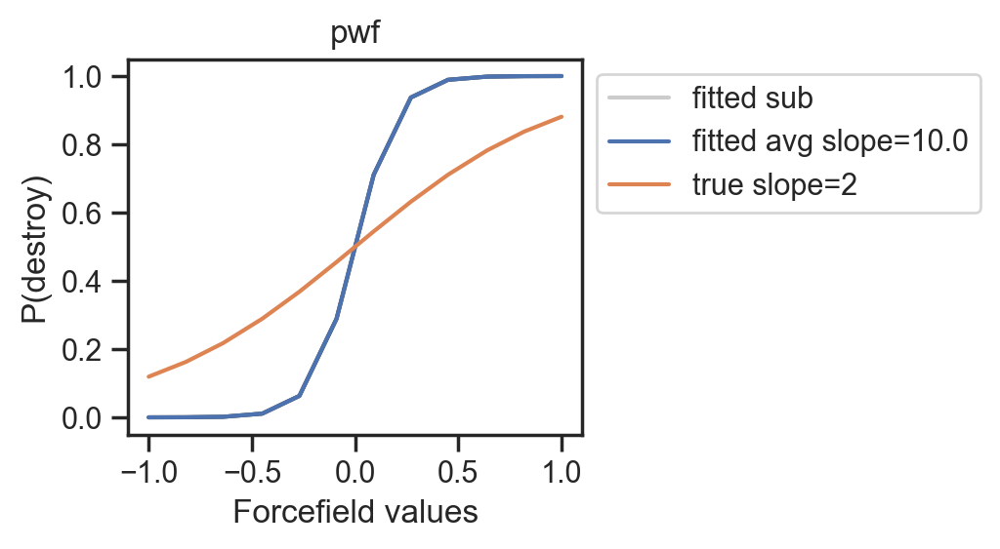

In [ ]:
# display function with slope = mean(xopt)
import matplotlib.pyplot as plt

logistic = lambda slope, x: 1/(1+np.exp(-slope*x))
x = np.linspace(-1, 1, 12).round(2)
slope = np.mean(list(xopt.values())).round(2)
# slope = xopt['5610c4ea7ffc8a0005811504']

sns.set({'figure.figsize': (3, 2.5), 'figure.dpi': 200})
sns.set_style('ticks')

ax = plt.gca()
for agent, value in xopt.items():
    ax.plot(x, logistic(value, x), alpha=.2, color='black', label='fitted sub')
ax.plot(x, logistic(slope, x), label=f'fitted avg slope={slope}', color='C0')
# plot true slope = 2
ax.plot(x, logistic(2, x), label='true slope=2', color='C1')
ax.set_xlabel('Forcefield values')
ax.set_ylabel('P(destroy)')
ax.set_title('pwf')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
# keep only last three for legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[-3:], labels[-3:], loc='upper left', bbox_to_anchor=(1, 1))
# loc of legend outside plot
print(xopt)

In [ ]:
df[df.prolificID=='5c5ac2869d974300015d81fc'].correct.mean()

0.75

In [ ]:
import scipy.optimize as opt
# i have probabilities (y)
# i need to find the x values that correspond to these probabilities
# i.e. the x values that give me the y values through the logistic function
# and find the slope that minimizes the difference between the x values and the forcefield values

x = np.unique([df.ff1.values, df.ff2.values])
y = np.unique([df.p1.values, df.p2.values])

def f(slope, x, y):
    return np.sum(np.abs(logistic(slope, x) - y))
    
opt.minimize(f, 0, args=(x, y))


  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 0.01120414741166574
        x: [ 1.992e+00]
      nit: 5
      jac: [ 2.373e-02]
 hess_inv: [[ 3.238e-03]]
     nfev: 166
     njev: 77

In [ ]:
sns.set({'figure.figsize': (1, 2.5), 'figure.dpi': 200})
sns.set_style('ticks')

sns.boxplot(x='param', y='value', data=d)
# sns.stripplot(x='param', y='value', data=d,alpha=.9, palette='Set2')

ValueError: Could not interpret value `param` for `x`. An entry with this name does not appear in `data`.

IndexError: index -1 is out of bounds for axis 0 with size 0

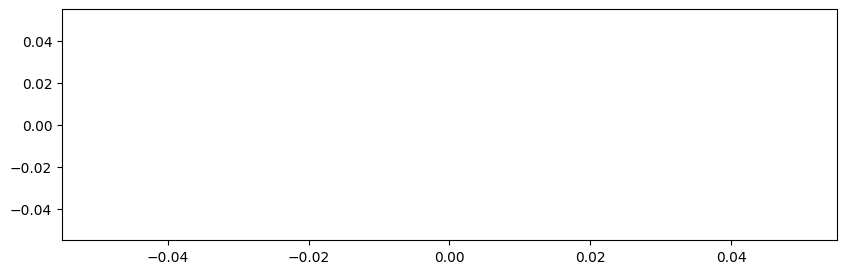

In [ ]:
#plot heatmap of liklihood (fn) for each parameter value (space)
dd = d[d.model=='NormativeEV']
plt.figure(figsize=(10, 3), dpi=100)
sns.lineplot(x='space', y='fn', data=dd, n_boot=0)
plt.ylabel('log likelihood')
plt.xlabel('$\\beta$')
plt.xticks(space)

# plt.xticks(space)


array([1.05263158, 8.42105263])

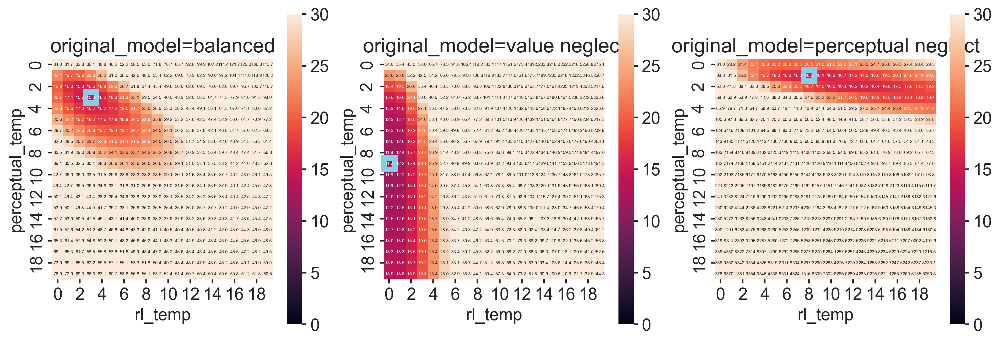

In [ ]:
# plot heatmap of liklihood (fn) for each parameter value (space)
dd = d[(d.model=='NormativeLogRatio') & (d.original_model!='random')]
plt.figure(figsize=(15, 5), dpi=300)
count = 0
for model in dd.original_model.unique():
    count += 1
    ddd = dd[dd.original_model==model].pivot(index='perceptual_temp', columns='rl_temp', values='fn')
    # change index and columns to int
    ddd.columns = ddd.columns.astype(int)
    ddd.index = ddd.index.astype(int)
    # xy = ddd.space.values
    # stack xy as a 2d array
    # xy = np.vstack(xy)
    # z = ddd.fn.values

    # plot heatmap
    plt.subplot(1, len(dd.original_model.unique()), count)
    # rs = len(space)
    
    plt.title(f'original_model={model}')
    ax = sns.heatmap(ddd,square=True, annot=True, annot_kws={"size": 4}, fmt='.1f', vmax=30, vmin=0)
    d_ = np.asarray(ddd)
    y,x = np.unravel_index(d_.argmin(), d_.shape)
    ax.add_patch(plt.Rectangle((x, y), 1, 1, fc='none', ec='skyblue', lw=5, clip_on=False))


space_all[np.argmin(ddd)]

In [ ]:
# manual fit
# -----------------------------------------------------------------
# parameters to tune
import itertools

pbar = tqdm(total=len(df.agent.unique()))
space = np.concatenate([np.linspace(0, 10, 10), np.linspace(10, 50, 5)]).flatten().round(1)
print(space)
space_all = np.array(list(itertools.product(space, repeat=2)))

# import pyfmincon.opt
# pyfmincon.opt.connect()
d = []

for agent in df.agent.unique():

    df2 = df[(df.agent==agent)]
    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    destroy = df2.destroy.values
    ntrials = int(df2.trial.max())

    xopt, fopt = minimize(
        f=fit,
        args=(ntrials, s, a, r, destroy, ff1, ff2), nparam=1, space=space)
    
    d.append({
            'agent': agent,
            'model': 'NormativeEV',
            'original_model': df2['model'].values[0],
            'll': fopt,
            'fitted_temp': float(xopt),
            'temp': df2['temp'].values[0],
    })

    xopt, fopt = minimize(
        f=fit,
        args=(ntrials, s, a, r, destroy, ff1, ff2), nparam=2, space=space_all)
    # print(res)
    d.append({
        'agent' : agent,
        'model': 'NormativeLogRatio',
        'original_model': df2['model'].values[0],
        'll': fopt,
        'fitted_rl_temp': xopt[1],
        'fitted_perceptual_temp': xopt[0],
        'rl_temp': df2['rl_temp'].values[0],
        'perceptual_temp': df2['perceptual_temp'].values[0],
    })

    pbar.update()

pbar.refresh()

d = pd.DataFrame(d)


  0%|          | 0/50 [00:00<?, ?it/s]

[ 0.   1.1  2.2  3.3  4.4  5.6  6.7  7.8  8.9 10.  10.  20.  30.  40.
 50. ]


C:\Users\basil\AppData\Local\Temp\ipykernel_10288\3873129865.py:24: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  ff_chosen = [ff1[t], ff2[t]][a[t]]
C:\Users\basil\AppData\Local\Temp\ipykernel_10288\3874629961.py:287: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  if p[a] == 0:
C:\Users\basil\AppData\Local\Temp\ipykernel_10288\3874629961.py:289: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return p[a]
C:\Users\basil\AppData\Local\Temp\ipykernel_10288\3874629961.py:326: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  if p[a] == 0:
C:\Users\basil\AppData\Local\Temp\ipykernel_10288\3874629961.py:329: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return p[a]
C:\Users\basil\AppData\Local\Temp\ipyke

In [ ]:
# parameter retrieval
import scipy.optimize as opt
# import fit


models = (NormativeLogRatio, )
pbar = tqdm(total=len(df.agent.unique()))
method = 'scipy'
ub = [100]
lb = [.001]
x0 = np.mean([ub, lb], axis=0).tolist()

import pyfmincon.opt
pyfmincon.opt.connect()
d = []


for agent in df.agent.unique():

    df2 = df[(df.agent==agent)]
    s, a, r = df2.s.values, df2.a.values, df2.r.values
    ff1, ff2 = df2.ff1.values, df2.ff2.values
    destroy = df2.destroy.values
    ntrials = int(df2.trial.max())

    # if method == 'matlab':
    #     x = pyfmincon.opt.fmincon(
    #             function='fit.fit',
    #             x0=x0,
    #             optional_args=[ntrials, s, a.astype(int), r, destroy.astype(int), ff1, ff2],
    #             lb=lb,
    #             ub=ub,
    #             options={}
    #     )
    #     xopt = x[0]
    #     fopt = x[1]


    # if method == 'scipy':
    #     res = opt.minimize(
    #         fit,
    #         x0,
    #         args=(ntrials, s, a, r, destroy, ff1, ff2), method='L-BFGS-B',
    #         bounds=[(0, 10)])
    #     # xopt, fopt = matlab.fmincon(
    #     xopt = res.x[0]
    #     fopt = res.fun

    # d.append({
    #     'agent': agent,
    #     'model': 'NormativeEV',
    #     'original_model': df2['model'].values[0],
    #     'll': fopt,
    #     'fitted_temp': float(xopt),
    #     'temp': df2['temp'].values[0],
    # })

    if method == 'matlab':
        x = pyfmincon.opt.fmincon(
                function='fit.fit2',
                x0=x0 * 2,
                # optional_args=[ntrials, s, a.astype(int), r, destroy.astype(int), ff1, ff2],
                optional_args=[ntrials, s],
                lb=lb * 2,
                ub=ub * 2,
                options={}
        )
        xopt = x[0]
        fopt = x[1]

    if method == 'scipy':
        res = opt.minimize(
            fit,
            x0 * 2,
            args=(ntrials, s, a, r, destroy, ff1, ff2), method='L-BFGS-B',
            bounds=[(0, 30), (0, 30)], options=dict(ftol=1e-8))
        
        xopt = res.x
        fopt = res.fun

    # print(res)
    d.append({
        'agent' : agent,
        'model': 'NormativeLogRatio',
        'original_model': df2['model'].values[0],
        'll': fopt,
        'fitted_rl_temp': xopt[1],
        'fitted_perceptual_temp': xopt[0],
        'rl_temp': df2['rl_temp'].values[0],
        'perceptual_temp': df2['perceptual_temp'].values[0],
    })

    pbar.update()

pbar.refresh()

d = pd.DataFrame(d)
d.to_csv('data/fit.csv', index=False)

  0%|          | 0/400 [00:00<?, ?it/s]

             T  dof alternative     p-val          CI95%   cohen-d     BF10  \
T-test -4.5985   58   two-sided  0.000024  [-11.7, -4.6]  1.187328  788.479   

           power  
T-test  0.994784  
               T  dof alternative         p-val          CI95%   cohen-d  \
T-test  5.637197   58   two-sided  5.358005e-07  [7.14, 14.99]  1.455518   

             BF10     power  
T-test  2.355e+04  0.999829  


SyntaxError: 'return' outside function (3859054300.py, line 96)

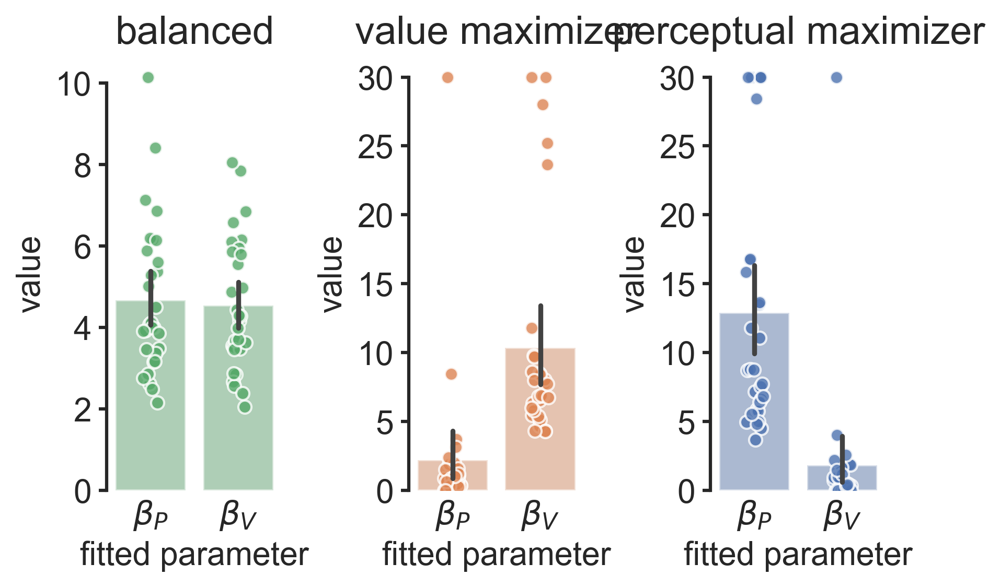

In [ ]:
# select 30 perceptual neglect
d = pd.read_csv('data/fit.csv')
np.random.seed(1)
n = 30
d1 = d[(d.model=='NormativeLogRatio') & (d.original_model=='perceptual neglect')].sample(n=n)
assert len(d1.agent.unique()) == n
d2 = d[(d.model=='NormativeLogRatio') & (d.original_model=='value neglect')].sample(n=n)
assert len(d2.agent.unique()) == n
d3 = d[(d.model=='NormativeLogRatio') & (d.original_model=='balanced')].sample(n=n)
assert len(d3.agent.unique()) == n
d4 = d[(d.model=='NormativeLogRatio') & (d.original_model=='random')].sample(n=n)
assert len(d3.agent.unique()) == n



models = [d1, d2, d3, d4]

# d_full = pd.DataFrame()
# d_full['parameter'] = ['perceptual_temp', ] * n
# d_full['value'] = d1.
d_full = pd.concat(models)
length = len(d_full)
dfull = pd.DataFrame()
dfull['parameter'] = ['$\\beta_P$', ] * length + ['$\\beta_V$', ] * length
dfull['value'] = d_full['fitted_perceptual_temp'].tolist() + d_full['fitted_rl_temp'].tolist()
dfull['model'] = d_full['original_model'].tolist() * 2

# remove outliers using stats zscore
from scipy import stats
dfull['z'] = np.abs(stats.zscore(dfull['value']))
# dfull = dfull[dfull.z < 3]


plt.rcParams['figure.figsize'] = (6, 4)
plt.rcParams['figure.dpi'] = 300
# increase axes width
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
# increase font size
plt.rcParams.update({'font.size': 15})
sns.set_palette('deep')
palette = ['C2', 'C0', 'C1', 'grey']
sns.set_palette(palette=palette)

dfull1 = dfull[dfull.model=='balanced']
plt.subplot(1, 3, 1)
sns.barplot(x='parameter', y='value', data=dfull1, zorder=0, color='C0', alpha=.5)
sns.stripplot(x='parameter', y='value', data=dfull1,alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, color='C0')
plt.ylabel('value')
plt.xlabel('fitted parameter')
plt.title('balanced')
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)

dfull2 = dfull[dfull.model=='value neglect']
plt.subplot(1, 3, 3)
sns.barplot(x='parameter', y='value', data=dfull2, zorder=0, color='C1', alpha=.5)
sns.stripplot(x='parameter', y='value', data=dfull2,alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, color='C1')
plt.ylabel('value')
plt.xlabel('fitted parameter')
plt.title('perceptual maximizer')
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)


dfull3 = dfull[dfull.model=='perceptual neglect']
plt.subplot(1, 3, 2)
sns.barplot(x='parameter', y='value', data=dfull3, zorder=0, color='C2', alpha=.5)
sns.stripplot(x='parameter', y='value', data=dfull3,alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, color='C2')
plt.ylabel('value')
plt.xlabel('fitted parameter')
plt.title('value maximizer')
sns.despine(trim=True, bottom=True)
plt.tick_params(axis='x', length=0)



plt.tight_layout()	
# plt.tick_params(axis='x', labelsize=8.5)
x1 = d_full[d_full.original_model=='perceptual neglect'].fitted_perceptual_temp
y1 = d_full[d_full.original_model=='value neglect'].fitted_perceptual_temp

x2 = d_full[d_full.original_model=='perceptual neglect'].fitted_rl_temp
y2 = d_full[d_full.original_model=='value neglect'].fitted_rl_temp

import pingouin as pg
print(pg.ttest(x1, x2))
print(pg.ttest(y1, y2))

plt.savefig('figs/result2.svg')

return

plt.subplot(1, 2, 2)
sns.barplot(x='original_model', y='fitted_rl_temp', data=dfull, alpha=.5, zorder=0, palette=['C2', 'C1'])
sns.stripplot(x='original_model', y='fitted_rl_temp', data=dfull, color='C0', alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, palette=['C2', 'C1'])
plt.ylabel('fitted $\\beta_V$')
plt.tick_params(axis='x', labelsize=8.5)
plt.tight_layout()


return
# add a column 
from scipy import stats
 
# dfull['z'] = np.abs(stats.zscore(dfull['fitted_perceptual_temp']))
# dfull = dfull[dfull.z < 2]
# dfull['z'] = np.abs(stats.zscore(dfull['fitted_rl_temp']))
# dfull = dfull[dfull.z < 2]

plt.rcParams['figure.figsize'] = (6, 4)
plt.rcParams['figure.dpi'] = 300
plt.subplot(1, 2, 1)
sns.barplot(x='original_model', y='fitted_perceptual_temp', data=dfull, zorder=0, palette=['C2', 'C1'])
sns.stripplot(x='original_model', y='fitted_perceptual_temp', data=dfull, color='C0', alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, palette=['C2', 'C1'])
plt.ylabel('fitted $\\beta_P$')
plt.tick_params(axis='x', labelsize=8.5)


plt.subplot(1, 2, 2)
sns.barplot(x='original_model', y='fitted_rl_temp', data=dfull, alpha=.5, zorder=0, palette=['C2', 'C1'])
sns.stripplot(x='original_model', y='fitted_rl_temp', data=dfull, color='C0', alpha=.8, edgecolor='w', linewidth=1, size=6, zorder=0, palette=['C2', 'C1'])
plt.ylabel('fitted $\\beta_V$')
plt.tick_params(axis='x', labelsize=8.5)
plt.tight_layout()


x1 = dfull[dfull.original_model=='perceptual neglect'].fitted_perceptual_temp
y1 = dfull[dfull.original_model=='value neglect'].fitted_perceptual_temp

x2 = dfull[dfull.original_model=='perceptual neglect'].fitted_rl_temp
y2 = dfull[dfull.original_model=='value neglect'].fitted_rl_temp

import pingouin as pg
pg.ttest(x1, y1)


In [ ]:
dfull.fitted_perceptual_temp

322    1.887418
338    0.882236
134    2.017778
326    1.093613
374    0.247885
         ...   
204    4.744387
100    3.263421
24     3.691661
52     4.277753
276    3.527123
Name: fitted_perceptual_temp, Length: 105, dtype: float64

C:\Users\garciaba\AppData\Local\Temp\ipykernel_9524\2624842447.py:11: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2.5}` instead.

  sns.barplot(x='model', y='bic', hue='original_model', data=d, alpha=.2, zorder=-1, errwidth=2.5, capsize=0)


Text(0.5, 1.0, 'Model competition')

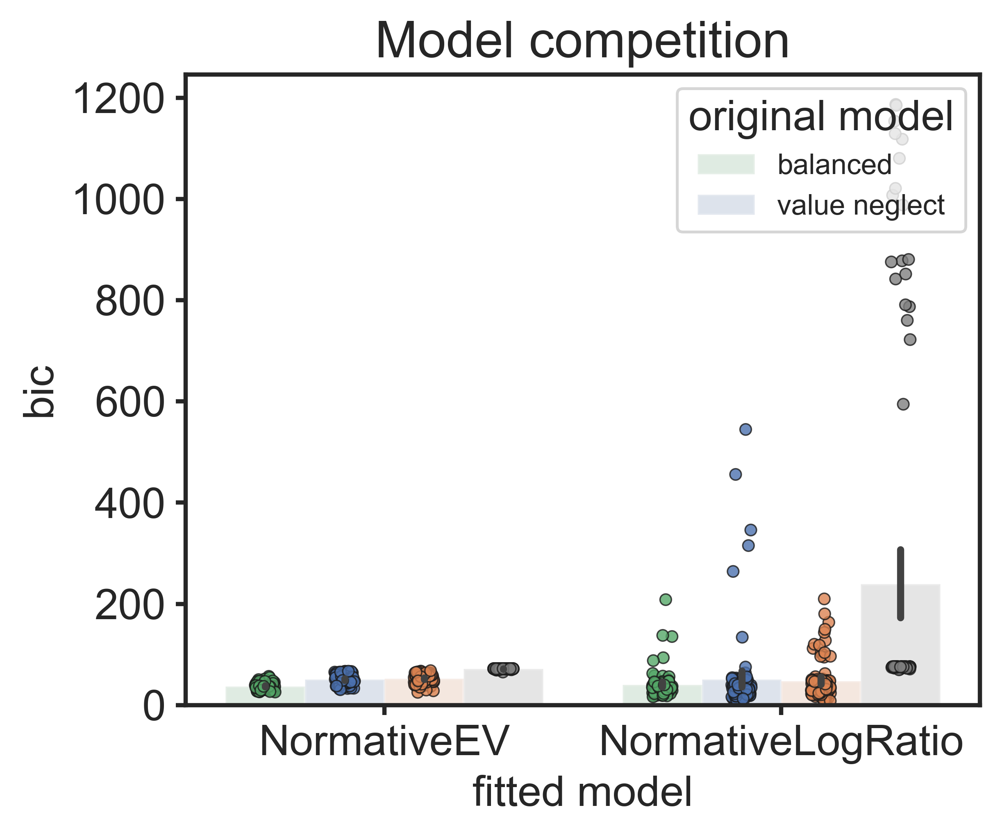

In [ ]:
# compute BIC 
d.loc[d.model=='NormativeLogRatio', 'bic'] = -2*-d[d.model=='NormativeLogRatio'].ll + np.log(ntrials)*2
d.loc[d.model=='NormativeEV', 'bic'] = -2*-d[d.model=='NormativeEV'].ll + np.log(ntrials)*1

# compute AIC
d.loc[d.model=='NormativeLogRatio', 'aic'] = -2*-d[d.model=='NormativeLogRatio'].ll + 2*2
d.loc[d.model=='NormativeEV', 'aic'] = -2*-d[d.model=='NormativeEV'].ll + 2*1

# plot BIC 
plt.figure(figsize=(5, 4), dpi=500)
sns.barplot(x='model', y='bic', hue='original_model', data=d, alpha=.2, zorder=-1, errwidth=2.5, capsize=0)

sns.stripplot(x='model', y='bic', hue='original_model', data=d, dodge=True, size=4, alpha=.8, zorder=1, linewidth=.5, edgecolor='k')
plt.xlabel('fitted model')

# Plot the legend for stripplot only
handles, labels = plt.gca().get_legend_handles_labels()
stripplot_legend = plt.legend(handles[:2], labels[:2], title='original model', loc='upper right')
plt.xlabel('fitted model')
plt.title('Model competition')

# Remove the default legend
# plt.gca().get_legend().remove()



In [ ]:
# plot fitted temp as barplot
plt.figure(figsize=(4, 5), dpi=500)
dd = d[d.model=='NormativeEV']
sns.barplot(x='original_model', y='fitted_temp', data=dd, alpha=.2, zorder=-1)
sns.stripplot(x='original_model', y='fitted_temp', data=dd, linewidth=.5, s=7,
               edgecolor='black', zorder=1, palette=['C0', 'C1'])
# plot true temp as a dot
# sns.scatterplot(x='original_model', y='temp', data=dd, color='k', s=100)
plt.ylabel('fitted temperature')
# plt.ylim(1e5, 1e7)
plt.title('NormativeEV fitted')




ValueError: Could not interpret input 'original_model'

<Figure size 2000x2500 with 0 Axes>

(20.0, 100.0)

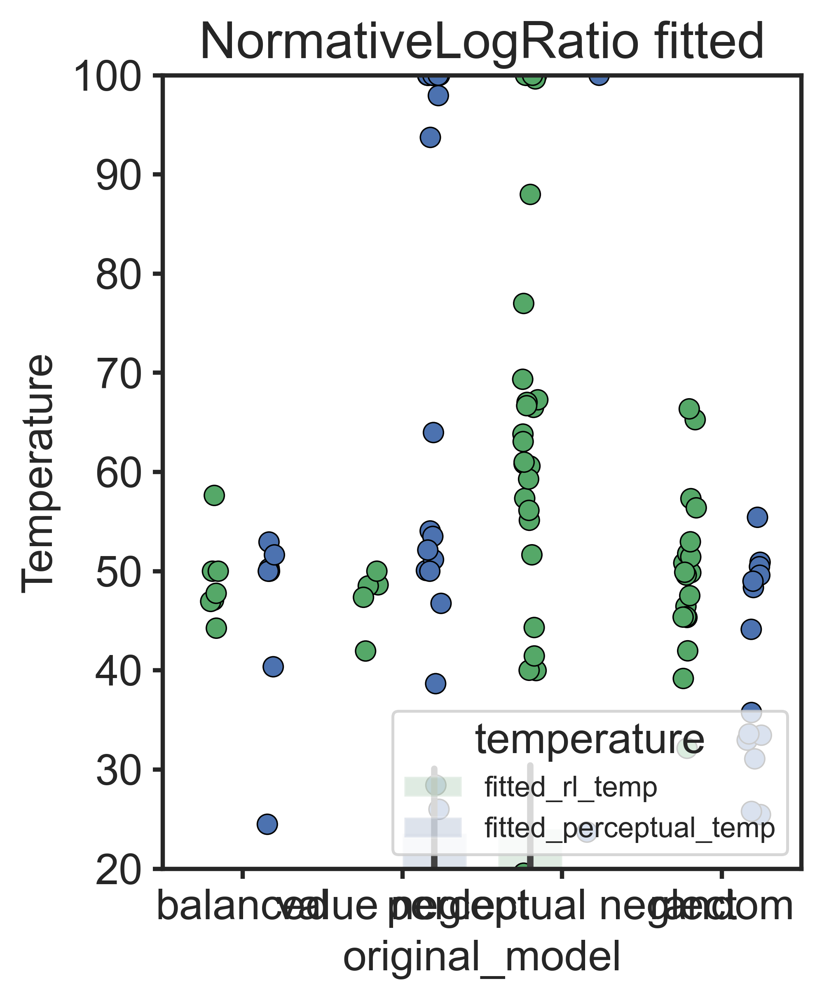

In [ ]:
plt.figure(figsize=(4, 5), dpi=500)
dd = d[d.model == 'NormativeLogRatio']

# Create a new DataFrame with the desired structure
df_combined = pd.DataFrame({
    'original_model': list(dd['original_model']) * 2,
    'variable': ['fitted_rl_temp'] * len(dd) + ['fitted_perceptual_temp'] * len(dd),
    'value': list(dd['fitted_rl_temp']) + list(dd['fitted_perceptual_temp'])
})

# Create a barplot with the new DataFrame
sns.barplot(
    x='original_model', y='value', hue='variable', data=df_combined, alpha=0.2)

# Add stripplot for additional data
sns.stripplot(
    x='original_model', y='value', hue='variable', data=df_combined, linewidth=0.5, s=7, edgecolor='black', zorder=1, dodge=True)

plt.ylabel('Temperature')
plt.title('NormativeLogRatio fitted')

# Customize the legend (optional)
# Plot the legend for stripplot only
handles, labels = plt.gca().get_legend_handles_labels()
stripplot_legend = plt.legend(handles[:2], labels[:2], title='temperature', loc='lower right')
plt.ylim([20, 100])



c:\Python312\Lib\site-packages\seaborn\categorical.py:3370: UserWarning: 6.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Python312\Lib\site-packages\seaborn\categorical.py:3370: UserWarning: 48.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


(0.0, 21.0)

c:\Python312\Lib\site-packages\seaborn\categorical.py:3370: UserWarning: 29.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


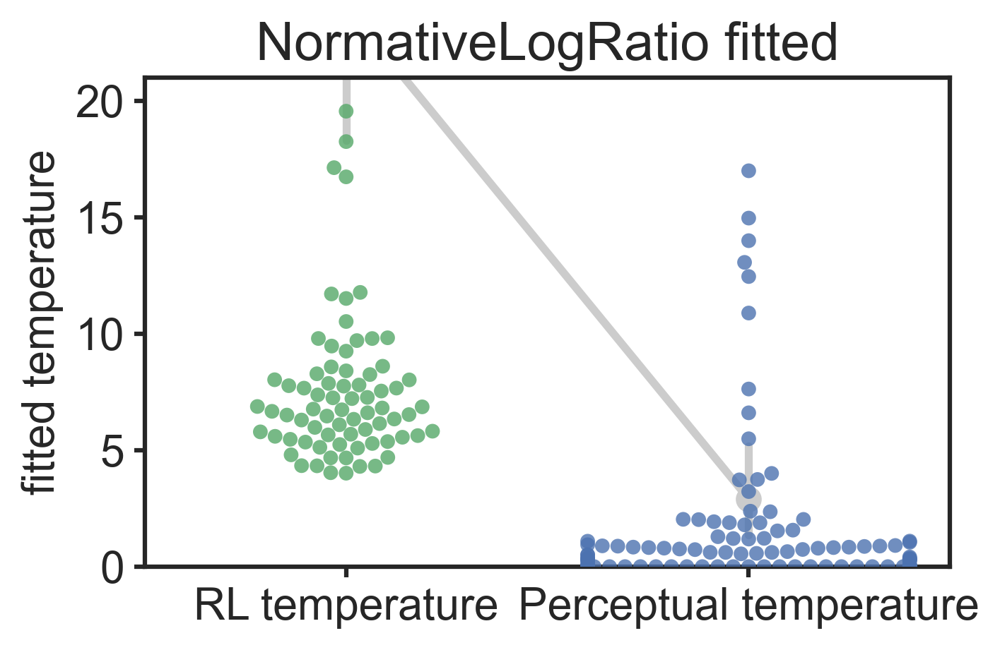

In [ ]:
# fitted rl temp and perceptual temp
plt.figure(figsize=(4.9, 3))
d3 = d[(d.model=='NormativeLogRatio') & (d.original_model=='perceptual neglect')]
# sns.barplot([d3['fitted_rl_temp'], d3['fitted_perceptual_temp']], alpha=.4)
# light grey color 
c = '#cccccc'
sns.pointplot([d3['fitted_rl_temp'], d3['fitted_perceptual_temp']], color=c)
sns.swarmplot([d3['fitted_rl_temp'], d3['fitted_perceptual_temp']], alpha=.8, zorder=2000)
# plt.ylim([5, 15])
plt.ylabel('fitted temperature')
plt.xticks([0, 1], ['RL temperature', 'Perceptual temperature'])
plt.title('NormativeLogRatio fitted')
plt.ylim([0, 21])

Text(0, 15, 'r=0.57, p=0.00')

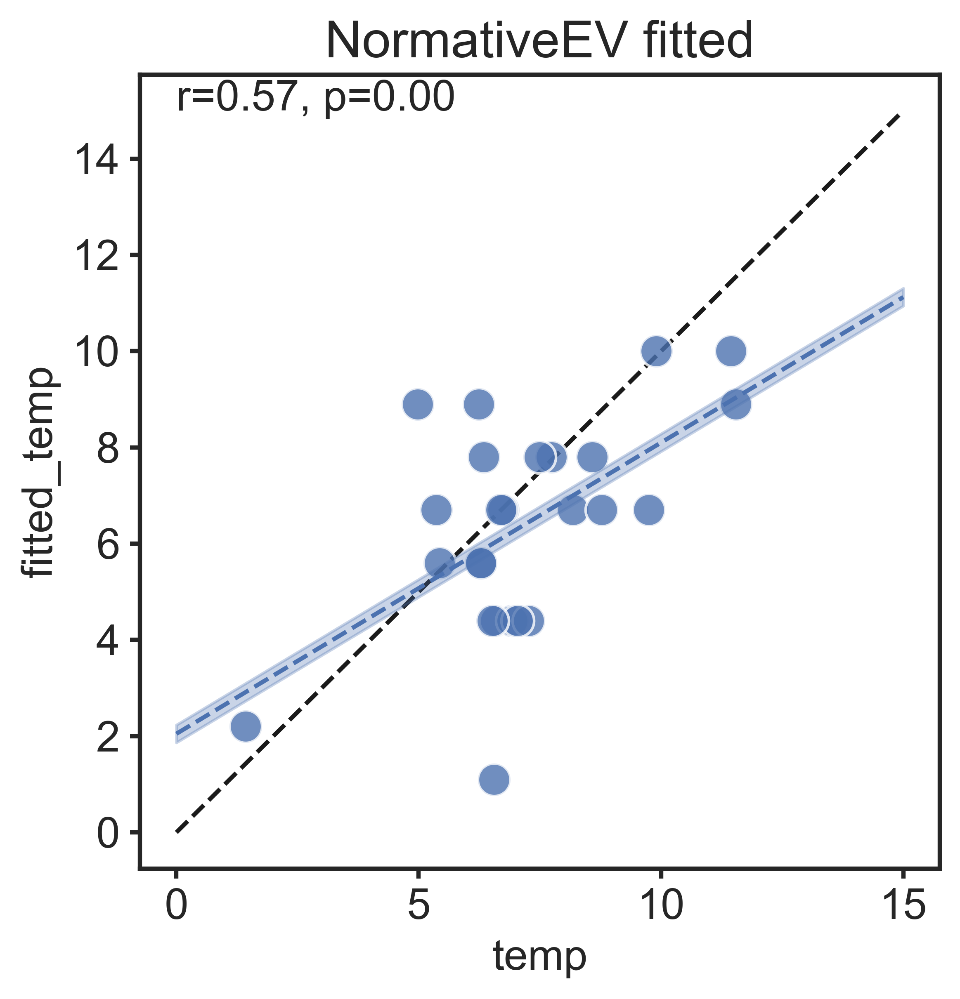

In [ ]:
# -----------------------------------------------------------------
# PLOT
# -----------------------------------------------------------------
max_ = 15
plt.figure(figsize=(5, 5), dpi=500)
d2 = d[(d.model=='NormativeEV') & (d.original_model=='NormativeEV')]
sns.scatterplot(x='temp', y='fitted_temp', data=d2, s=130, alpha=.8)
# plot identity
plt.plot([0, 15], [0, 15], color='k', linestyle='--', zorder=-1)
plt.title('NormativeEV fitted')
# return
# plot linear regression with scipy
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(d2['temp'], d2['fitted_temp'])
plt.plot([0, max_], [intercept, max_*slope+intercept], color='C0', linestyle='--')
# plot confidence interval
plt.fill_between([0, max_], [intercept-std_err, max_*slope+intercept-std_err], [intercept+std_err, max_*slope+intercept+std_err], alpha=.3, color='b')

from scipy.stats import pearsonr

r, p = pearsonr(d2['temp'].dropna(), d2['fitted_temp'].dropna())
plt.text(0, 15, f'r={r:.2f}, p={p:.2f}', fontdict={'fontsize': 15})

Text(2, 9, 'r=0.73, p=0.00')

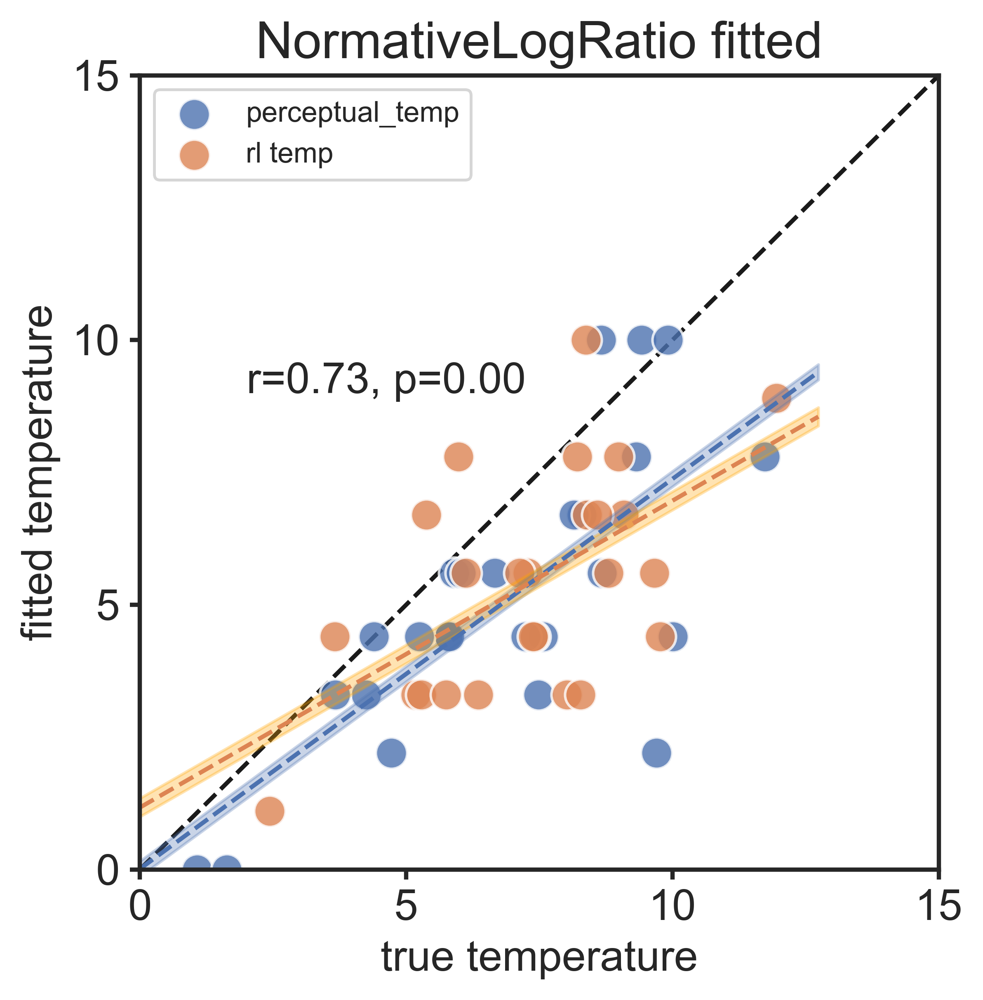

In [ ]:
#same for logratio
plt.figure(figsize=(5, 5), dpi=500)
d2 = d[(d.model=='NormativeLogRatio') & (d.original_model=='NormativeLogRatio')]
sns.scatterplot(x='perceptual_temp', y='fitted_perceptual_temp', data=d2, s=120, alpha=.8, label='perceptual_temp')
sns.scatterplot(x='rl_temp', y='fitted_rl_temp', data=d2, s=120, alpha=.8, label='rl temp')
# plot identity line by finding min and max + 1
max_ = max(d2['perceptual_temp'].max(), d2['fitted_perceptual_temp'].max()) + 1
plt.plot([0, 15], [0, 15], color='k', linestyle='--', zorder=-1)
plt.legend()
plt.title('NormativeLogRatio fitted')
plt.xlabel('true temperature')
plt.ylabel('fitted temperature')
plt.ylim([0, 15])
plt.xlim([0, 15])
# put same yticls and xticks labels
plt.yticks(np.arange(0, 16, 5))
plt.xticks(np.arange(0, 16, 5))

# add linear regression, confidence interval and pearson r
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(d2['perceptual_temp'], d2['fitted_perceptual_temp'])
plt.plot([0, max_], [intercept, max_*slope+intercept], color='C0', linestyle='--')
# plot confidence interval
plt.fill_between([0, max_], [intercept-std_err, max_*slope+intercept-std_err], [intercept+std_err, max_*slope+intercept+std_err], alpha=.3, color='b')

# same for rl temp
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(d2['rl_temp'], d2['fitted_rl_temp'])
plt.plot([0, max_], [intercept, max_*slope+intercept], color='C1', linestyle='--')
# plot confidence interval
plt.fill_between([0, max_], [intercept-std_err, max_*slope+intercept-std_err], [intercept+std_err, max_*slope+intercept+std_err], alpha=.3, color='orange')

# pearson r
from scipy.stats import pearsonr
r, p = pearsonr(d2['perceptual_temp'].dropna(), d2['fitted_perceptual_temp'].dropna())
plt.text(2, 9, f'r={r:.2f}, p={p:.2f}', fontdict={'fontsize': 15})


# plot identity
# plt.plot([0, 10], [0, 15], color='k', linestyle='--')

In [ ]:
# data frame to store the results
dfsim = []
# define progress bar
pbar = tqdm(total=nagents*len(models))

# model parameters
normative_param1 = dict(delta_prior=.2, slope_prior=true_slope, temp=10, x=ff_values, leak=0)
normative_param2 = dict(delta_prior=.2, slope_prior=true_slope, rl_temp=1e2, perceptual_temp=1e4, 
x=ff_values, leak=0)

hybrid_param = dict(perceptual_temp=1e6, perceptual_model='logit', x=ff_values,
    lr=.5, rl_temp=1e6, n_states=2, n_actions=2, q0=np.mean(blocks))

params = (normative_param1, normative_param2, {})
models = (NormativeEV, NormativeLogRatio, RandomModel)

# -----------------------------------------------------------------
# RUN
# -----------------------------------------------------------------
agent_id = 0
for agent in range(nagents):
    for model, param in zip(models, params):
        
        d = d[d.agent==agent]

        p_temp = d.fitted_perceptual_temp.values[0]
        rl_temp = d.fitted_rl_temp.values[0]
        temp = d.fitted_temp.values[0]

        param.update({'perceptual_temp': p_temp, 'rl_temp': rl_temp})
        param.update({'temp': temp})
        
        m = model(**param)

        df2 = df[df.agent==agent]
        s = df2.s.values
        ff1, ff2, ffp1, ffp2 = \
            df2.ff1.values, df2.ff2.values, df2.ffp1.values, df2.ffp2.values
        ntrials = df2.trial.max()

        for t in range(ntrials):
            
            # state = s = block index
            s = block_idx[t]

            # make choice
            a = m.make_choice(s, ff1[t], ff2[t])
            
            ffp_chosen = [ffp1[t], ffp2[t]][a]
            ffp_unchosen = [ffp1[t], ffp2[t]][1-a]

            ff_chosen = [ff1[t], ff2[t]][a]
            ff_unchosen = [ff1[t], ff2[t]][1-a]
            
            destroy = np.random.random() < ffp_chosen
            
            m.learn_perceptual(ff_chosen, destroy)

            r = 0
            
            if destroy:
                r = tnormrdn(blocks[s][a], std)
                m.learn_value(s, a, r)
                
            optimal_option = a==0
            optimal_ev = (ffp_chosen*blocks[s][a])  > (ffp_unchosen*blocks[s][1-a])
            optimal_ff = ffp_chosen >= ffp_unchosen

            cumulative_reward += r

            dfsim.append(
                {
                    'temp': param.get('temp'),
                    'perceptual_temp': param.get('perceptual_temp'),
                    'rl_temp': param.get('rl_temp'),
                    'ff1': ff1[t],
                    'ff2': ff2[t],
                    'ffp1': ffp1[t],
                    'ffp2': ffp2[t],
                    'trial': t,
                    'model': str(model.__name__),
                    'agent': agent_id,
                    's': s,
                    'a': a,
                    'r': r,
                    'optimal_option': optimal_option,
                    'optimal_ev': optimal_ev,
                    'optimal_ff': optimal_ff,
                    'choice': ff[a],
                    'params': m.get_params(s=s),
                    'destroy': destroy,
                    'cumulative_reward': cumulative_reward
                }
            )
            
        pbar.update()

dfsim = pd.DataFrame(dfsim)
# unpack parameters
# tqdm.pandas()

# refresh progress bar
pbar.refresh()
print('done')

In [ ]:
# example of using scipy.optimize.minimize
import numpy as np
from scipy.optimize import minimize

def rosen(x, *args):
    """The Rosenbrock function"""
    print(args)
    return sum(100.0*(x[1:]-x[:-1]**2.0)**2.0 + (1-x[:-1])**2.0)

x0 = np.array([1.3, 0.7, 0.8, 1.9, 1.2])
args = (1, 2, 3, 4)
res = minimize(rosen, x0, args=args, method='BFGS', options={'disp': True})

In [ ]:
sns.set({'figure.figsize': (12, 8)})
sns.set_style('ticks')

plt.subplot(1, 2, 1)
# plot dotted line at .5
plt.plot([0, 2], [.5, .5], color='grey', linestyle=':')
avg = df.groupby(['agent', 'model'], as_index=False).mean()
new_df = pd.DataFrame({'score': np.array([avg['optimal_option'], avg['optimal_ff'], avg['optimal_ev']]).flatten(), 'type': np.array(
    ['option',] * len(avg['optimal_option'])
    + ['forcefield',] * len(avg['optimal_ff'])
    + ['forcefield * option',] * len(avg['optimal_ev'])).flatten(),
    'model':np.array([avg['model'], avg['model'], avg['model']]).flatten()})

# replace barplot by distplot with dots
ax = sns.barplot(x='type', y='score', data=new_df,alpha=.5, zorder=0, hue='model', dodge=True)
plt.legend([],[], frameon=False)
sns.stripplot(x='type', y='score', data=new_df, hue='model', jitter=True, alpha=.8, size=8, zorder=1, dodge=True)
plt.ylabel('p(optimal)')
plt.xlabel('var')
plt.xticks([0, 1, 2], ['option', 'forcefield', 'forcefield * option'])
plt.ylim(0, 1)


plt.subplot(1,2, 2)
# plot dotted line at .5
# plt.plot([0, 2], [.5, .5], color='grey', linestyle=':')

last_trial = df[df['trial'] == df['trial'].max()]

ax = sns.barplot(x='model', y='cumulative_reward', data=last_trial, alpha=.5, zorder=0, width=.5)
sns.stripplot(x='model', y='cumulative_reward', data=last_trial, hue='model', jitter=.2, alpha=.8, size=8, zorder=1)
plt.show()

import pingouin as pg
pg.ttest(df[df['model'] == 'LogitRLEV']['cumulative_reward'], df[df['model'] == 'NormativeEV']['cumulative_reward'])



In [ ]:
sns.set({'figure.figsize': (18, 8)})
sns.set_style('ticks')

plt.subplot(2, 3, 1)
# plot dotted line at .5
plt.plot([0, 100], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='trial', y='correct_rl', hue='model', data=df)
plt.ylabel('p(choose best option)')
plt.ylim(0, 1 )

plt.subplot(2, 3, 2)
# plot dotted line at .5
plt.plot([0, 100], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='trial', y='correct_ff', data=df)
plt.ylabel('p(choose best forcefield)')
plt.ylim(0, 1 )

plt.subplot(2, 3, 4)
# plot dotted line at .5
plt.plot([0, 100], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='trial', y='correct_full', data=df)
plt.ylabel('p(choose best forcefield + option)')
plt.ylim(0, 1 )

plt.subplot(2, 3, 5)
# plot dotted line at .5
plt.plot([0, 100], [.5, .5], color='grey', linestyle=':')
sns.lineplot(x='trial', y='choice', data=df)
plt.ylabel('choice (option A = 0 ; option B = 1)')
plt.ylim(0, 1 )

plt.subplot(1, 3, 3)
# plot dotted line at .5
plt.plot([0, 3], [.5, .5], color='grey', linestyle=':')
avg = df.groupby('agent').mean()
# 1s column = score, 2nd colum type ('rl', 'ff', 'full')
new_df = pd.DataFrame({'score': np.array([avg['correct_rl'], avg['correct_ff'], avg['correct_full']]).flatten(), 'type': np.array(
    ['option',] * len(avg['correct_rl'])
    + ['forcefield',] * len(avg['correct_ff'])
    + ['forcefield + option',] * len(avg['correct_full'])).flatten()})

sns.barplot(x='type', y='score', data=new_df,alpha=.5, zorder=0)
sns.stripplot(x='type', y='score', data=new_df, hue='type', jitter=.2, alpha=.8, size=8, zorder=1)
plt.ylabel('p(choose best var)')
plt.xlabel('var')
plt.xticks([0,1,2], ['option', 'forcefield', 'forcefield + option'])
plt.ylim(0,1)



In [ ]:
#plot the distribution of model parameters
sns.set({'figure.figsize':(11,8)})
sns.set_style('ticks')

params = pd.DataFrame(
    {
        'param': np.array(
            ['lr', ] * nagents
          + ['rl_temp', ] * nagents
          + ['perceptual_temp', ] * nagents
        ).flatten(),
        'value': np.array(
            [agent.lr for agent in agents]
          + [agent.rl_temp for agent in agents]
          + [agent.perceptual_temp for agent in agents]
        ).flatten(),
    }
)

fig, ax = plt.subplots(ncols=2, nrows=1)
print(ax)

sns.displot(
    data=params,
    x='value',
    hue='param',
    kind='kde',
    fill=True,
    palette='colorblind',
    # split distributions  into 3 layers
    # (one for each parameter)
    # to make the plot more readable
    ax=ax[0]
    
)

d = df.groupby(['agent'], as_index=False).mean()
d.drop(['trial', 'choice', 'chosen_ff', 'unchosen', 'unchosen_ff', 'agent'], axis=1, inplace=True)
# Compute the correlation matrix
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax[1])


In [ ]:
# fig config
plt.rcParams['figure.figsize'] = [8, 5]
#  axes width * 1.5 
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5

sns.set_style('ticks')

if 'params' in df.columns:
    import warnings
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        df = pd.concat([df.drop(['params'], axis=1), df['params'].apply(pd.Series)], axis=1)

# plot evolution of parameters for each model
plt.figure()
sns.lineplot(x='trial', y='β', data=df[df['model']=='NormativeEV'], label='β', n_boot=0, errorbar='se')
# plot true slope
plt.plot([0, ntrials], [true_slope, true_slope], '--', color='k', label='true slope')
sns.despine(trim=True)

plt.figure()
mask = df.model == 'LogitRLEV'
sns.lineplot(x='trial', y='β', data=df[mask], label='β', n_boot=0, errorbar='se')
sns.lineplot(x='trial', y='α', data=df[mask], label='α', n_boot=0, errorbar='se')
# plot true slope
plt.plot([0, ntrials], [true_slope, true_slope], '--', color='k', label='true slope')
plt.ylabel(('value'))
sns.despine(trim=True)
plt.figure()
sns.lineplot(x='trial', y='σ', data=df[df.model=='NormativeEV'], label='σ', n_boot=0, errorbar='se')
# plot true delta (.2 & .4)
sns.lineplot(x=[0, ntrials], y=[blocks[0][0] - blocks[0][1]] * 2, ls='--', color='r', label='true σ (block 1)')
sns.lineplot(x=[0, ntrials], y=[blocks[1][0] - blocks[1][1]] * 2, ls='--', color='g', label='true σ (block 2)')
sns.despine(trim=True)